## Library

In [2]:
from wass2s import *
import datetime
import importlib
from pathlib import Path
import warnings
import gc
warnings.filterwarnings("ignore")

WARNING (pytensor.configdefaults): g++ not available, if using conda: `conda install gxx`
WARNING (pytensor.configdefaults): g++ not detected!  PyTensor will be unable to compile C-implementations and will default to Python. Performance may be severely degraded. To remove this warning, set PyTensor flags cxx to an empty string.


#### Set forecast working directory

In [3]:
# Set forecast working directory
dir_s2s =  "./PRCP_MAM_2026_ic_1/"
logopath = './utilities/LOGO_Sodexam.png' #'./utilities/agrhymet_logo_combined_reversed.png'
fcst_labels = ["EN DESSOUS DE LA MOYENNE", "PROCHE DE LA MOYENNE", "AU DESSUS DE LA MOYENNE"]#["EN DESSOUS DE LA MOYENNE", "PROCHE DE LA MOYENNE", "AU DESSUS DE LA MOYENNE"]
dist_method="bestfit" # nonparam or bestfit
country_iso3 = "CIV" # country ISO3 code 

In [4]:
dir_s2s = Path(dir_s2s)
os.makedirs(dir_s2s, exist_ok=True)
### Save consolidated results
hdcst_consolidated = {}
hdcst_consolidated_prob = {}
fcst_consolidated = {}
fcst_consolidated_prob = {}
scores_consolidated = {}
### Save score
dir_save_score = f"{dir_s2s}/scores"
os.makedirs(dir_save_score, exist_ok=True)
### Save forecasts
dir_to_forecast = f"{dir_s2s}/forecasts"
os.makedirs(dir_to_forecast, exist_ok=True)

#### Set Climatological Years

In [5]:
# Set Climatological Years
clim_year_start = 1994 #1991
clim_year_end = 2016 #2020

## Download Observation and Process 


#### Load Downloader 

In [6]:
# Load WAS_S2S downloader class
downloader = WAS_Download()

In [7]:
# Filter observation names to identify precipitation-related models
variables_obs = [key for key in downloader.AgroObsName().keys() if "PRCP" in key]

# Specify the directory to save downloaded model data
dir_to_save_Obs = f"{dir_s2s}/Observation"

# choose sequence corresponding to seasonal forecast targets (JAS season in this case)
season_obs = ["03", "04", "05"]  # July-August-September forecast period

# Define the observation period (years 1993 to 2016)
year_start = 1991
year_end = 2025

# Set the bounding box for the area of interest (latitude and longitude bounds)
extent_obs = [11, -9, 4, -2]  # [Northern, Western, Southern and Eastern] 

# Specify whether to overwrite existing files when downloading data
force_download = False

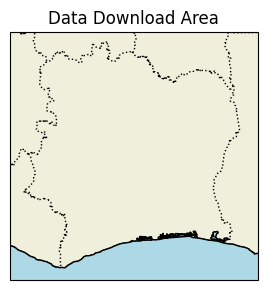

In [8]:
plot_map([extent_obs[1],extent_obs[3],extent_obs[2],extent_obs[0]], title="Data Download Area", fig_size=(4,3))

In [9]:
downloader.WAS_Download_AgroIndicators(
    dir_to_save_Obs,
    variables_obs,
    year_start,
    year_end,
    extent_obs,
    season_obs,
    force_download
)

PRCP_MAM_2026_ic_1\Observation\Obs_PRCP_1991_2025_MarAprMay.nc already exists. Skipping download.


In [10]:
#### Process predictant
rainfall = prepare_predictand(dir_to_save_Obs, variables_obs, year_start, year_end, season_obs, ds=False, daily=False)
season_str = "".join([calendar.month_abbr[int(month)] for month in season_obs])

#### Process Obs in combining with Seasonal cumulative Ground-Observation

In [11]:
# ## Path to the CPT file
cpt_input_file_path = "./MAM_1991-2025_CPT.csv"

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


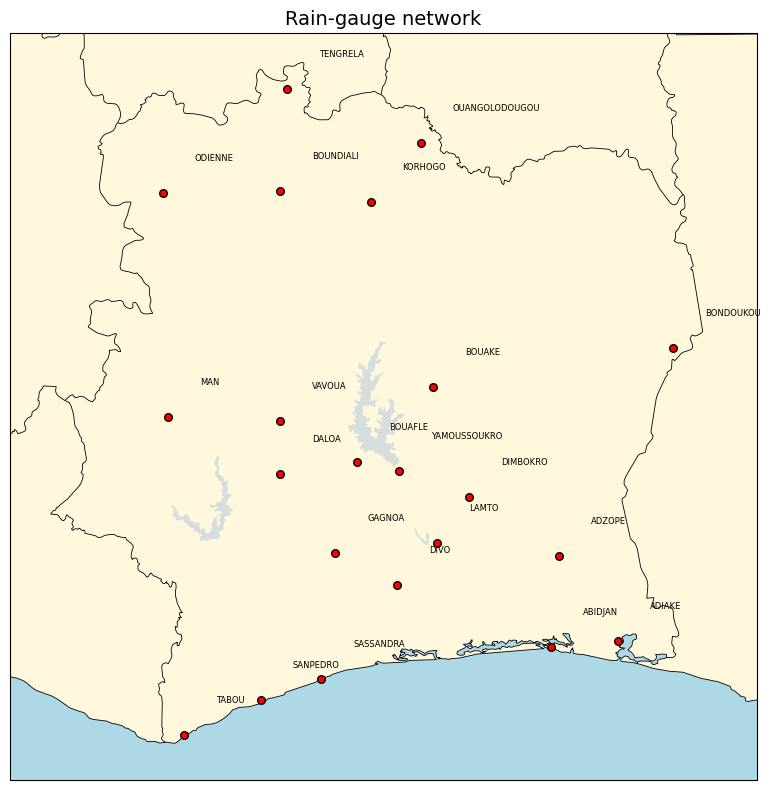

In [12]:
# ## Read CSV
df = pd.read_csv(cpt_input_file_path, na_values=-999.0,  encoding="latin1")
df_filtered = df[(df['STATION'] == 'LAT') | (df['STATION'] == 'LON') | 
                 (pd.to_numeric(df['STATION'], errors='coerce').between(year_start, year_end))]
verify_station_network(df_filtered, extent_obs)

In [13]:
da = prepare_predictand(dir_to_save_Obs, variables_obs, year_start, year_end, season_obs,  ds=False).sel(T=slice(str(year_start),str(year_end)))

In [17]:
### ## Instantiate WAS_Merging class
path_ = Path(dir_s2s / "rainfall_predictand.nc")
data_merger = WAS_Merging(df_filtered, da, date_month_day= '04-01')
if path_.is_file():
    rainfall__ = xr.load_dataarray(path_)
else:
    rainfall__, _ = data_merger.simple_bias_adjustment(do_cross_validation=False)
    rainfall__.to_netcdf(path_)

ValueError: cannot convert a DataFrame with a non-unique MultiIndex into xarray

In [18]:
data_merger.plot_merging_comparaison(df_filtered, da, rainfall__)

NameError: name 'rainfall__' is not defined

In [19]:
rainfall = rainfall__
rainfall.name = "PRCP"

NameError: name 'rainfall__' is not defined

#### Identify the parametric distribution that best fits the observations

In [20]:
if dist_method=="nonparam":
    pass
else:
    transf = WAS_TransformData(rainfall.sel(T=slice(str(clim_year_start),str(clim_year_end))), 
                      distribution_map={'norm': 1, 'lognorm': 2, 'gamma': 4,}, #'norm': 1, 'lognorm': 2, 'expon': 3, 'gamma': 4, 'weibull_min': 5, 't_dist': 6, "poisson":7, "nbinom":8 
                                n_clusters=1000)
    best_code_da, best_shape_da, best_loc_da, best_scale_da, _ = transf.fit_best_distribution(mode="grid")

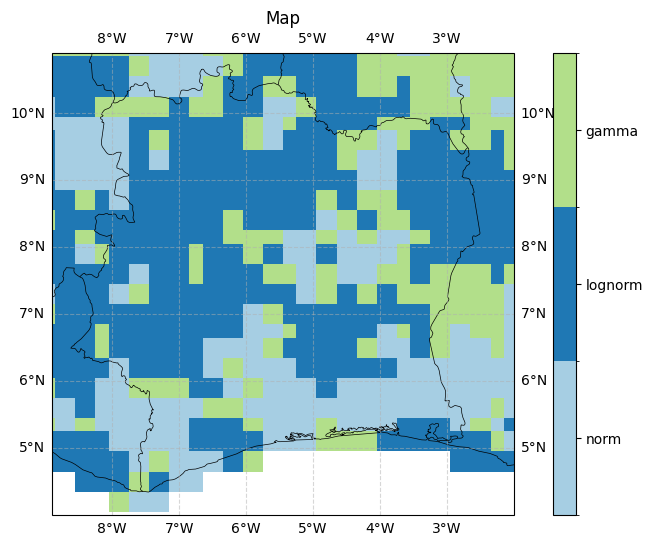

In [21]:
if dist_method=="bestfit":
    transf.plot_best_fit_map(best_code_da,
                             {'norm': 1, 'lognorm': 2, 'expon': 3, 'gamma': 4,
                              'weibull_min': 5, 't_dist': 6, "poisson":7, "nbinom":8},
                             show_plot=True)

# 1st - Approach: Skill-Verified, Machine Learning–Calibrated Multi-Model Ensemble (SV-ML-CMME)

In [24]:
# Filter model names to identify precipitation-related models
center_variable = [key for key in downloader.ModelsName().keys() if "PRCP" in key]
center_variable.remove('UKMO_603.PRCP')
center_variable.remove('DWD_21.PRCP')
center_variable.remove('METEOFRANCE_8.PRCP')
# Specify the directory to save downloaded model data
dir_to_save_model = f"{dir_s2s}/model_data"

# Define the month for model initialization (June)
month_of_initialization = "02"

# Define lead times corresponding to seasonal forecast targets (JAS season in this case)
lead_time = ["01", "02", "03"]  # July-August-September forecast period

# Define the hindcast period for model data (years 1993 to 2016)
year_start_model = 1993
year_end_model = 2016

# Set the bounding box for the area of interest (latitude and longitude bounds)
extent = [11, -9, 4, -2] # [Northern, Western, Southern and Eastern] 

# Define if you want to download forecast or hindcast
forecast = None

# Define if you want all members of ensemble or doing an ensemble mean
ensemble_mean = "mean"

# Specify whether to overwrite existing files when downloading data
force_download = False

In [25]:
hindcast_files = downloader.WAS_Download_Models(
    dir_to_save_model,
    center_variable,
    month_of_initialization,
    lead_time,
    year_start_model,
    year_end_model,
    extent, 
    forecast,
    ensemble_mean,
    force_download)

2026-02-21 11:47:21,032 INFO Request ID is 01113ff6-6061-4088-bff1-a7dcefffd7a8
2026-02-21 11:47:21,207 INFO status has been updated to accepted
2026-02-21 11:47:35,416 INFO status has been updated to running
2026-02-21 11:47:54,718 WARNING Structural differences in grib fields detected when opening in xarray. Opening the grib file safely, however this may result in files with non-intuitive filenames.
2026-02-21 11:48:11,965 INFO status has been updated to successful


47f8b1eed630e02225e76d27e62b7b80.nc:   0%|          | 0.00/350k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_bom2_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_bom2_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for bom 2 PRCP to PRCP_MAM_2026_ic_1\model_data/hindcast_bom2_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 11:48:16,266 INFO Request ID is 21167951-35a2-4769-b2be-2be9b060ca9c
2026-02-21 11:48:16,402 INFO status has been updated to accepted
2026-02-21 11:48:30,547 INFO status has been updated to running
2026-02-21 11:48:49,837 INFO status has been updated to successful


50491df165dd57807b17ccae4cab25fb.nc:   0%|          | 0.00/317k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_ecmwf51_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_ecmwf51_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ecmwf 51 PRCP to PRCP_MAM_2026_ic_1\model_data/hindcast_ecmwf51_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 11:48:54,066 INFO Request ID is cbc3b13e-e550-4be7-9990-6a97cd0cef49
2026-02-21 11:48:54,220 INFO status has been updated to accepted
2026-02-21 11:49:08,416 INFO status has been updated to running
2026-02-21 11:49:44,967 INFO status has been updated to successful


6dadb35bfbab28666f967fbbc3c646e8.nc:   0%|          | 0.00/372k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_ukmo604_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_ukmo604_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ukmo 604 PRCP to PRCP_MAM_2026_ic_1\model_data/hindcast_ukmo604_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 11:49:49,583 INFO Request ID is 9108d5f0-7869-4103-a6d6-c4f22bb0e303
2026-02-21 11:49:49,756 INFO status has been updated to accepted
2026-02-21 11:49:58,511 INFO status has been updated to running
2026-02-21 11:50:23,055 INFO status has been updated to successful


dbde8849c96b4ccfc8d07c49a639e492.nc:   0%|          | 0.00/415k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance9_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance9_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for meteo_france 9 PRCP to PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance9_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 11:50:27,506 INFO Request ID is f318b0bb-6dfa-4a0d-8be4-6d9fc15ed860
2026-02-21 11:50:27,651 INFO status has been updated to accepted
2026-02-21 11:50:36,332 INFO status has been updated to running
2026-02-21 11:51:18,074 INFO status has been updated to successful


53a8f97de74611b278a4d1be11c3b877.nc:   0%|          | 0.00/463k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_dwd22_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_dwd22_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for dwd 22 PRCP to PRCP_MAM_2026_ic_1\model_data/hindcast_dwd22_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 11:51:22,453 INFO Request ID is 3702bd4b-65a1-4ae8-be34-db325ae77413
2026-02-21 11:51:22,636 INFO status has been updated to accepted
2026-02-21 11:51:36,714 INFO status has been updated to running
2026-02-21 11:52:13,317 INFO status has been updated to successful


eaf1aa5e9a73179561ee6e8b73521560.nc:   0%|          | 0.00/601k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_cmcc35_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_cmcc35_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for cmcc 35 PRCP to PRCP_MAM_2026_ic_1\model_data/hindcast_cmcc35_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 11:52:17,851 INFO Request ID is 268054ba-312f-4c00-975f-ff27dbbd109a
2026-02-21 11:52:18,017 INFO status has been updated to accepted
2026-02-21 11:52:32,551 INFO status has been updated to running
2026-02-21 11:53:34,893 INFO status has been updated to successful


b914682f575326464f542d0b00abfc0c.nc:   0%|          | 0.00/319k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_ncep2_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_ncep2_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ncep 2 PRCP to PRCP_MAM_2026_ic_1\model_data/hindcast_ncep2_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 11:53:39,410 INFO Request ID is efc8e44f-8cbb-47a5-ba1a-e7fec8fb596d
2026-02-21 11:53:39,571 INFO status has been updated to accepted
2026-02-21 11:53:50,490 INFO status has been updated to running
2026-02-21 11:54:15,380 INFO status has been updated to successful


91b63642e2d35561f78fcbf73f614f37.nc:   0%|          | 0.00/97.6k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_jma3_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_jma3_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for jma 3 PRCP to PRCP_MAM_2026_ic_1\model_data/hindcast_jma3_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 11:54:19,854 INFO Request ID is 02cda9ab-89d5-4e9e-a0a7-3c3c4d0d6620
2026-02-21 11:54:20,028 INFO status has been updated to accepted
2026-02-21 11:54:34,086 INFO status has been updated to running
2026-02-21 11:54:53,369 INFO status has been updated to successful


84ce409aa1aa40654e4142aea2da0c91.nc:   0%|          | 0.00/310k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_eccc4_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_eccc4_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for eccc 4 PRCP to PRCP_MAM_2026_ic_1\model_data/hindcast_eccc4_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 11:54:58,061 INFO Request ID is 80c20503-2dd4-4b0e-a2d5-425afd50f8e5
2026-02-21 11:54:58,204 INFO status has been updated to accepted
2026-02-21 11:55:07,502 INFO status has been updated to running
2026-02-21 11:55:20,551 INFO status has been updated to successful


58012b8cd3f10d57e38a7f5812b93843.nc:   0%|          | 0.00/314k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_eccc5_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_eccc5_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for eccc 5 PRCP to PRCP_MAM_2026_ic_1\model_data/hindcast_eccc5_PRCP_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download cfsv2_precip_hcst_Febic_3-5_1992-2021.txt


cfsv2_precip_hcst_Febic_3-5_1991-2020.txt: 22.5MB [00:12, 1.84MB/s]


Download finished for cfsv2 1 precip to PRCP_MAM_2026_ic_1\model_data/hindcast_cfsv21_PRCP_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download cmc1_precip_hcst_Febic_3-5_1992-2021.txt


cmc1_precip_hcst_Febic_3-5_1991-2020.txt: 22.6MB [00:14, 1.56MB/s]


Download finished for cmc1 1 precip to PRCP_MAM_2026_ic_1\model_data/hindcast_cmc11_PRCP_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download cmc2_precip_hcst_Febic_3-5_1992-2021.txt


cmc2_precip_hcst_Febic_3-5_1991-2020.txt: 22.5MB [00:15, 1.49MB/s]


Download finished for cmc2 1 precip to PRCP_MAM_2026_ic_1\model_data/hindcast_cmc21_PRCP_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download gfdl_precip_hcst_Febic_3-5_1992-2021.txt
URL returned status code 404. Skipping download.
failed to download gfdl_precip_hcst_Febic_3-5_1991-2020.txt
URL returned status code 404. Skipping download.
failed to download nasa_precip_hcst_Febic_3-5_1992-2021.txt


nasa_precip_hcst_Febic_3-5_1991-2020.txt: 22.6MB [00:18, 1.25MB/s]


Download finished for nasa 1 precip to PRCP_MAM_2026_ic_1\model_data/hindcast_nasa1_PRCP_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download ncar_ccsm4_precip_hcst_Febic_3-5_1992-2021.txt


ncar_ccsm4_precip_hcst_Febic_3-5_1991-2020.txt: 22.2MB [00:13, 1.62MB/s]


Download finished for ncar_ccsm4 1 precip to PRCP_MAM_2026_ic_1\model_data/hindcast_ncarccsm41_PRCP_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download ncar_cesm1_precip_hcst_Febic_3-5_1992-2021.txt


ncar_cesm1_precip_hcst_Febic_3-5_1991-2020.txt: 22.2MB [00:15, 1.45MB/s]


Download finished for ncar_cesm1 1 precip to PRCP_MAM_2026_ic_1\model_data/hindcast_ncarcesm11_PRCP_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download nmme_precip_hcst_Febic_3-5_1992-2021.txt


nmme_precip_hcst_Febic_3-5_1991-2020.txt: 22.3MB [00:14, 1.57MB/s]


Download finished for nmme 1 precip to PRCP_MAM_2026_ic_1\model_data/hindcast_nmme1_PRCP_FebIc_MarAprMay_01.nc


In [26]:
forecast = 2026

In [27]:
forecast_files = downloader.WAS_Download_Models(
    dir_to_save_model,
    center_variable,
    month_of_initialization,
    lead_time,
    year_start_model,
    year_end_model,
    extent, 
    forecast,
    ensemble_mean,
    force_download)

2026-02-21 11:58:15,370 INFO Request ID is d59b1db1-b902-4e65-aef5-5168c422ea86
2026-02-21 11:58:15,546 INFO status has been updated to accepted
2026-02-21 11:58:24,576 INFO status has been updated to running
2026-02-21 11:58:29,809 WARNING Structural differences in grib fields detected when opening in xarray. Opening the grib file safely, however this may result in files with non-intuitive filenames.
2026-02-21 11:58:37,552 INFO status has been updated to successful


37e48a0a6e758993c05f17f17075f7ea.nc:   0%|          | 0.00/87.7k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_bom2_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_bom2_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for bom 2 PRCP to PRCP_MAM_2026_ic_1\model_data/forecast_bom2_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 11:58:41,989 INFO Request ID is c8088f60-e517-4026-a62b-3c392813c13b
2026-02-21 11:58:42,123 INFO status has been updated to accepted
2026-02-21 11:58:50,428 INFO status has been updated to running
2026-02-21 11:58:59,174 INFO status has been updated to successful


63574bf87e4fc2f952787be9cad333f.nc:   0%|          | 0.00/52.8k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_ecmwf51_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_ecmwf51_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ecmwf 51 PRCP to PRCP_MAM_2026_ic_1\model_data/forecast_ecmwf51_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 11:59:04,697 INFO Request ID is e56a3d02-f89f-4b08-a310-a774de850d60
2026-02-21 11:59:07,174 INFO status has been updated to accepted
2026-02-21 11:59:18,209 INFO status has been updated to running
2026-02-21 12:00:26,087 INFO status has been updated to successful


aa861d85e808f9b4dd8b661a06085a4d.nc:   0%|          | 0.00/58.2k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_ukmo604_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_ukmo604_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ukmo 604 PRCP to PRCP_MAM_2026_ic_1\model_data/forecast_ukmo604_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 12:00:30,515 INFO Request ID is 1144d339-84b5-41f2-ba1e-38bc65ced3c2
2026-02-21 12:00:30,683 INFO status has been updated to accepted
2026-02-21 12:00:44,881 INFO status has been updated to running
2026-02-21 12:00:52,628 INFO status has been updated to successful


9f0108b73fd304aa803acffd5cc4b8ea.nc:   0%|          | 0.00/54.8k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_meteofrance9_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_meteofrance9_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for meteo_france 9 PRCP to PRCP_MAM_2026_ic_1\model_data/forecast_meteofrance9_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 12:00:56,690 INFO Request ID is 42cf1893-9fd1-4989-b68b-c8b695d8f912
2026-02-21 12:00:56,827 INFO status has been updated to accepted
2026-02-21 12:01:10,815 INFO status has been updated to running
2026-02-21 12:01:18,557 INFO status has been updated to successful


7c712fa0c9f66f499adc853e9e41ec18.nc:   0%|          | 0.00/57.3k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_dwd22_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_dwd22_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for dwd 22 PRCP to PRCP_MAM_2026_ic_1\model_data/forecast_dwd22_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 12:01:22,880 INFO Request ID is e214e89e-27d0-42b4-a551-3c33bd99c3a4
2026-02-21 12:01:23,019 INFO status has been updated to accepted
2026-02-21 12:01:37,162 INFO status has been updated to failed


Failed to download data for PRCP: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/e214e89e-27d0-42b4-a551-3c33bd99c3a4/results
The job has failed
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': ['11', '-9', '4', '-2'], 'fcmonth': ['01', '02', '03'], 'origin': ['cmcc'], 'type': ['fcmean'], 'system': ['35'], 'param': ['172228'], 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['sfc'], 'database': 'ecmwf', 'date': ['2026-02-01']}]

The job failed with: MarsNoDataError


2026-02-21 12:01:39,089 INFO Request ID is d7248a54-2ca2-4fcc-9fe4-9dc9d2a38b8a
2026-02-21 12:01:39,240 INFO status has been updated to accepted
2026-02-21 12:01:47,945 INFO status has been updated to running
2026-02-21 12:02:00,890 INFO status has been updated to successful


1d5f5bd0257bc115876c951c1cca0fb2.nc:   0%|          | 0.00/89.0k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_ncep2_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_ncep2_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ncep 2 PRCP to PRCP_MAM_2026_ic_1\model_data/forecast_ncep2_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 12:02:05,062 INFO Request ID is 283060b9-533b-4355-9d19-41810221c53a
2026-02-21 12:02:05,216 INFO status has been updated to accepted
2026-02-21 12:02:14,424 INFO status has been updated to failed


Failed to download data for PRCP: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/283060b9-533b-4355-9d19-41810221c53a/results
The job has failed
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': ['11', '-9', '4', '-2'], 'fcmonth': ['01', '02', '03'], 'origin': ['rjtd'], 'type': ['fcmean'], 'system': ['3'], 'param': ['172228'], 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['sfc'], 'database': 'ecmwf', 'date': ['2026-02-01']}]

The job failed with: MarsNoDataError


2026-02-21 12:02:16,862 INFO Request ID is 2b67855f-821d-406b-9c28-5092227faa57
2026-02-21 12:02:16,998 INFO status has been updated to accepted
2026-02-21 12:02:26,028 INFO status has been updated to running
2026-02-21 12:02:38,989 INFO status has been updated to successful


da8853a0a809fa5743b1ed21d086337c.nc:   0%|          | 0.00/38.9k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_eccc4_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_eccc4_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for eccc 4 PRCP to PRCP_MAM_2026_ic_1\model_data/forecast_eccc4_PRCP_FebIc_MarAprMay_01.nc


2026-02-21 12:02:43,152 INFO Request ID is 07131fc8-641f-4c49-9e33-ca89ecc40479
2026-02-21 12:02:43,273 INFO status has been updated to accepted
2026-02-21 12:02:57,242 INFO status has been updated to running
2026-02-21 12:03:04,965 INFO status has been updated to successful


53c3a4cfb548f7d21831bd639b994cc.nc:   0%|          | 0.00/39.0k [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_eccc5_PRCP_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_eccc5_PRCP_FebIc_MarAprMay_01.nc
Download finished, combined dataset for eccc 5 PRCP to PRCP_MAM_2026_ic_1\model_data/forecast_eccc5_PRCP_FebIc_MarAprMay_01.nc


cfsv2_precip_fcst_Febic_3-5_2026-2026.txt: 749kB [00:00, 1.02MB/s]


Download finished for cfsv2 1 precip to PRCP_MAM_2026_ic_1\model_data/forecast_cfsv21_PRCP_FebIc_MarAprMay_01.nc


cmc1_precip_fcst_Febic_3-5_2026-2026.txt: 755kB [00:00, 826kB/s] 


Download finished for cmc1 1 precip to PRCP_MAM_2026_ic_1\model_data/forecast_cmc11_PRCP_FebIc_MarAprMay_01.nc


cmc2_precip_fcst_Febic_3-5_2026-2026.txt: 751kB [00:00, 1.05MB/s]


Download finished for cmc2 1 precip to PRCP_MAM_2026_ic_1\model_data/forecast_cmc21_PRCP_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download gfdl_precip_fcst_Febic_3-5_2026-2026.txt


nasa_precip_fcst_Febic_3-5_2026-2026.txt: 751kB [00:00, 848kB/s] 


Download finished for nasa 1 precip to PRCP_MAM_2026_ic_1\model_data/forecast_nasa1_PRCP_FebIc_MarAprMay_01.nc


ncar_ccsm4_precip_fcst_Febic_3-5_2026-2026.txt: 740kB [00:00, 812kB/s] 


Download finished for ncar_ccsm4 1 precip to PRCP_MAM_2026_ic_1\model_data/forecast_ncarccsm41_PRCP_FebIc_MarAprMay_01.nc


ncar_cesm1_precip_fcst_Febic_3-5_2026-2026.txt: 742kB [00:03, 220kB/s] 


Download finished for ncar_cesm1 1 precip to PRCP_MAM_2026_ic_1\model_data/forecast_ncarcesm11_PRCP_FebIc_MarAprMay_01.nc


nmme_precip_fcst_Febic_3-5_2026-2026.txt: 745kB [00:00, 824kB/s] 

Download finished for nmme 1 precip to PRCP_MAM_2026_ic_1\model_data/forecast_nmme1_PRCP_FebIc_MarAprMay_01.nc


In [28]:
hindcast_files = {k: hindcast_files[k] for k in hindcast_files.keys() & forecast_files.keys()}
forecast_files = {k: forecast_files[k] for k in hindcast_files.keys() & forecast_files.keys()}
common_keys = {k.lower() for k in hindcast_files} & {k.lower() for k in forecast_files}
center_variable = [
    item
    for item in center_variable
    if any(item.lower().startswith(k) for k in list(common_keys))
                ]

In [29]:
was_verify = WAS_Verification(dist_method=dist_method, mae_rmse_crps_thrsd=200)

#### Validation of GCM

In [30]:
score = ["Pearson", "MAE"]

Pearson Correlation


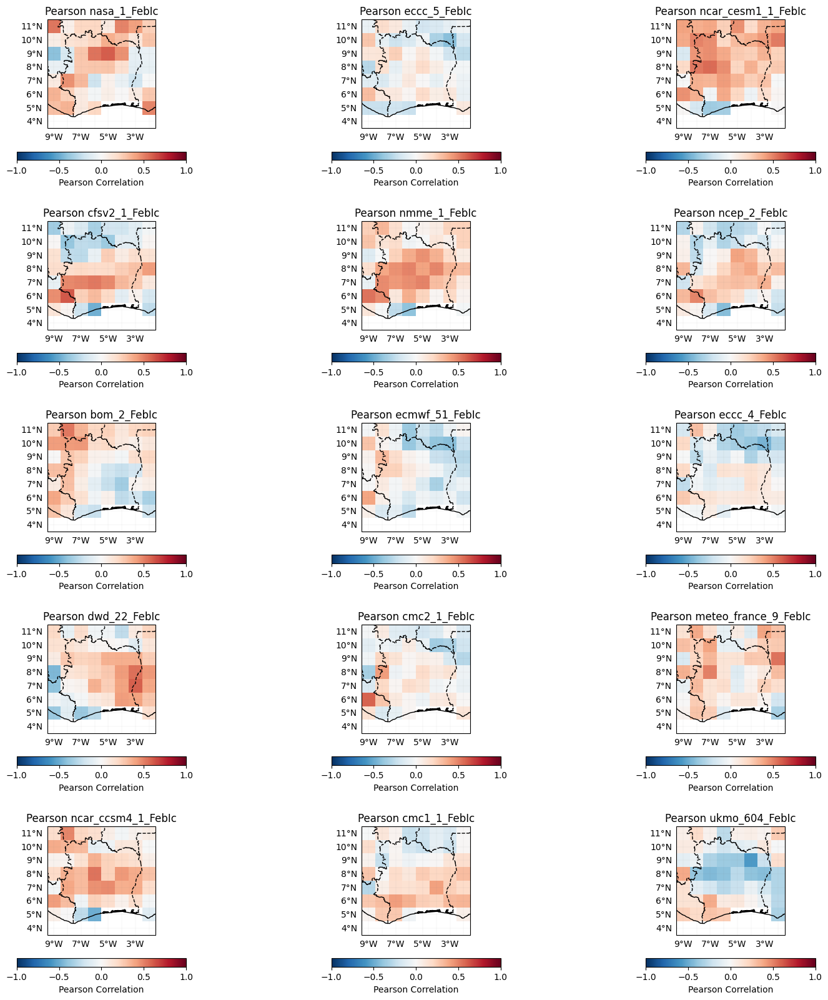

Mean Absolute Error


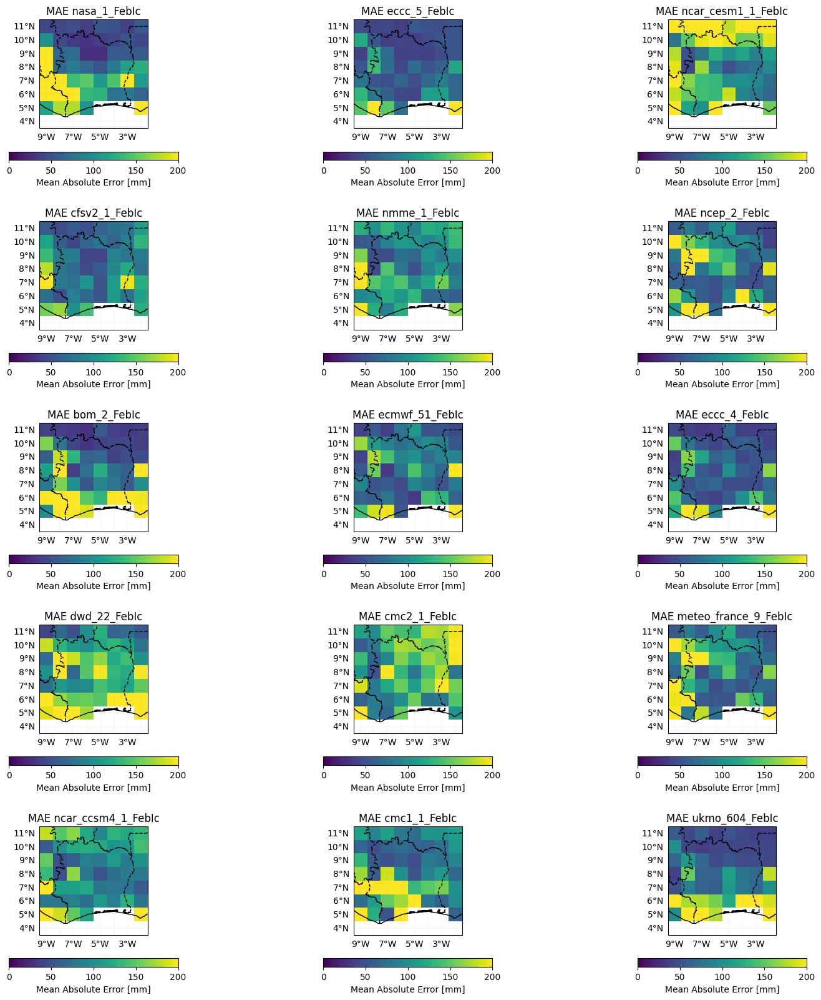

In [31]:
# score.append('GROC') if 'GROC' not in score else score
os.makedirs(dir_save_score, exist_ok=True)
scores = {}
for i in score:
    scores[i] = was_verify.gcm_validation_compute(hindcast_files, rainfall, i, month_of_initialization, clim_year_start, clim_year_end, dir_save_score, lead_time = None, ensemble_mean=None, gridded=True)
    print(was_verify.scores[i][0])
    was_verify.plot_models_score(scores[i], i, dir_save_score)
    r = scores[i]

# SV-ML-CMME

## Choice of best GCM models

In [32]:
best_models = get_best_models(center_variable, scores, metric='MAE', threshold=150, top_n=8, gcm=True)
best_models 

['ECCC_5.PRCP',
 'CFSV2_1.PRCP',
 'NMME_1.PRCP',
 'ECCC_4.PRCP',
 'ECMWF_51.PRCP',
 'NCAR_CCSM4_1.PRCP',
 'NASA_1.PRCP',
 'NCEP_2.PRCP']

In [33]:
%load_ext autoreload
%autoreload 2

### MLP

In [34]:
# from scipy.stats import loguniform
model = WAS_mme_MLP(
    hidden_layer_sizes_range=[
        (2,4), (4,2),
        (8,2), (8,4),
        (16,8), (16,4), 
        (24,8), (24,16),
        (32,16),(32,24),
        # (15,10,5,2),
        # (30,), (50,),              # Moderate baseline
        # (60, 30), (100, 50),       # Compression funnels
        # (30, 15, 5)                # Deep funnel for complex non-linearities
    ],
    learning_rate_init_range=loguniform(1e-4, 1e-1),
    activation_options=['tanh'],# 'identity'],        
    solver_options=['adam','sgd'],#, 'lbfgs'],  # sgd, lbfgs         
    alpha_range=loguniform(1e-5, 1e-1),   
    search_method='bayesian',                              
    random_state=42,
    n_iter_search=20,  
    max_iter=5000,
    cv_folds=5,
    n_clusters=2,
    dist_method=dist_method,
    optuna_n_jobs=-1,
    optuna_timeout=1800
)

#### Cross-validation

In [35]:
# all_model_hdcst, all_model_fcst, obs, best_score = process_datasets_for_mme(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), gcm=True, ELM_ELR=True, dir_to_save_model=dir_to_save_model, best_models=best_models, scores=scores, year_start=year_start_model, year_end=year_end_model, model=True, month_of_initialization=month_of_initialization, lead_time=lead_time, year_forecast=forecast)
all_model_hdcst, all_model_fcst, obs, best_score = process_datasets_for_mme(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), hdcsted=hindcast_files, fcsted=forecast_files, scores= scores, score_metric='MAE', gcm=True, agroparam=False, ELM_ELR=False, best_models=best_models, dir_to_save_model=dir_to_save_model, year_start=year_start_model, year_end=year_end_model, model=True, month_of_initialization=month_of_initialization, lead_time=lead_time, year_forecast=forecast)

In [36]:
best_params, cluster = model.compute_hyperparameters(all_model_hdcst, obs, clim_year_start, clim_year_end)

[I 2026-02-21 12:07:20,442] A new study created in memory with name: no-name-11953cf4-07fa-4548-a78a-37a9de1932d7
[I 2026-02-21 12:07:45,047] Trial 1 finished with value: -1.520110333033801 and parameters: {'hidden_layer_sizes': (32, 24), 'activation': 'tanh', 'solver': 'adam', 'learning_rate_init': 0.0996742702572552, 'alpha': 0.01140914391822869}. Best is trial 1 with value: -1.520110333033801.
[I 2026-02-21 12:09:39,657] Trial 6 finished with value: -2.0837098399954574 and parameters: {'hidden_layer_sizes': (8, 4), 'activation': 'tanh', 'solver': 'sgd', 'learning_rate_init': 0.001150399427268195, 'alpha': 2.0366151770119717e-05}. Best is trial 1 with value: -1.520110333033801.
[I 2026-02-21 12:11:09,047] Trial 0 finished with value: -1.8338943765821605 and parameters: {'hidden_layer_sizes': (24, 8), 'activation': 'tanh', 'solver': 'sgd', 'learning_rate_init': 0.09335840815693383, 'alpha': 1.2640536607677102e-05}. Best is trial 1 with value: -1.520110333033801.
[I 2026-02-21 12:11:36

In [37]:
best_params #= {'activation': 'lin', 'neurons': 200, 'norm': 37.38460883888426}

{0.0: {'hidden_layer_sizes': (32, 24),
  'learning_rate_init': 0.09884351117636392,
  'activation': 'tanh',
  'solver': 'adam',
  'alpha': 0.006295885488098098},
 1.0: {'hidden_layer_sizes': (2, 4),
  'learning_rate_init': 0.0009360611064449625,
  'activation': 'tanh',
  'solver': 'sgd',
  'alpha': 1.555079706975235e-05}}

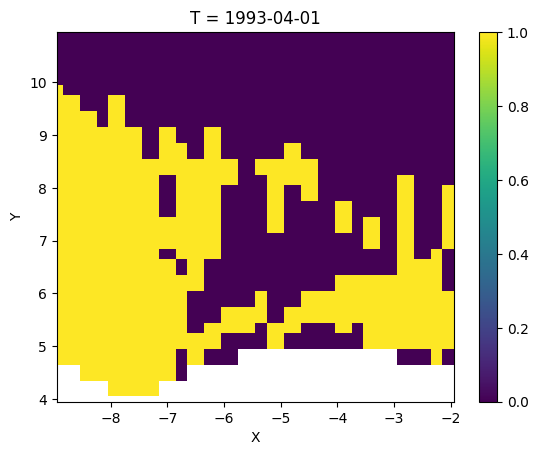

In [38]:
cluster.plot()

In [39]:
was_mme_gcm = WAS_Cross_Validator(n_splits=len(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))).get_index("T")), nb_omit=2)

In [40]:
if dist_method=="bestfit":
    hindcast_det_gcm, hindcast_prob_gcm, = was_mme_gcm.cross_validate(model, obs, all_model_hdcst, clim_year_start, 
                                                                  clim_year_end, best_params=best_params, cluster_da=cluster,
                                                                  best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
else:
    hindcast_det_gcm, hindcast_prob_gcm, = was_mme_gcm.cross_validate(model, obs, all_model_hdcst, clim_year_start,
                                                                  clim_year_end, best_params=best_params, cluster_da=cluster
                                                                     )    
hdcst_consolidated['SV-ML-CMME_MLP'] = hindcast_det_gcm
hdcst_consolidated_prob['SV-ML-CMME_MLP'] = hindcast_prob_gcm

Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [07:11<00:00, 17.97s/it]


In [41]:
was_verify = WAS_Verification(dist_method=dist_method, mae_rmse_crps_thrsd=250)

#### Verification

In [42]:
score = ['Pearson', 'MAE']
model_name = "MLP" #"Extreme Learning Machine" # Extreme Learning Machine "MultiLayer Perceptron" XGBoost Random Forest

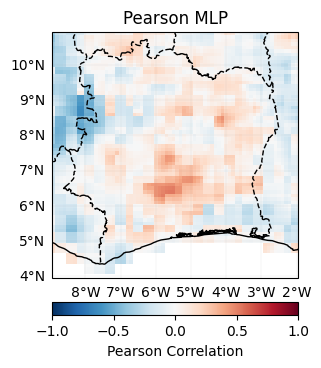

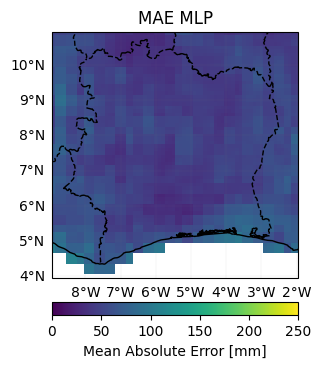

In [43]:
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall.sel(T=slice(str(year_start_model),str(year_end_model))),
        hindcast_det_gcm
    )
    scores_consolidated[i] = {'SV-ML-CMME_MLP': r}
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

##### Probabilistic

In [44]:
score = ['GROC', 'RPSS']

Generalized Discrimination Score


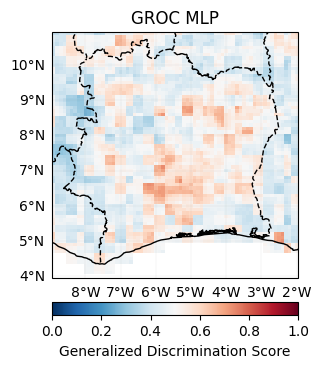

Ranked Probability Skill Score


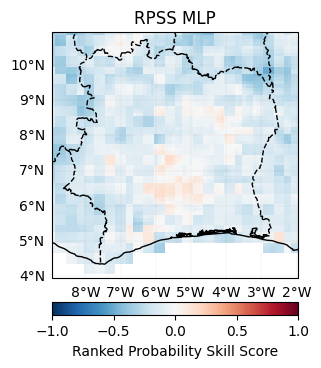

In [45]:
score = score.append('GROC') if 'GROC' not in score else score
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall.sel(T=slice(str(year_start_model),str(year_end_model))),
        hindcast_prob_gcm,
        clim_year_start,
        clim_year_end)
    scores_consolidated[i] = {'SV-ML-CMME_MLP': r}
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

#### Forecast 

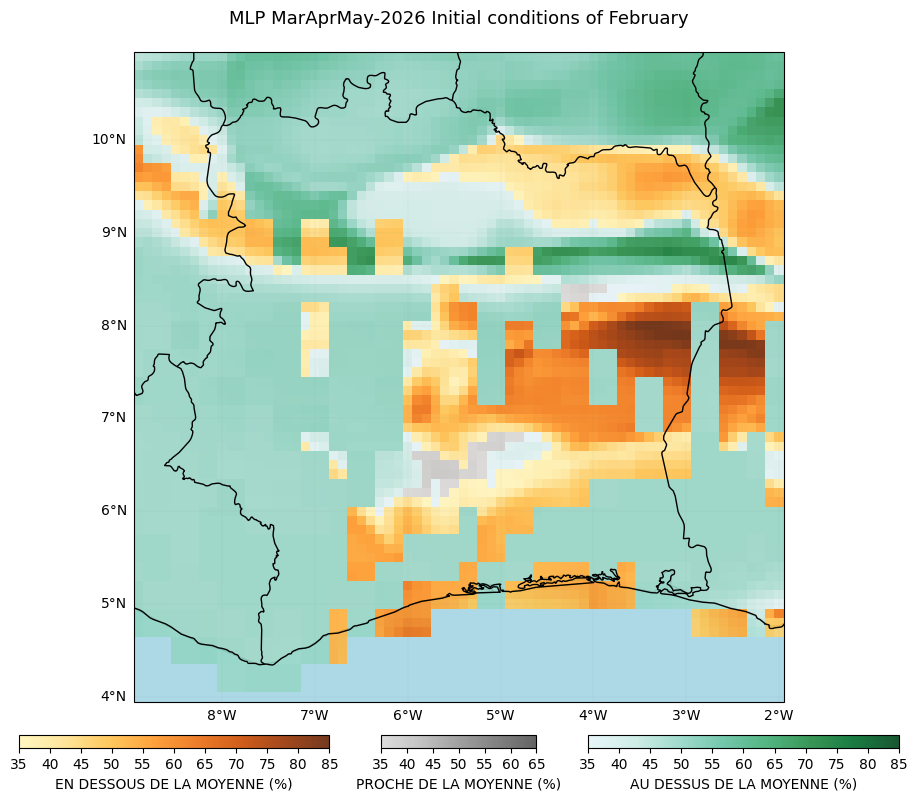

98497

In [46]:
if dist_method=="bestfit":
    forecast_det_gcm, forecast_prob_gcm= model.forecast(obs, clim_year_start, clim_year_end, all_model_hdcst, hindcast_det_gcm, all_model_fcst, best_params=best_params, cluster_da=cluster, 
                                                        best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
else:
    forecast_det_gcm, forecast_prob_gcm= model.forecast(obs, clim_year_start, clim_year_end, all_model_hdcst, hindcast_det_gcm, 
                                                        all_model_fcst, best_params=best_params, cluster_da=cluster
                                                       )
    
fcst_consolidated['SV-ML-CMME_MLP'] = forecast_det_gcm
fcst_consolidated_prob['SV-ML-CMME_MLP'] = forecast_prob_gcm
plot_prob_forecasts_(f"{dir_to_forecast}", forecast_prob_gcm.drop_vars('T').squeeze(), f"{model_name} {season_str}-{forecast} Initial conditions of {calendar.month_name[int(month_of_initialization)]}",
                    hspace=0.1, labels=fcst_labels, reverse_cmap=False)
gc.collect()

### Extreme Learning

In [47]:
model = WAS_mme_hpELM(neurons_range=[10, 25, 50, 100, 200, 400, 600],# 800, 1000, 1500],    
                        activation_options=['sigm', 'tanh', 'lin'],# lin, 'rbf_l1', 'rbf_l2' 'rbf_linf'],
                        norm_range=loguniform(1e-2, 1e2),            
                        random_state=42,
                        n_iter_search=200,                             
                        cv_folds=5,
                        dist_method=dist_method,
                        search_method='bayesian',
                        n_clusters=2,
                        n_trials_bayesian=100,
                        bayesian_sampler='tpe', #random or tpe
                        )

#### Cross-validation

In [48]:
# all_model_hdcst, all_model_fcst, obs, best_score = process_datasets_for_mme(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), gcm=True, ELM_ELR=True, dir_to_save_model=dir_to_save_model, best_models=best_models, scores=scores, year_start=year_start_model, year_end=year_end_model, model=True, month_of_initialization=month_of_initialization, lead_time=lead_time, year_forecast=forecast)
all_model_hdcst, all_model_fcst, obs, best_score = process_datasets_for_mme(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), hdcsted=hindcast_files, fcsted=forecast_files, scores= scores, score_metric='MAE', gcm=True, agroparam=False, ELM_ELR=False, best_models=best_models, dir_to_save_model=dir_to_save_model, year_start=year_start_model, year_end=year_end_model, model=True, month_of_initialization=month_of_initialization, lead_time=lead_time, year_forecast=forecast)

In [49]:
best_params, cluster = model.compute_hyperparameters(all_model_hdcst, obs, clim_year_start, clim_year_end)

[I 2026-02-21 12:50:20,019] A new study created in memory with name: cluster_0.0
[I 2026-02-21 12:50:23,088] Trial 4 finished with value: -1.2147671939468492 and parameters: {'neurons': 25, 'activation': 'lin', 'norm': 17.0536187900799}. Best is trial 4 with value: -1.2147671939468492.
[I 2026-02-21 12:50:23,849] Trial 3 finished with value: -1.2148081094863978 and parameters: {'neurons': 100, 'activation': 'lin', 'norm': 0.6768264847596355}. Best is trial 4 with value: -1.2147671939468492.
[I 2026-02-21 12:50:24,557] Trial 2 finished with value: -1.2148079826327256 and parameters: {'neurons': 200, 'activation': 'lin', 'norm': 2.70272562042179}. Best is trial 4 with value: -1.2147671939468492.
[I 2026-02-21 12:50:24,569] Trial 5 finished with value: -1.2148082639173317 and parameters: {'neurons': 200, 'activation': 'lin', 'norm': 0.6513923198250811}. Best is trial 4 with value: -1.2147671939468492.
[I 2026-02-21 12:50:24,918] Trial 0 finished with value: -1.4976820093077512 and paramet

processing batch 45/48, eta 0:00:00
processing batch 46/48, eta 0:00:00
processing batch 44/48, eta 0:00:00
processing batch 42/48, eta 0:00:00
processing batch 41/48, eta 0:00:00
processing batch 40/48, eta 0:00:01


[I 2026-02-21 12:50:49,253] Trial 13 finished with value: -7.0764983851037755 and parameters: {'neurons': 600, 'activation': 'sigm', 'norm': 0.1258931339496437}. Best is trial 22 with value: -1.1275166681201154.


processing batch 44/48, eta 0:00:00
processing batch 47/48, eta 0:00:00


[I 2026-02-21 12:50:54,769] Trial 25 finished with value: -1.9746203989453845 and parameters: {'neurons': 600, 'activation': 'tanh', 'norm': 84.45145091710758}. Best is trial 22 with value: -1.1275166681201154.
[I 2026-02-21 12:50:56,852] Trial 26 finished with value: -2.0752777140803524 and parameters: {'neurons': 600, 'activation': 'tanh', 'norm': 62.9051143045459}. Best is trial 22 with value: -1.1275166681201154.
[I 2026-02-21 12:50:57,161] Trial 27 finished with value: -1.9410437440578818 and parameters: {'neurons': 600, 'activation': 'tanh', 'norm': 93.77520487633129}. Best is trial 22 with value: -1.1275166681201154.
[I 2026-02-21 12:50:57,550] Trial 28 finished with value: -2.0451921830002915 and parameters: {'neurons': 600, 'activation': 'tanh', 'norm': 68.5058560511986}. Best is trial 22 with value: -1.1275166681201154.
[I 2026-02-21 12:50:57,694] Trial 30 finished with value: -1.1283758996383046 and parameters: {'neurons': 10, 'activation': 'tanh', 'norm': 85.51174228172292}

In [50]:
best_params #= {'activation': 'lin', 'neurons': 200, 'norm': 37.38460883888426}

{0.0: {'neurons': 10, 'activation': 'sigm', 'norm': 99.76485300435391},
 1.0: {'neurons': 10, 'activation': 'tanh', 'norm': 94.25501435745768}}

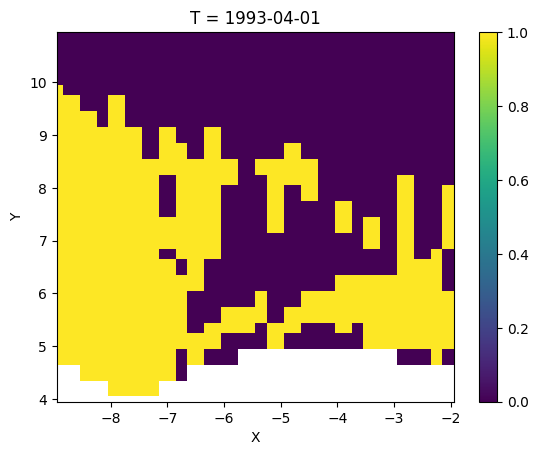

In [51]:
cluster.plot()

In [52]:
was_mme_gcm = WAS_Cross_Validator(n_splits=len(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))).get_index("T")), nb_omit=2)

In [53]:
if dist_method=="bestfit":
    hindcast_det_gcm, hindcast_prob_gcm, = was_mme_gcm.cross_validate(model, obs, all_model_hdcst, clim_year_start, 
                                                                  clim_year_end, best_params=best_params, cluster_da=cluster,
                                                                  best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
else:
    hindcast_det_gcm, hindcast_prob_gcm, = was_mme_gcm.cross_validate(model, obs, all_model_hdcst, clim_year_start,
                                                                  clim_year_end, best_params=best_params, cluster_da=cluster
                                                                     )    
hdcst_consolidated['SV-ML-CMME_ELM'] = hindcast_det_gcm
hdcst_consolidated_prob['SV-ML-CMME_ELM'] = hindcast_prob_gcm

Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:02<00:00, 11.15it/s]


#### Verification

In [54]:
score = ['Pearson', 'MAE']
model_name = "Extreme Learning Machine" #"Extreme Learning Machine" # Extreme Learning Machine "MultiLayer Perceptron" XGBoost Random Forest

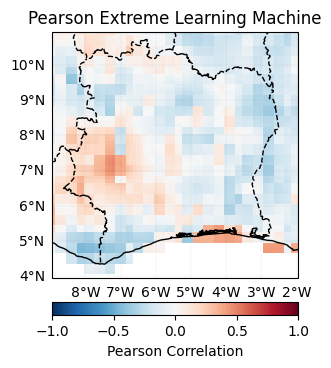

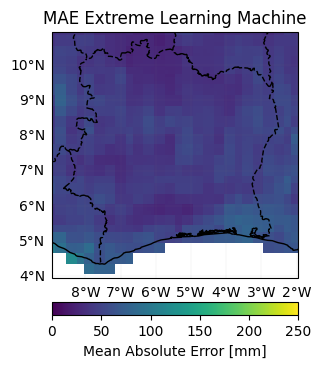

In [55]:
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall.sel(T=slice(str(year_start_model),str(year_end_model))),
        hindcast_det_gcm
    )
    scores_consolidated[i] = {'SV-ML-CMME_ELM': r}
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

##### Probabilistic

In [56]:
score = ['GROC', 'RPSS']

Generalized Discrimination Score


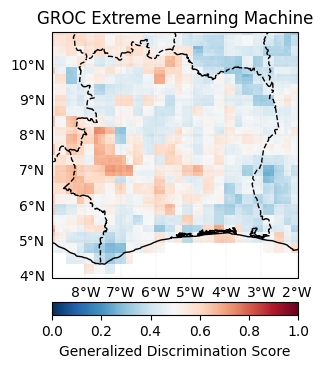

Ranked Probability Skill Score


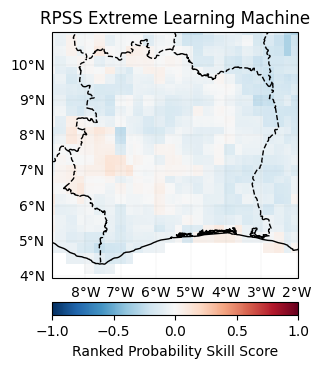

In [58]:
score = score.append('GROC') if 'GROC' not in score else score
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall.sel(T=slice(str(year_start_model),str(year_end_model))),
        hindcast_prob_gcm,
        clim_year_start,
        clim_year_end)
    scores_consolidated[i] = {'SV-ML-CMME_ELM': r}
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

#### Forecast 

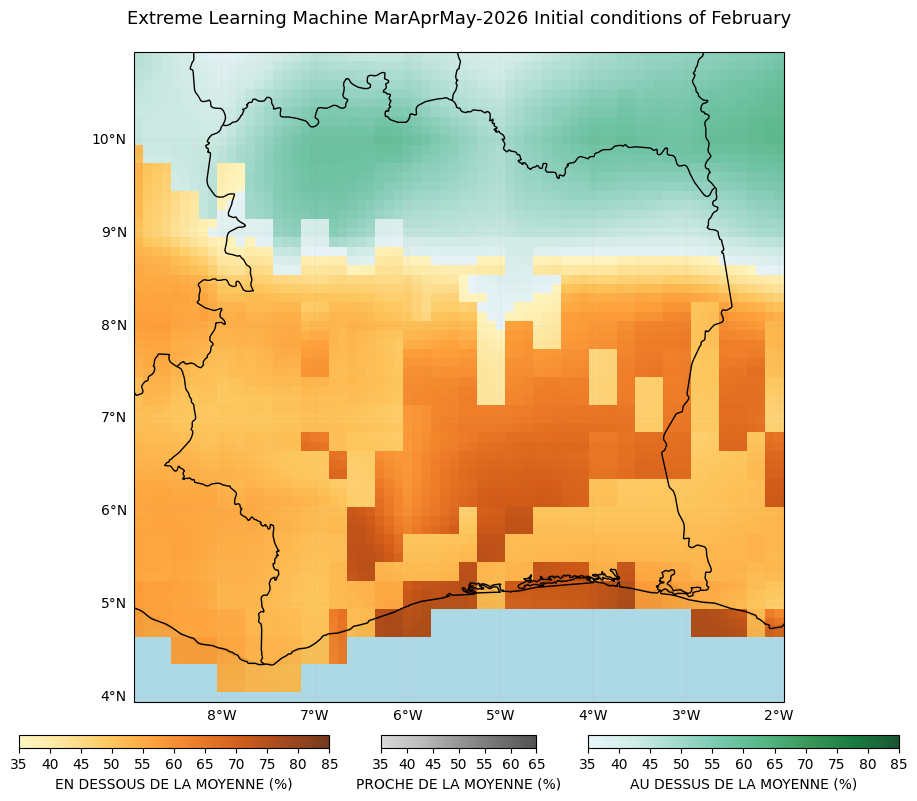

30789

In [59]:
if dist_method=="bestfit":
    forecast_det_gcm, forecast_prob_gcm= model.forecast(obs, clim_year_start, clim_year_end, all_model_hdcst, hindcast_det_gcm, all_model_fcst, best_params=best_params, cluster_da=cluster, 
                                                        best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
else:
    forecast_det_gcm, forecast_prob_gcm= model.forecast(obs, clim_year_start, clim_year_end, all_model_hdcst, hindcast_det_gcm, 
                                                        all_model_fcst, best_params=best_params, cluster_da=cluster
                                                       )
    
fcst_consolidated['SV-ML-CMME_ELM'] = forecast_det_gcm
fcst_consolidated_prob['SV-ML-CMME_ELM'] = forecast_prob_gcm
plot_prob_forecasts_(f"{dir_to_forecast}", forecast_prob_gcm.drop_vars('T').squeeze(), f"{model_name} {season_str}-{forecast} Initial conditions of {calendar.month_name[int(month_of_initialization)]}",
                    hspace=0.1, labels=fcst_labels, reverse_cmap=False)
gc.collect()

In [60]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### XGBoost

In [61]:
model = WAS_mme_XGBoosting(
    search_method='bayesian',#'random',  # Use randomized search for efficiency
    n_estimators_range=[25, 50, 100, 200, 300, 500, 600, 700, 1000, 1500],# 3000, 5000],  # Optimized for climate data
    learning_rate_range=[0.01, 0.05, 0.1],  # Finer low values
    max_depth_range=[2, 3, 4, 5],  # Conservative depths
    min_child_weight_range=[1, 2, 5, 10],
    subsample_range=[0.6, 0.8, 1.0],
    colsample_bytree_range=[0.5, 0.7, 0.9, 1.0],
    gamma_range=[0, 0.001, 0.01, 0.1, 0.5, 1.0],  # ADDED: Regularization
    reg_alpha_range=[0, 0.1, 0.5, 1.0],  # ADDED: L1 regularization
    reg_lambda_range=[1, 3, 5, 10],  # ADDED: L2 regularization
    random_state=42,
    dist_method=dist_method,  # Use non-parametric for probabilities
    n_iter_search=200,  # Increase iterations for better search
    cv_folds=5,
    n_clusters=2,  # Number of homogeneous zones
    optuna_n_jobs=-1,  # Use all cores if using bayesian optimization
    optuna_timeout=1200  # 20 minute timeout
)


#### Cross-validation

In [62]:
# all_model_hdcst, all_model_fcst, obs, best_score = process_datasets_for_mme(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), gcm=True, ELM_ELR=True, dir_to_save_model=dir_to_save_model, best_models=best_models, scores=scores, year_start=year_start_model, year_end=year_end_model, model=True, month_of_initialization=month_of_initialization, lead_time=lead_time, year_forecast=forecast)
all_model_hdcst, all_model_fcst, obs, best_score = process_datasets_for_mme(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), hdcsted=hindcast_files, fcsted=forecast_files, scores= scores, score_metric='MAE', gcm=True, agroparam=False, ELM_ELR=False, best_models=best_models, dir_to_save_model=dir_to_save_model, year_start=year_start_model, year_end=year_end_model, model=True, month_of_initialization=month_of_initialization, lead_time=lead_time, year_forecast=forecast)

In [63]:
best_params, cluster = model.compute_hyperparameters(all_model_hdcst, obs, clim_year_start, clim_year_end)

[I 2026-02-21 13:26:58,678] A new study created in memory with name: no-name-ab822e91-88ce-4654-abca-467413d7a249
[I 2026-02-21 13:27:42,326] Trial 2 finished with value: -0.9247600009122919 and parameters: {'n_estimators': 700, 'learning_rate': 0.05, 'max_depth': 4, 'min_child_weight': 10, 'subsample': 1.0, 'colsample_bytree': 0.9, 'gamma': 0.1, 'reg_alpha': 1.0, 'reg_lambda': 3}. Best is trial 2 with value: -0.9247600009122919.
[I 2026-02-21 13:27:46,345] Trial 1 finished with value: -0.9199909164203124 and parameters: {'n_estimators': 700, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.6, 'colsample_bytree': 0.7, 'gamma': 1.0, 'reg_alpha': 1.0, 'reg_lambda': 10}. Best is trial 1 with value: -0.9199909164203124.
[I 2026-02-21 13:27:47,082] Trial 0 finished with value: -0.9506765803027577 and parameters: {'n_estimators': 700, 'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.8, 'colsample_bytree': 0.9, 'gamma': 0.1, 'reg_alpha': 0

In [64]:
best_params #= {'activation': 'lin', 'neurons': 200, 'norm': 37.38460883888426}

{0.0: {'n_estimators': 100,
  'learning_rate': 0.01,
  'max_depth': 4,
  'min_child_weight': 1,
  'subsample': 1.0,
  'colsample_bytree': 1.0,
  'gamma': 0.001,
  'reg_alpha': 1.0,
  'reg_lambda': 1},
 1.0: {'n_estimators': 50,
  'learning_rate': 0.01,
  'max_depth': 4,
  'min_child_weight': 5,
  'subsample': 0.6,
  'colsample_bytree': 0.7,
  'gamma': 0.5,
  'reg_alpha': 1.0,
  'reg_lambda': 10}}

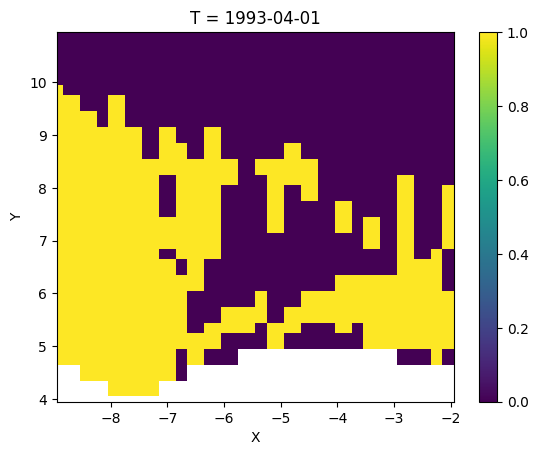

In [65]:
cluster.plot()

In [66]:
was_mme_gcm = WAS_Cross_Validator(n_splits=len(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))).get_index("T")), nb_omit=2)

In [67]:
if dist_method=="bestfit":
    hindcast_det_gcm, hindcast_prob_gcm, = was_mme_gcm.cross_validate(model, obs, all_model_hdcst, clim_year_start, 
                                                                  clim_year_end, best_params=best_params, cluster_da=cluster,
                                                                  best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
else:
    hindcast_det_gcm, hindcast_prob_gcm, = was_mme_gcm.cross_validate(model, obs, all_model_hdcst, clim_year_start,
                                                                  clim_year_end, best_params=best_params, cluster_da=cluster
                                                                     )    
hdcst_consolidated['SV-ML-CMME_XGBOOST'] = hindcast_det_gcm
hdcst_consolidated_prob['SV-ML-CMME_XGBOOST'] = hindcast_prob_gcm

Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:10<00:00,  2.24it/s]


#### Verification

In [68]:
score = ['Pearson', 'MAE']
model_name = "XGBoost" #"Extreme Learning Machine" # Extreme Learning Machine "MultiLayer Perceptron" XGBoost Random Forest

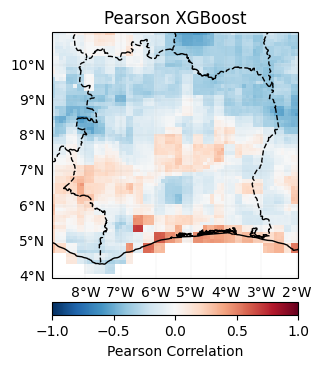

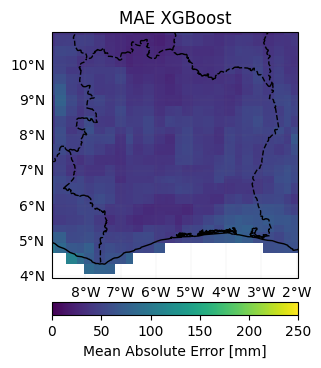

In [69]:
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall.sel(T=slice(str(year_start_model),str(year_end_model))),
        hindcast_det_gcm
    )
    scores_consolidated[i] = {'SV-ML-CMME_XGBOOST': r}
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

##### Probabilistic

In [70]:
score = ['GROC', 'RPSS']

Generalized Discrimination Score


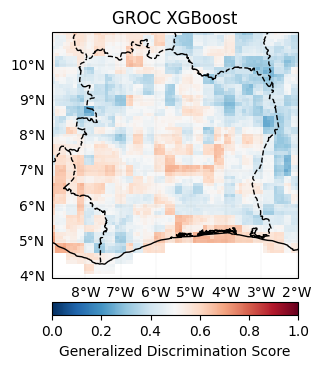

Ranked Probability Skill Score


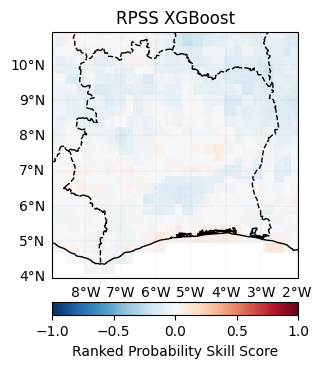

In [71]:
score = score.append('GROC') if 'GROC' not in score else score
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall.sel(T=slice(str(year_start_model),str(year_end_model))),
        hindcast_prob_gcm,
        clim_year_start,
        clim_year_end)
    scores_consolidated[i] = {'SV-ML-CMME_XGBOOST': r}
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

#### Forecast 

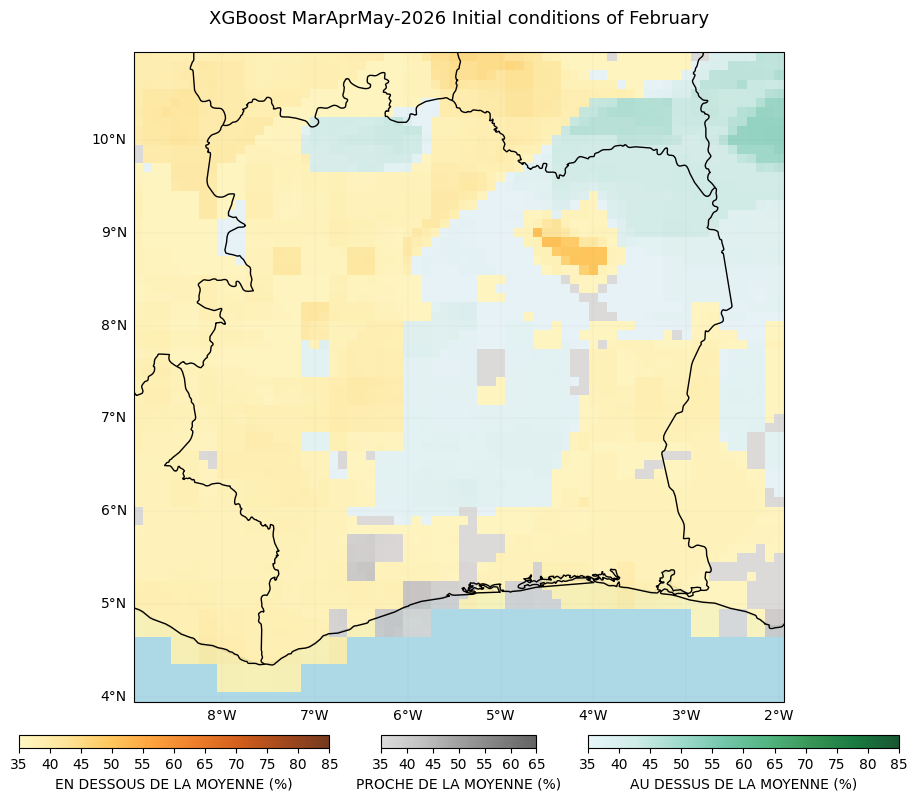

26403

In [72]:
if dist_method=="bestfit":
    forecast_det_gcm, forecast_prob_gcm= model.forecast(obs, clim_year_start, clim_year_end, all_model_hdcst, hindcast_det_gcm, all_model_fcst, best_params=best_params, cluster_da=cluster, 
                                                        best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
else:
    forecast_det_gcm, forecast_prob_gcm= model.forecast(obs, clim_year_start, clim_year_end, all_model_hdcst, hindcast_det_gcm, 
                                                        all_model_fcst, best_params=best_params, cluster_da=cluster
                                                       )
    
fcst_consolidated['SV-ML-CMME_XGBOOST'] = forecast_det_gcm
fcst_consolidated_prob['SV-ML-CMME_XGBOOST'] = forecast_prob_gcm
plot_prob_forecasts_(f"{dir_to_forecast}", forecast_prob_gcm.drop_vars('T').squeeze(), f"{model_name} {season_str}-{forecast} Initial conditions of {calendar.month_name[int(month_of_initialization)]}",
                    hspace=0.1, labels=fcst_labels, reverse_cmap=False)
gc.collect()

# 2nd - Approach: CCA-Based Calibration VWIND

In [73]:
# Filter model names to identify precipitation-related models
center_variable = [key for key in downloader.ModelsName().keys() if "VGRD_850" in key]
center_variable.remove('UKMO_604.VGRD_850')
center_variable.remove('UKMO_603.VGRD_850')

# Specify the directory to save downloaded model data
dir_to_save_model = f"{dir_s2s}/model_data"

# Define the month for model initialization (June)
month_of_initialization = "02"

# Define lead times corresponding to seasonal forecast targets (JAS season in this case)
lead_time = ["01", "02", "03"]  # July-August-September forecast period

# Define the hindcast period for model data (years 1993 to 2016)
year_start_model = 1993
year_end_model = 2016

# Set the bounding box for the area of interest (latitude and longitude bounds)
extent = [50, -60, -50, 30]   # [Northern, Western, Southern and Eastern] 

# Define if you want to download forecast or hindcast
forecast = None

# Define if you want all members of ensemble or doing an ensemble mean
ensemble_mean = "mean"

# Specify whether to overwrite existing files when downloading data
force_download = False

In [74]:
hindcast_files = downloader.WAS_Download_Models(
    dir_to_save_model,
    center_variable,
    month_of_initialization,
    lead_time,
    year_start_model,
    year_end_model,
    extent, 
    forecast,
    ensemble_mean,
    force_download)

2026-02-21 13:41:13,818 INFO Request ID is 5527e1da-7fc3-4dcb-8c9d-8eaf3cde46fb
2026-02-21 13:41:13,975 INFO status has been updated to accepted
2026-02-21 13:41:22,828 INFO status has been updated to running
2026-02-21 13:41:28,163 INFO status has been updated to successful


56e1b5b0492f7ad4a8acf110ab58eb40.nc:   0%|          | 0.00/46.3M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_bom2_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_bom2_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for bom 2 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/hindcast_bom2_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:41:39,685 INFO Request ID is 33e5fa3c-2d1f-4ba6-b8d6-49719d26164e
2026-02-21 13:41:39,823 INFO status has been updated to accepted
2026-02-21 13:41:48,560 INFO status has been updated to running
2026-02-21 13:41:53,770 INFO status has been updated to successful


38f1455695b960a6fc637bd592a3c90.nc:   0%|          | 0.00/42.3M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_ecmwf51_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_ecmwf51_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ecmwf 51 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/hindcast_ecmwf51_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:42:04,353 INFO Request ID is 15770067-6b0a-4efd-81ec-90d2eed0d2e8
2026-02-21 13:42:04,496 INFO status has been updated to accepted
2026-02-21 13:42:18,407 INFO status has been updated to successful


f44e285da7b2b98ca234e7312a4d901a.nc:   0%|          | 0.00/51.5M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance8_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance8_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for meteo_france 8 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance8_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:42:31,595 INFO Request ID is 931f1610-625c-4e62-a8d3-6e858093b081
2026-02-21 13:42:31,762 INFO status has been updated to accepted
2026-02-21 13:42:45,691 INFO status has been updated to successful


6f9c9ec5f1941ce32ad7c71440b75802.nc:   0%|          | 0.00/55.3M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance9_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance9_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for meteo_france 9 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance9_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:43:57,799 INFO Request ID is 8dedee88-5aab-4f3f-8179-92f622089c0f
2026-02-21 13:43:57,956 INFO status has been updated to accepted
2026-02-21 13:44:11,999 INFO status has been updated to successful


300dbfac90173190eda257b423ac60b2.nc:   0%|          | 0.00/63.1M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_dwd21_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_dwd21_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for dwd 21 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/hindcast_dwd21_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:44:27,682 INFO Request ID is 31303f40-71ae-4416-a0c7-313533d909a0
2026-02-21 13:44:27,812 INFO status has been updated to accepted
2026-02-21 13:44:41,941 INFO status has been updated to successful


b7dc35d5ac7c9e854d65246b4a4ba52d.nc:   0%|          | 0.00/60.8M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_dwd22_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_dwd22_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for dwd 22 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/hindcast_dwd22_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:45:02,908 INFO Request ID is 1d6dc9eb-be9e-402e-83ac-2b0d375fdde2
2026-02-21 13:45:03,067 INFO status has been updated to accepted
2026-02-21 13:45:12,177 INFO status has been updated to running
2026-02-21 13:45:17,391 INFO status has been updated to successful


56c29b53a898c38fd9c6d5c51187ccea.nc:   0%|          | 0.00/80.9M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_cmcc35_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_cmcc35_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for cmcc 35 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/hindcast_cmcc35_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:45:42,216 INFO Request ID is d08bb759-1c4c-4c7b-bd69-75c51224105a
2026-02-21 13:45:42,372 INFO status has been updated to accepted
2026-02-21 13:47:37,290 INFO status has been updated to successful


983b3973710f65a297e629eeaacbe631.nc:   0%|          | 0.00/41.3M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_ncep2_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_ncep2_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ncep 2 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/hindcast_ncep2_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:47:49,763 INFO Request ID is 63ffc66a-203c-4217-bc00-ed327448d7b7
2026-02-21 13:47:49,908 INFO status has been updated to accepted
2026-02-21 13:48:03,875 INFO status has been updated to successful


9435eeae113bc81010b209edc8755bd5.nc:   0%|          | 0.00/11.1M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_jma3_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_jma3_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for jma 3 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/hindcast_jma3_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:48:10,451 INFO Request ID is 74927284-42c9-4ac5-a875-ba749533aaa8
2026-02-21 13:48:10,619 INFO status has been updated to accepted
2026-02-21 13:48:19,409 INFO status has been updated to running
2026-02-21 13:48:24,611 INFO status has been updated to successful


8aec7522522b4f8043fcf54b96afe07b.nc:   0%|          | 0.00/38.1M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_eccc4_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_eccc4_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for eccc 4 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/hindcast_eccc4_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:48:35,063 INFO Request ID is e357ade0-3527-4bd4-812c-dea9eec34fb1
2026-02-21 13:48:35,208 INFO status has been updated to accepted
2026-02-21 13:48:49,106 INFO status has been updated to successful


1af0443a717181b792d5a0e499e7bbe7.nc:   0%|          | 0.00/38.5M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_eccc5_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_eccc5_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for eccc 5 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/hindcast_eccc5_VGRD_850_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download cfsv2_VGRD_850_hcst_Febic_3-5_1992-2021.txt
URL returned status code 404. Skipping download.
failed to download cfsv2_VGRD_850_hcst_Febic_3-5_1991-2020.txt
URL returned status code 404. Skipping download.
failed to download cmc1_VGRD_850_hcst_Febic_3-5_1992-2021.txt
URL returned status code 404. Skipping download.
failed to download cmc1_VGRD_850_hcst_Febic_3-5_1991-2020.txt
URL returned status code 404. Skipping download.
failed to download cmc2_VGRD_850_hcst_Febic_3-5_1992-2021.txt
URL returned status code 404. Skipping download.
failed to download cmc2_VGRD_850_hcst_Febic_3-5_1991-2020.txt
URL ret

In [75]:
forecast = 2026

In [76]:
forecast_files = downloader.WAS_Download_Models(
    dir_to_save_model,
    center_variable,
    month_of_initialization,
    lead_time,
    year_start_model,
    year_end_model,
    extent, 
    forecast,
    ensemble_mean,
    force_download)

2026-02-21 13:49:53,581 INFO Request ID is 85a46e7b-3e61-4a65-bdee-334a50c683bd
2026-02-21 13:49:53,750 INFO status has been updated to accepted
2026-02-21 13:50:07,683 INFO status has been updated to successful


55a8958283af1137ed1c24b4a63265c8.nc:   0%|          | 0.00/7.97M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_bom2_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_bom2_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for bom 2 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/forecast_bom2_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:50:16,305 INFO Request ID is b5a4844f-e457-452a-bc96-95a1a5ddf67b
2026-02-21 13:50:16,471 INFO status has been updated to accepted
2026-02-21 13:50:25,628 INFO status has been updated to successful


c65ec095b0cecc8b395f9d10b533636e.nc:   0%|          | 0.00/3.35M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_ecmwf51_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_ecmwf51_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ecmwf 51 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/forecast_ecmwf51_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:50:30,537 INFO Request ID is a0f08d98-866b-470b-8155-a6524a819b85
2026-02-21 13:50:30,671 INFO status has been updated to accepted
2026-02-21 13:50:44,609 INFO status has been updated to failed


Failed to download data for VGRD_850: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/a0f08d98-866b-470b-8155-a6524a819b85/results
The job has failed
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': ['50', '-60', '-50', '30'], 'fcmonth': ['01', '02', '03'], 'origin': ['lfpw'], 'levelist': ['850'], 'type': ['fcmean'], 'system': ['8'], 'param': ['132'], 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['pl'], 'database': 'ecmwf', 'date': ['2026-02-01']}]

The job failed with: MarsNoDataError


2026-02-21 13:50:46,671 INFO Request ID is b01783da-3ac3-492e-bee1-5f8a2338dc6f
2026-02-21 13:50:46,816 INFO status has been updated to accepted
2026-02-21 13:51:00,890 INFO status has been updated to successful


cff3ee09ae8f745f4b6a30971889195f.nc:   0%|          | 0.00/3.37M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_meteofrance9_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_meteofrance9_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for meteo_france 9 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/forecast_meteofrance9_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:51:06,050 INFO Request ID is 5a1364fd-a029-4d63-b121-84c396d98642
2026-02-21 13:51:06,209 INFO status has been updated to accepted
2026-02-21 13:51:15,565 INFO status has been updated to failed


Failed to download data for VGRD_850: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/5a1364fd-a029-4d63-b121-84c396d98642/results
The job has failed
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': ['50', '-60', '-50', '30'], 'fcmonth': ['01', '02', '03'], 'origin': ['edzw'], 'levelist': ['850'], 'type': ['fcmean'], 'system': ['21'], 'param': ['132'], 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['pl'], 'database': 'ecmwf', 'date': ['2026-02-01']}]

The job failed with: MarsNoDataError


2026-02-21 13:51:17,314 INFO Request ID is a65b5edd-84de-419b-9915-416f1c601f00
2026-02-21 13:51:17,477 INFO status has been updated to accepted
2026-02-21 13:51:26,174 INFO status has been updated to running
2026-02-21 13:51:31,631 INFO status has been updated to successful


e6d31531e55a9221af20883529b3427a.nc:   0%|          | 0.00/3.93M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_dwd22_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_dwd22_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for dwd 22 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/forecast_dwd22_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:51:37,511 INFO Request ID is 9664bc02-5357-4500-9718-4a4c95a26bd0
2026-02-21 13:51:37,648 INFO status has been updated to accepted
2026-02-21 13:51:51,587 INFO status has been updated to failed


Failed to download data for VGRD_850: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/9664bc02-5357-4500-9718-4a4c95a26bd0/results
The job has failed
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': ['50', '-60', '-50', '30'], 'fcmonth': ['01', '02', '03'], 'origin': ['cmcc'], 'levelist': ['850'], 'type': ['fcmean'], 'system': ['35'], 'param': ['132'], 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['pl'], 'database': 'ecmwf', 'date': ['2026-02-01']}]

The job failed with: MarsNoDataError


2026-02-21 13:51:54,079 INFO Request ID is 3f5cf77c-97bd-46e0-9831-ddb9654c72bf
2026-02-21 13:51:54,215 INFO status has been updated to accepted
2026-02-21 13:52:08,151 INFO status has been updated to successful


f3e3ae7f21452ff45e516a85fd4e7080.nc:   0%|          | 0.00/8.06M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_ncep2_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_ncep2_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ncep 2 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/forecast_ncep2_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:52:13,966 INFO Request ID is 6a044894-5dd0-45e0-9e6b-314fe64035f4
2026-02-21 13:52:14,088 INFO status has been updated to accepted
2026-02-21 13:52:28,069 INFO status has been updated to failed


Failed to download data for VGRD_850: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/6a044894-5dd0-45e0-9e6b-314fe64035f4/results
The job has failed
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': ['50', '-60', '-50', '30'], 'fcmonth': ['01', '02', '03'], 'origin': ['rjtd'], 'levelist': ['850'], 'type': ['fcmean'], 'system': ['3'], 'param': ['132'], 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['pl'], 'database': 'ecmwf', 'date': ['2026-02-01']}]

The job failed with: MarsNoDataError


2026-02-21 13:52:29,873 INFO Request ID is 967df9ad-bae3-4f65-b89e-559141f356d0
2026-02-21 13:52:30,029 INFO status has been updated to accepted
2026-02-21 13:52:44,008 INFO status has been updated to successful


1210f80a98ddb453d97e8e9a05cf7955.nc:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_eccc4_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_eccc4_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for eccc 4 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/forecast_eccc4_VGRD_850_FebIc_MarAprMay_01.nc


2026-02-21 13:52:48,816 INFO Request ID is 30ce32e7-9323-46c4-8a2d-3083b2b283a3
2026-02-21 13:52:48,941 INFO status has been updated to accepted
2026-02-21 13:53:04,285 INFO status has been updated to successful


5eaa5c5ff7469b20d8fb46491606f313.nc:   0%|          | 0.00/1.60M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_eccc5_VGRD_850_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_eccc5_VGRD_850_FebIc_MarAprMay_01.nc
Download finished, combined dataset for eccc 5 VGRD_850 to PRCP_MAM_2026_ic_1\model_data/forecast_eccc5_VGRD_850_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download cfsv2_VGRD_850_fcst_Febic_3-5_2026-2026.txt
URL returned status code 404. Skipping download.
failed to download cmc1_VGRD_850_fcst_Febic_3-5_2026-2026.txt
URL returned status code 404. Skipping download.
failed to download cmc2_VGRD_850_fcst_Febic_3-5_2026-2026.txt
URL returned status code 404. Skipping download.
failed to download gfdl_VGRD_850_fcst_Febic_3-5_2026-2026.txt
URL returned status code 404. Skipping download.
failed to download nasa_VGRD_850_fcst_Febic_3-5_2026-2026.txt
URL returned status code 404. Skipping download.
failed to download ncar_ccsm4_VGRD_850_fcst_Febic_3-5_2026-2026.txt
UR

In [77]:
hindcast_files = {k: hindcast_files[k] for k in hindcast_files.keys() & forecast_files.keys()}
forecast_files = {k: forecast_files[k] for k in hindcast_files.keys() & forecast_files.keys()}
common_keys = {k.lower() for k in hindcast_files} & {k.lower() for k in forecast_files}
center_variable = [
    item
    for item in center_variable
    if any(item.lower().startswith(k) for k in list(common_keys))
                ]

In [78]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Initialize the WAS_CCA class (default)

In [79]:
n_modes = 3
# define zone as dict : {'zone_name_key': ('Explicit_Zone_name', lon_min, lon_max, lat_min, lat_max)} 
defined_zone = {'A': ('A', -60, 30, -50, 50)} 

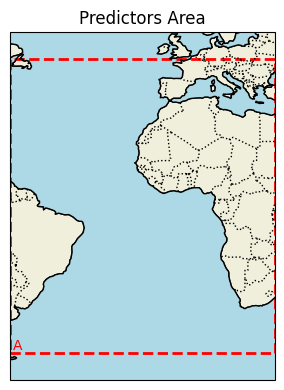

In [80]:
plot_map([extent[1],extent[3],extent[2],extent[0]], sst_indices = defined_zone, title="Predictors Area",fig_size=(6,4))

##### Modes of CCA for each model

In [81]:
was_cca = WAS_CCA(n_modes=n_modes, n_pca_modes=8, dist_method=dist_method)
was_cv = WAS_Cross_Validator(n_splits=len(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))).get_index("T")), nb_omit=2)

CCA Modes for model BOM_2.VGRD_850


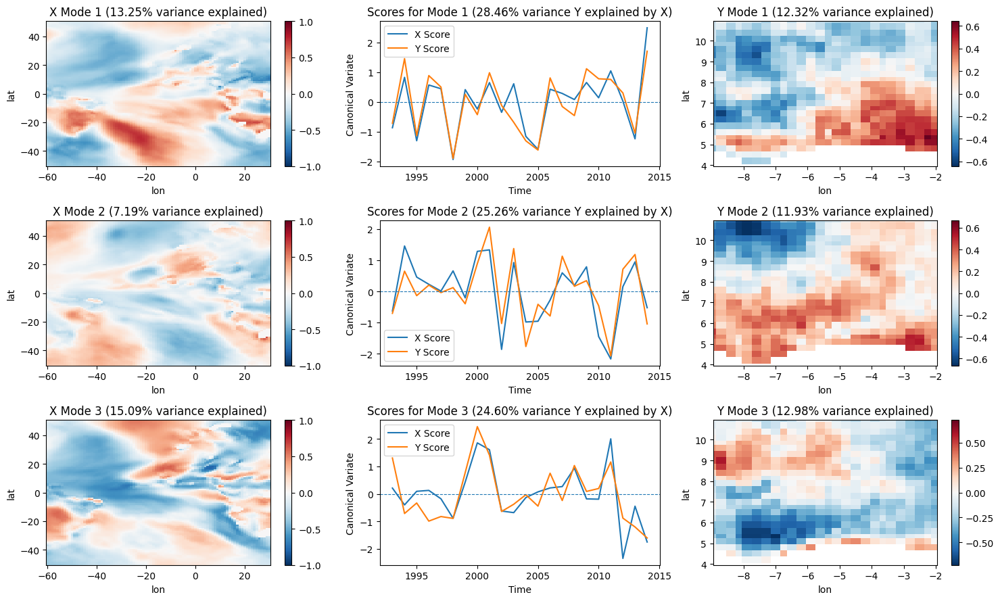

CCA Modes for model ECMWF_51.VGRD_850


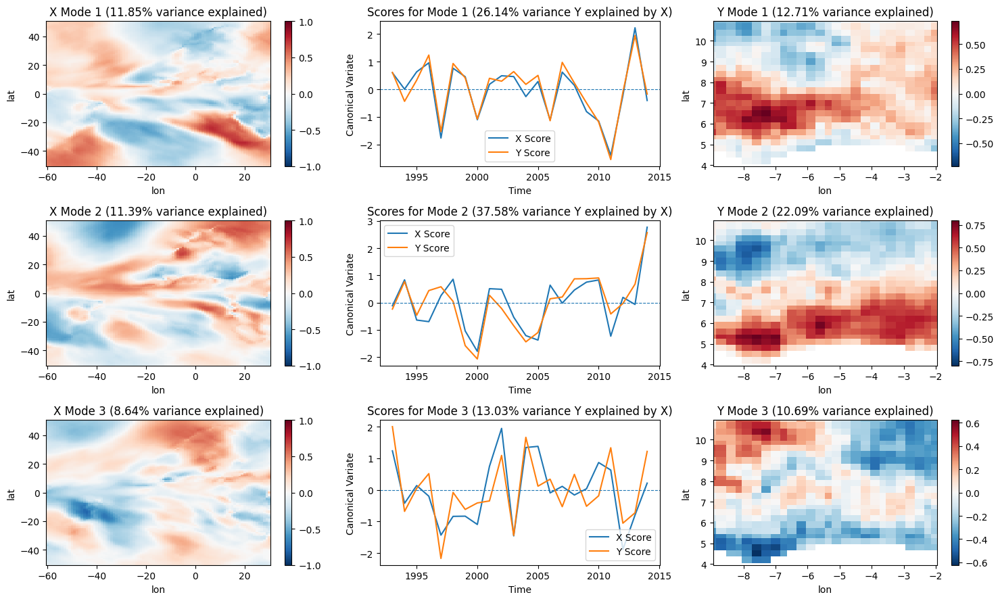

CCA Modes for model DWD_22.VGRD_850


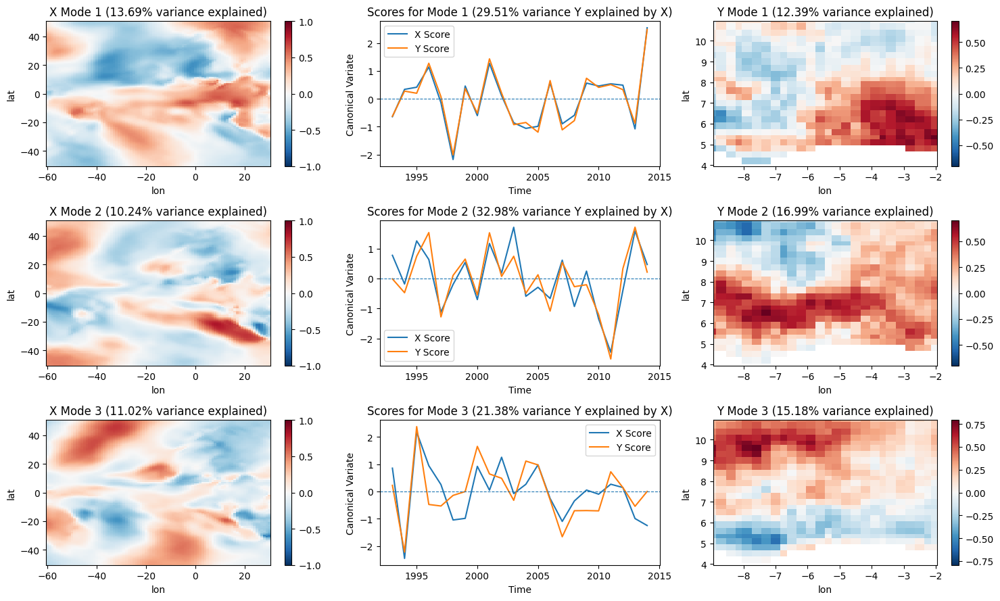

CCA Modes for model NCEP_2.VGRD_850


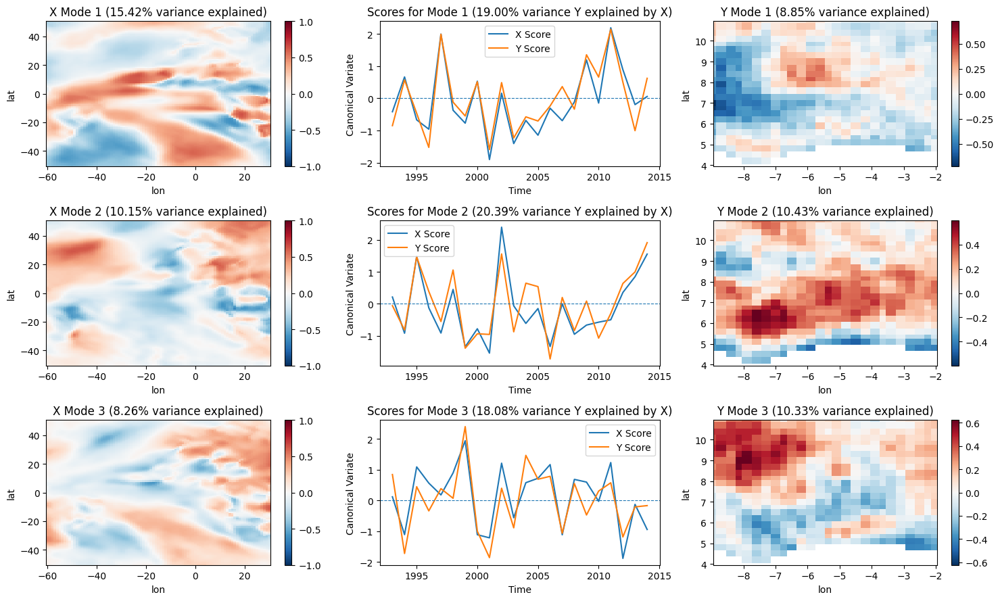

CCA Modes for model ECCC_4.VGRD_850


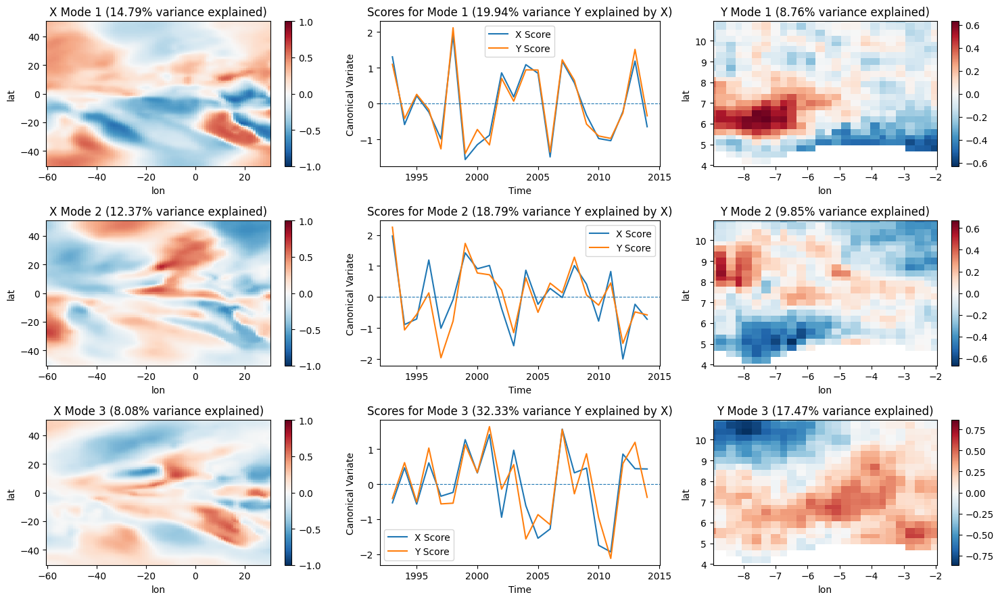

CCA Modes for model ECCC_5.VGRD_850


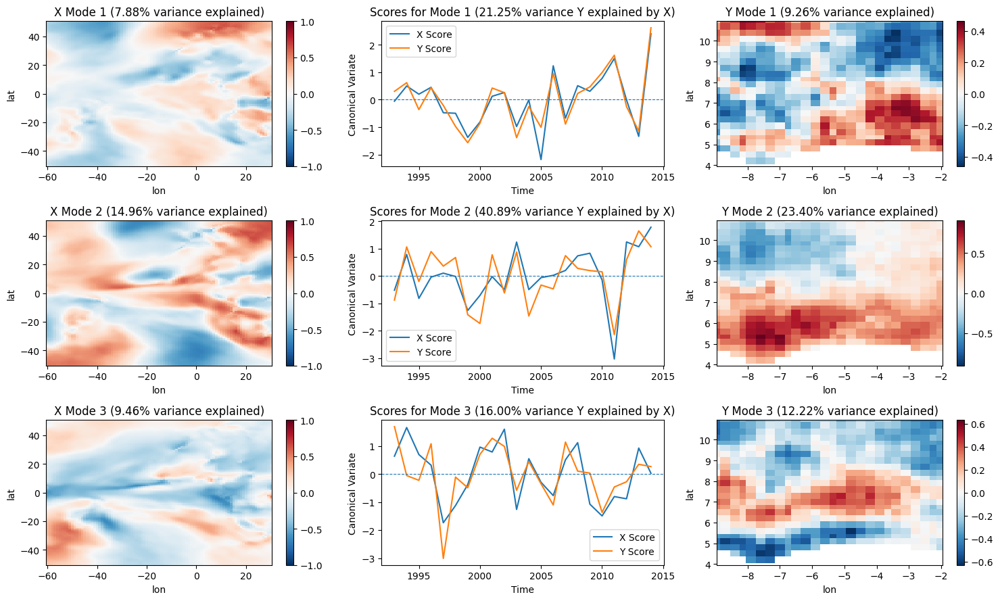

In [82]:
predictors = {}
for i in center_variable:
    predictors[i] = retrieve_single_zone_for_PCR(dir_to_save_model, defined_zone, i, year_start_model, year_end_model, clim_year_start=clim_year_start, clim_year_end=clim_year_end, model=True, month_of_initialization=month_of_initialization, lead_time=lead_time, standardize=True)
    predictor = predictors[i].isel(T = slice(None,-1))
    predictor['T'] = rainfall.sel(T=slice(str(year_start_model),str(year_end_model)))['T']
    print(f"CCA Modes for model {i}")
    was_cca.plot_cca_results(X=predictor, Y=rainfall.sel(T=slice(str(year_start_model),str(year_end_model))) , clim_year_start=clim_year_start, clim_year_end=clim_year_end)

#### Cross validation

In [83]:
hindcast_det_dynam_all = {}
hindcast_prob_dynam_all = {}
for key, predictor in predictors.items():
    predictor = predictor.isel(T = slice(None,-1))
    predictor['T'] = rainfall.sel(T=slice(str(year_start_model),str(year_end_model)))['T']
    print(key.split('.')[0])
    if dist_method=="bestfit":
        hindcast_det_dynam_all[key], hindcast_prob_dynam_all[key] = was_cv.cross_validate(was_cca, rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), 
                                                                                          predictor, clim_year_start, clim_year_end, best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
    else:
        hindcast_det_dynam_all[key], hindcast_prob_dynam_all[key] = was_cv.cross_validate(was_cca, rainfall.sel(T=slice(str(year_start_model),str(year_end_model))).sel(T=slice(str(year_start_model),str(year_end_model))), predictor, clim_year_start, clim_year_end) 

BOM_2
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:05<00:00,  4.29it/s]


ECMWF_51
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:05<00:00,  4.06it/s]


DWD_22
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:06<00:00,  3.80it/s]


NCEP_2
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:06<00:00,  3.79it/s]


ECCC_4
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:06<00:00,  3.75it/s]


ECCC_5
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:06<00:00,  3.69it/s]


#### Verification (individual)

###### Deterministic

In [84]:
score = ['Pearson','MAE']
model_name = "CCA-based"

Pearson Correlation


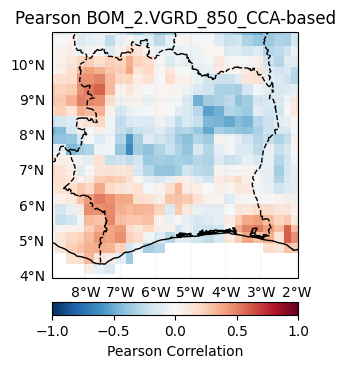

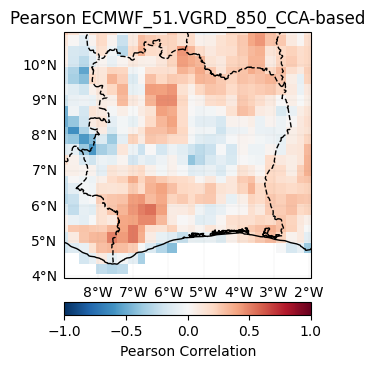

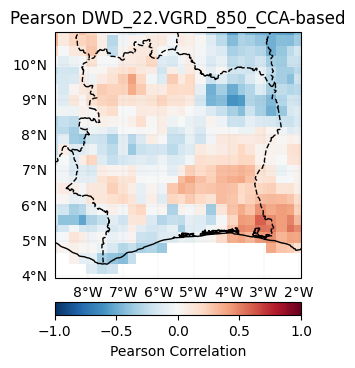

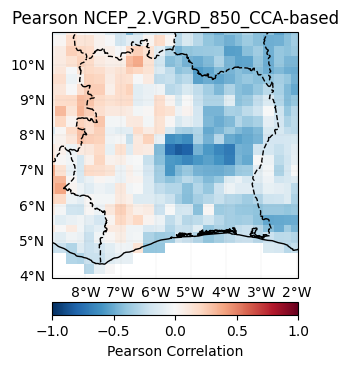

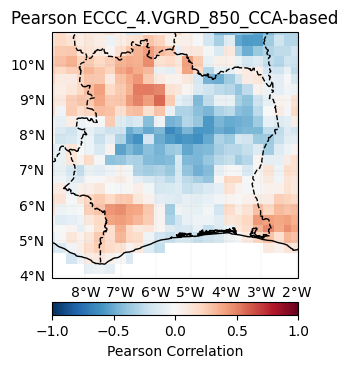

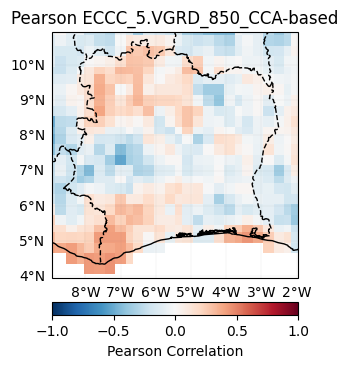

Mean Absolute Error


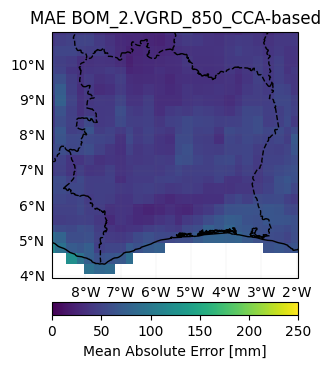

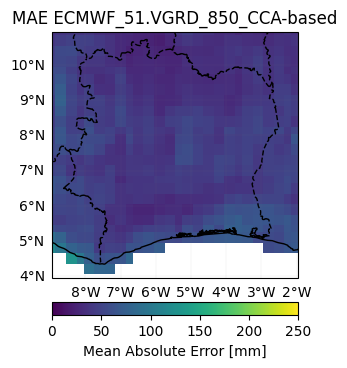

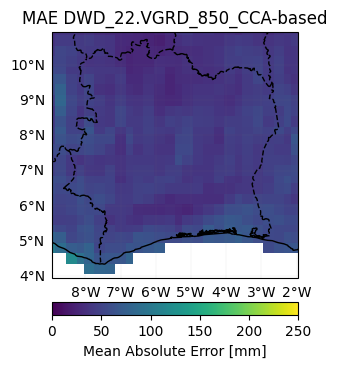

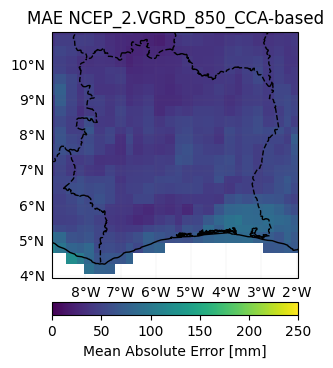

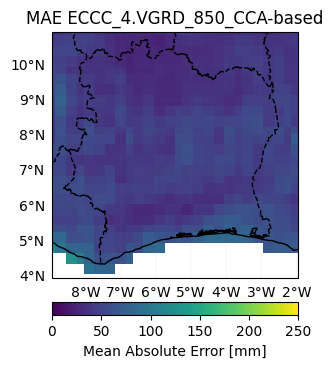

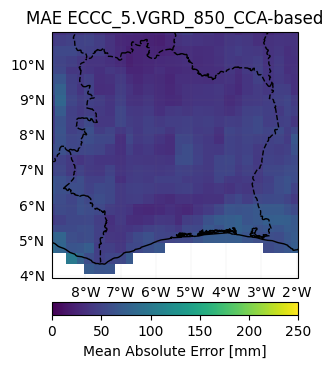

In [85]:
cca_scores = {}
for i in score:
    tmp = {}
    print(was_verify.scores[i][0])
    for key, hdcst in hindcast_det_dynam_all.items():
        tmp[f'{key}_snd.approach'] = was_verify.compute_deterministic_score(
            was_verify.get_scores_metadata()[i][5],
            rainfall.sel(T=slice(str(year_start_model),str(year_end_model))),
            hindcast_det_dynam_all[key]
        )
        was_verify.plot_model_score(tmp[f'{key}_snd.approach'], i, dir_save_score, f"{key}_{model_name}")
    cca_scores[i] = tmp

###### Probabilistic

In [86]:
score = ['GROC', 'RPSS']

Generalized Discrimination Score


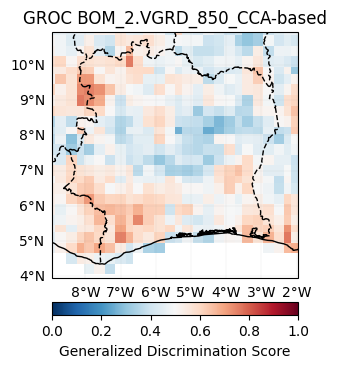

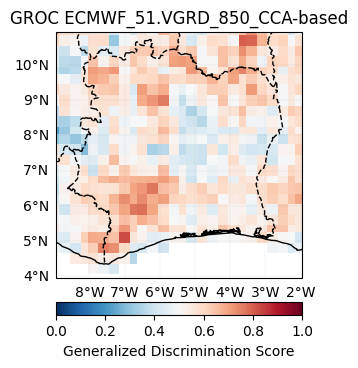

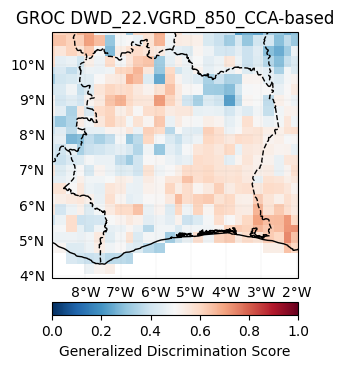

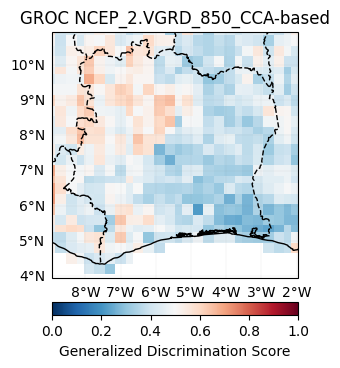

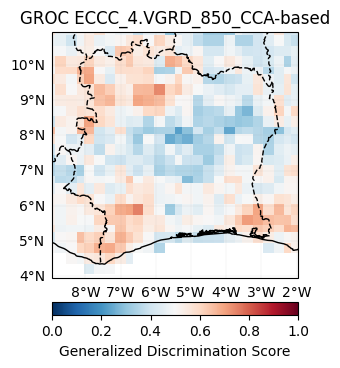

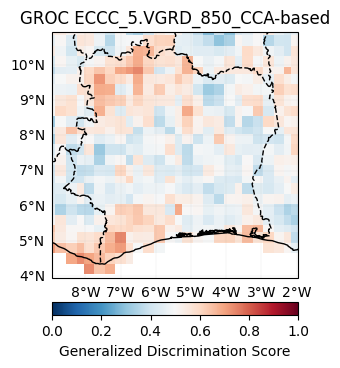

Ranked Probability Skill Score


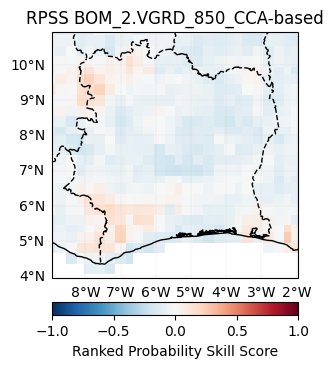

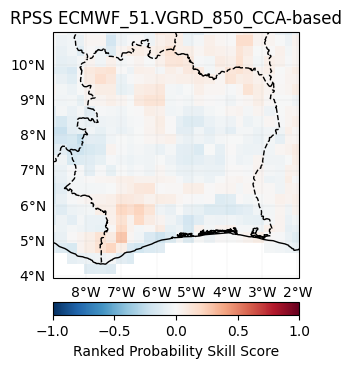

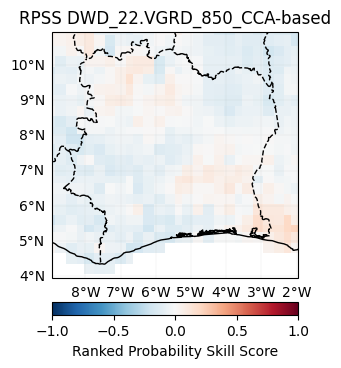

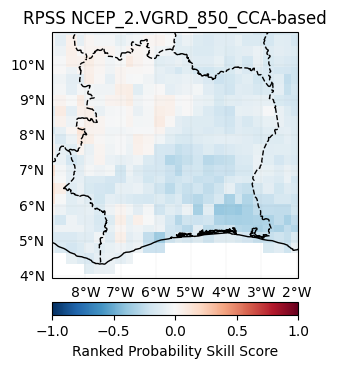

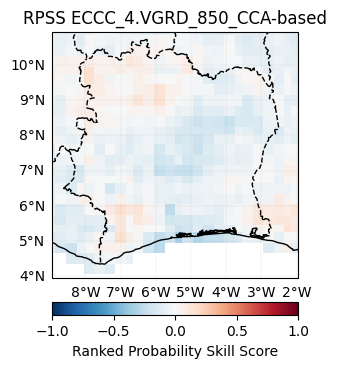

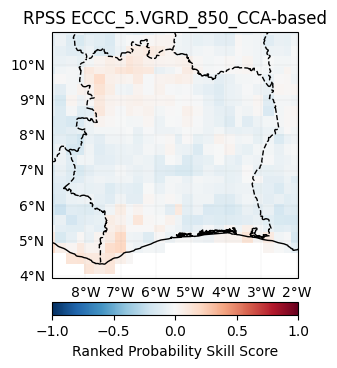

In [87]:
score = score.append('GROC') if 'GROC' not in score else score
for i in score:
    tmp = {}
    print(was_verify.scores[i][0])
    for key, hdcst in hindcast_det_dynam_all.items():
        tmp[f'{key}_snd.approach'] = was_verify.compute_probabilistic_score(
            was_verify.get_scores_metadata()[i][5],
            rainfall.sel(T=slice(str(year_start_model),str(year_end_model))),
            hindcast_prob_dynam_all[key],
            clim_year_start,
            clim_year_end)
        was_verify.plot_model_score(tmp[f'{key}_snd.approach'], i, dir_save_score, f"{key}_{model_name}")
    cca_scores[i] = tmp

#### Forecast (individual)

In [88]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


BOM_2


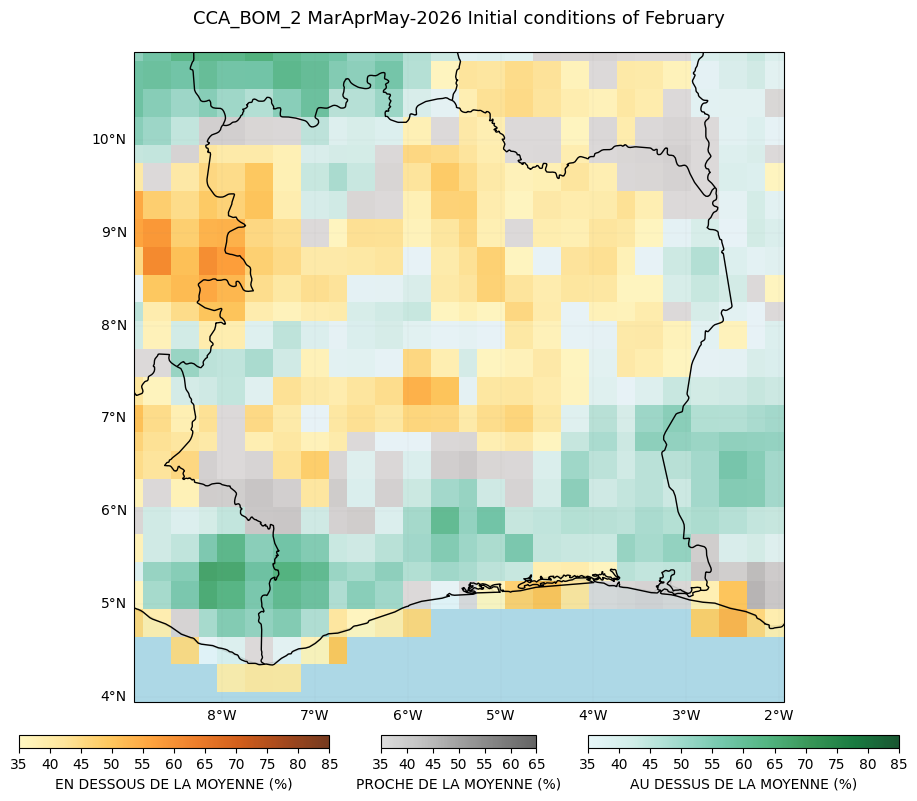

ECMWF_51


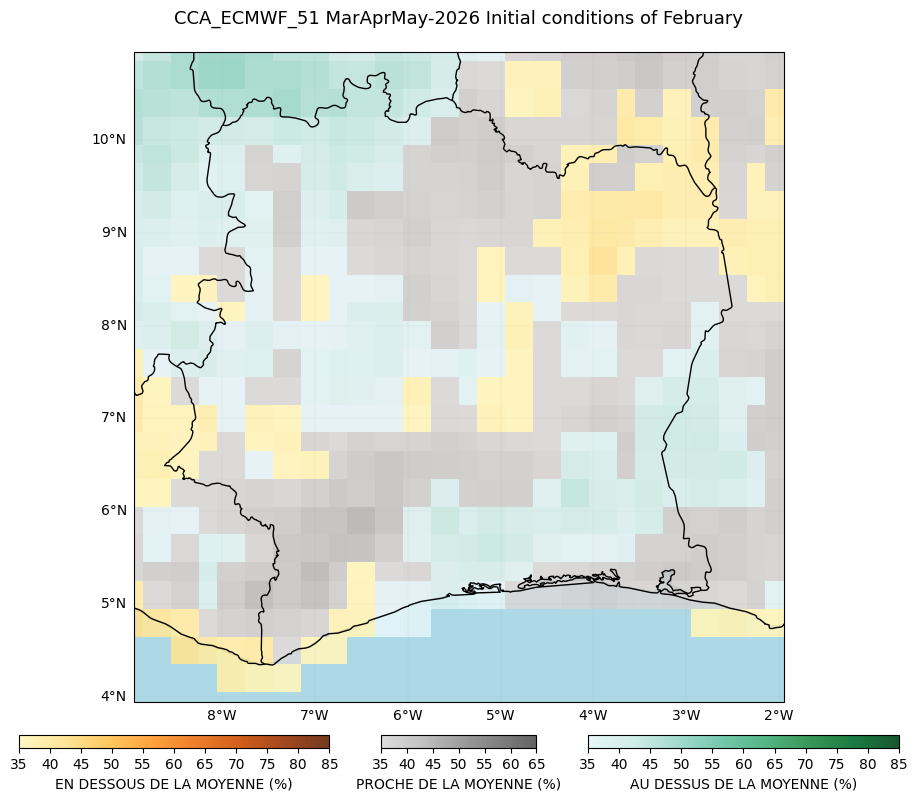

DWD_22


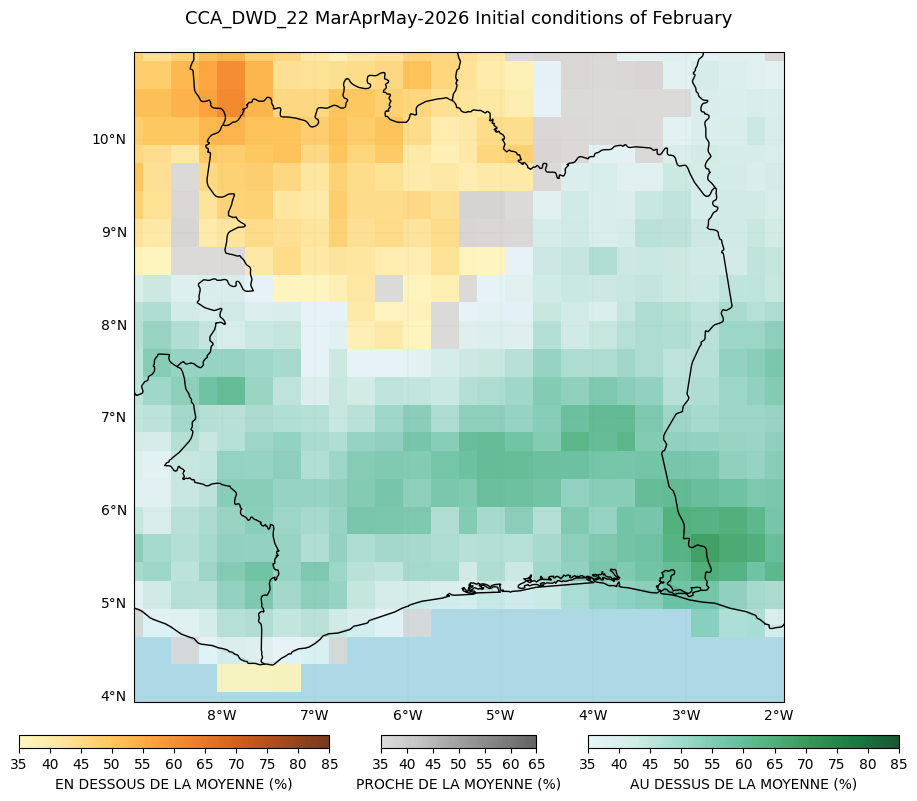

NCEP_2


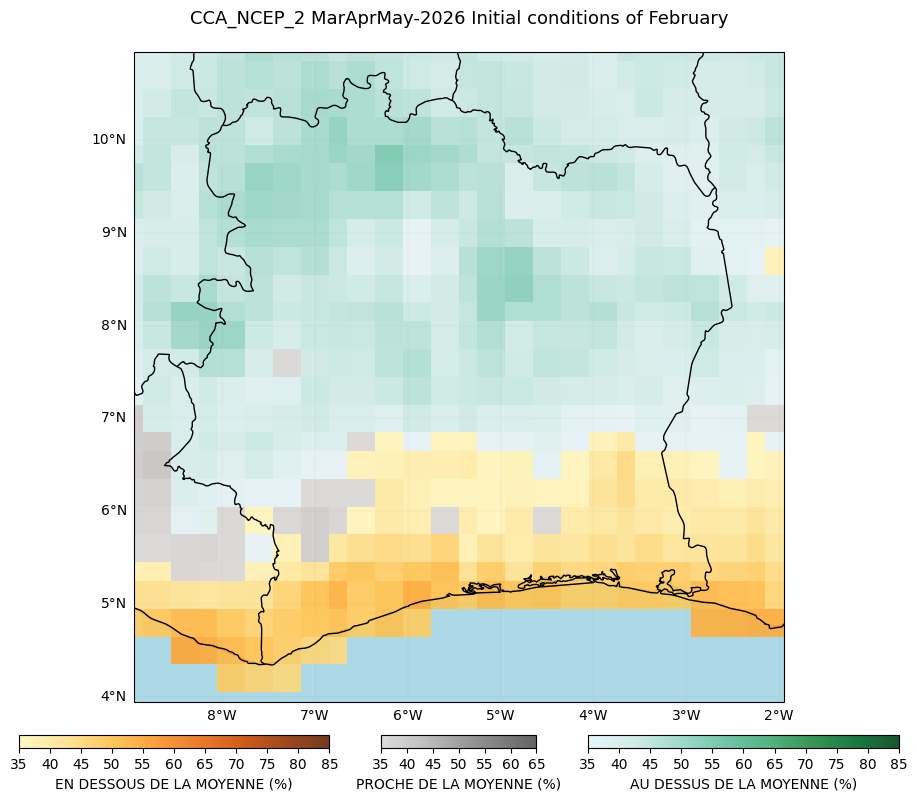

ECCC_4


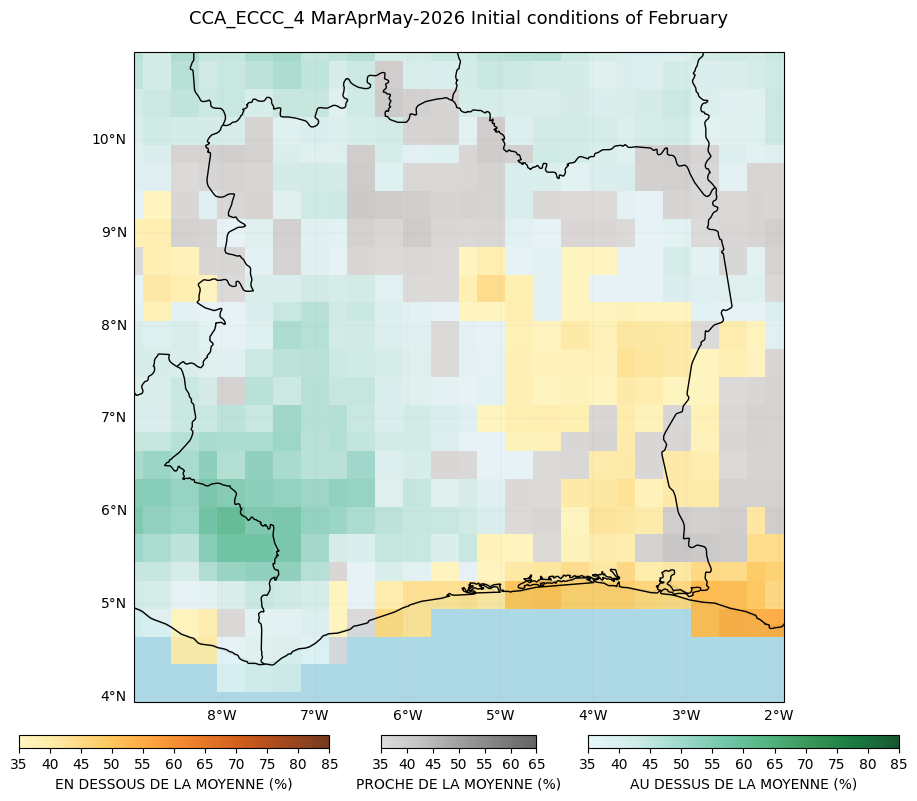

ECCC_5


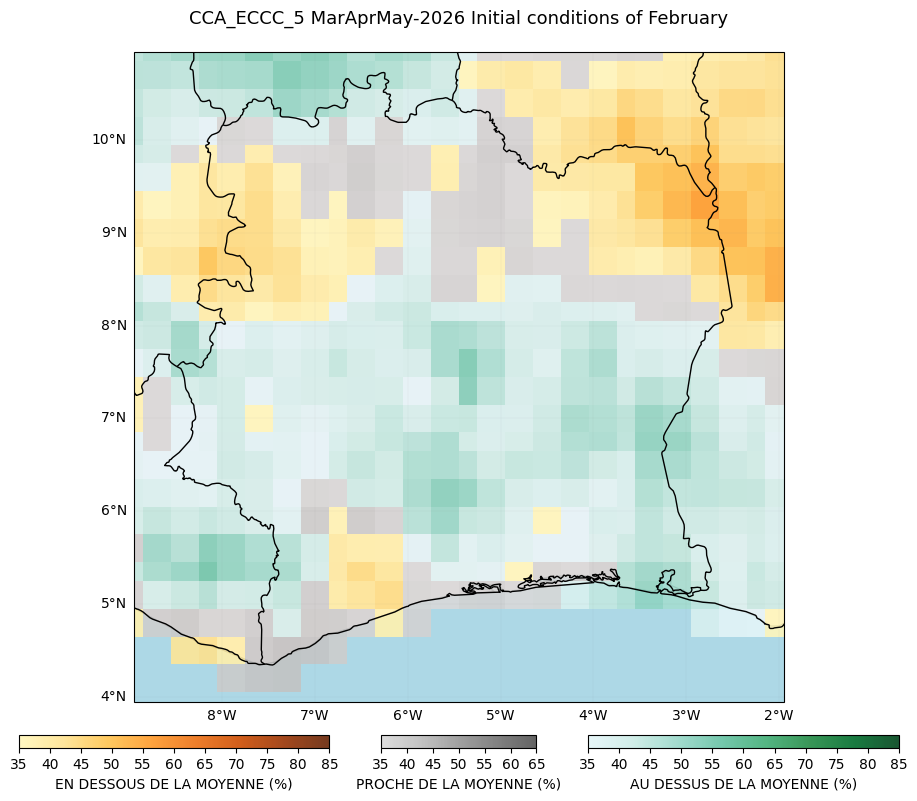

In [89]:
forecast_det_dynam_all = {}
forecast_prob_dynam_all = {}
for key, predictor in predictors.items():
    predictor_f = predictor.isel(T=[-1])
    predictor = predictor.isel(T = slice(None,-1))
    predictor['T'] = rainfall.sel(T=slice(str(year_start_model),str(year_end_model)))['T']
    print(key.split('.')[0])
    if dist_method=="bestfit":
        forecast_det_dynam_all[key], forecast_prob_dynam_all[key] = was_cca.forecast(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), clim_year_start, clim_year_end, predictor, hindcast_det_dynam_all[key], predictor_f, best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
    else:
        forecast_det_dynam_all[key], forecast_prob_dynam_all[key] = was_cca.forecast(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), clim_year_start, clim_year_end, predictor, hindcast_det_dynam_all[key], predictor_f)
    model_name = f"CCA_{key.split('.')[0]}"    
    plot_prob_forecasts_(f"{dir_to_forecast}",
                        forecast_prob_dynam_all[key].drop_vars('T').squeeze(), f"{model_name} {season_str}-{forecast} Initial conditions of {calendar.month_name[int(month_of_initialization)]}", 
                        hspace=0.1, labels=fcst_labels, reverse_cmap=False)

### Select best Statistico-Dynamical models

In [90]:
#### Select some models
best_models = get_best_models(center_variable, cca_scores, metric='GROC', threshold=0.55, top_n=3, gcm=False)
best_models

['ECMWF_51.VGRD_850', 'ECCC_5.VGRD_850', 'BOM_2.VGRD_850']

In [91]:
for key in best_models:
    hdcst_consolidated[f'{key}_snd.approach'] = hindcast_det_dynam_all[key]
    fcst_consolidated[f'{key}_snd.approach'] = forecast_det_dynam_all[key]
    hdcst_consolidated_prob[f'{key}_snd.approach'] = hindcast_prob_dynam_all[key]
    fcst_consolidated_prob[f'{key}_snd.approach'] = forecast_prob_dynam_all[key]
    
for metric, models in cca_scores.items():
    for model in list(models):                    # list() pour éviter RuntimeError
        if not any(model.startswith(p) for p in best_models):
            del models[model]

for key in cca_scores:
    scores_consolidated.setdefault(key, {}).update(cca_scores[key])

# 2nd - Approach: CCA-Based Calibration SST

In [93]:
# Filter model names to identify precipitation-related models
center_variable = [key for key in downloader.ModelsName().keys() if "SST" in key]
# center_variable.remove('NASA_1.SST')
center_variable.remove('UKMO_603.SST')
center_variable.remove('UKMO_604.SST')
# center_variable.remove('DWD_21.SST')
# center_variable.remove('CMC2_1.SST')
# center_variable.remove('METEOFRANCE_8.SST')

# Specify the directory to save downloaded model data
dir_to_save_model = f"{dir_s2s}/model_data"

# Define the month for model initialization (June)
month_of_initialization = "02"

# Define lead times corresponding to seasonal forecast targets (JAS season in this case)
lead_time = ["01", "02", "03"]  # July-August-September forecast period

# Define the hindcast period for model data (years 1993 to 2016)
year_start_model = 1993
year_end_model = 2016

# Set the bounding box for the area of interest (latitude and longitude bounds)
extent = [60, -180, -60, 180]  # [Northern, Western, Southern and Eastern] 

# Define if you want to download forecast or hindcast
forecast = None

# Define if you want all members of ensemble or doing an ensemble mean
ensemble_mean = "mean"

# Specify whether to overwrite existing files when downloading data
force_download = False

In [94]:
hindcast_files = downloader.WAS_Download_Models(
    dir_to_save_model,
    center_variable,
    month_of_initialization,
    lead_time,
    year_start_model,
    year_end_model,
    extent, 
    forecast,
    ensemble_mean,
    force_download)

2026-02-21 13:59:25,148 INFO Request ID is 4e017a9e-1173-45c9-bf18-1c26ca0c378a
2026-02-21 13:59:25,310 INFO status has been updated to accepted
2026-02-21 13:59:34,170 INFO status has been updated to running
2026-02-21 13:59:39,412 INFO status has been updated to successful


7983aa74b42a2442fdb2bf3491cc4518.nc:   0%|          | 0.00/122M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_bom2_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_bom2_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for bom 2 SST to PRCP_MAM_2026_ic_1\model_data/hindcast_bom2_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:00:29,321 INFO Request ID is ddcf26ea-b9c2-4c3c-a693-5e753885781b
2026-02-21 14:00:29,467 INFO status has been updated to accepted
2026-02-21 14:00:43,476 INFO status has been updated to successful


49eb3deab7678a559251e22a9ba834f7.nc:   0%|          | 0.00/114M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_ecmwf51_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_ecmwf51_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ecmwf 51 SST to PRCP_MAM_2026_ic_1\model_data/hindcast_ecmwf51_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:01:06,924 INFO Request ID is cea6745e-27ba-41c9-a736-f73bf71f7348
2026-02-21 14:01:07,173 INFO status has been updated to accepted
2026-02-21 14:01:21,544 INFO status has been updated to successful


a1c41b6a2212ab02de2abf1dc6b48da5.nc:   0%|          | 0.00/112M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance8_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance8_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for meteo_france 8 SST to PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance8_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:01:43,526 INFO Request ID is 7884087b-ec12-4b8b-8d82-310c3ca655ac
2026-02-21 14:01:43,760 INFO status has been updated to accepted
2026-02-21 14:01:52,656 INFO status has been updated to running
2026-02-21 14:01:57,873 INFO status has been updated to successful


fb10c44f78c039fb7c191a2209e7903c.nc:   0%|          | 0.00/140M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance9_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance9_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for meteo_france 9 SST to PRCP_MAM_2026_ic_1\model_data/hindcast_meteofrance9_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:02:38,678 INFO Request ID is 1b572800-73a8-4af4-bbf3-646d671beb78
2026-02-21 14:02:38,847 INFO status has been updated to accepted
2026-02-21 14:02:47,819 INFO status has been updated to running
2026-02-21 14:02:53,031 INFO status has been updated to successful


b1870399a151ff6a9223a8ed9eed0516.nc:   0%|          | 0.00/131M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_dwd21_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_dwd21_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for dwd 21 SST to PRCP_MAM_2026_ic_1\model_data/hindcast_dwd21_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:03:34,998 INFO Request ID is 69aad234-5a1f-402e-a1bc-f9306633212f
2026-02-21 14:03:35,138 INFO status has been updated to accepted
2026-02-21 14:03:49,113 INFO status has been updated to successful


88db8a5cdabacf5196dae89c8e36e34d.nc:   0%|          | 0.00/131M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_dwd22_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_dwd22_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for dwd 22 SST to PRCP_MAM_2026_ic_1\model_data/hindcast_dwd22_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:04:32,765 INFO Request ID is 4b537fba-d2c4-4fe0-8d27-7dafebac325e
2026-02-21 14:04:32,904 INFO status has been updated to accepted
2026-02-21 14:04:47,031 INFO status has been updated to successful


212119d8f8dbad0eaca3a6634fdf4d62.nc:   0%|          | 0.00/173M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_cmcc35_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_cmcc35_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for cmcc 35 SST to PRCP_MAM_2026_ic_1\model_data/hindcast_cmcc35_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:06:12,910 INFO Request ID is c1dccc20-8bb2-4b20-8388-0acc16abb3ff
2026-02-21 14:06:13,071 INFO status has been updated to accepted
2026-02-21 14:06:27,204 INFO status has been updated to successful


1be92ac3b37c5402771c5ee235e9800e.nc:   0%|          | 0.00/107M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_ncep2_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_ncep2_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ncep 2 SST to PRCP_MAM_2026_ic_1\model_data/hindcast_ncep2_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:06:49,526 INFO Request ID is 91400318-d628-45b0-ac14-02c71cc173e1
2026-02-21 14:06:49,666 INFO status has been updated to accepted
2026-02-21 14:07:03,986 INFO status has been updated to successful


ac1538eeae9e7562b1d567cd4ffe9c7d.nc:   0%|          | 0.00/26.2M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_jma3_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_jma3_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for jma 3 SST to PRCP_MAM_2026_ic_1\model_data/hindcast_jma3_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:07:13,021 INFO Request ID is eaf8be8e-2c69-4a1e-ac53-ceccd634d341
2026-02-21 14:07:13,166 INFO status has been updated to accepted
2026-02-21 14:07:27,521 INFO status has been updated to successful


589a3d9625dd97315b1156c126c9d40a.nc:   0%|          | 0.00/83.8M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_eccc4_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_eccc4_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for eccc 4 SST to PRCP_MAM_2026_ic_1\model_data/hindcast_eccc4_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:07:46,154 INFO Request ID is f270c6cc-acfc-4b7b-bff7-dbedf41fc0e2
2026-02-21 14:07:46,303 INFO status has been updated to accepted
2026-02-21 14:07:55,011 INFO status has been updated to successful


12cdf9f8d137d6cb36d7aefe4e9066e2.nc:   0%|          | 0.00/83.4M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/hindcast_eccc5_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/hindcast_eccc5_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for eccc 5 SST to PRCP_MAM_2026_ic_1\model_data/hindcast_eccc5_SST_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download cfsv2_sst_hcst_Febic_3-5_1992-2021.txt


cfsv2_sst_hcst_Febic_3-5_1991-2020.txt: 22.7MB [00:07, 3.09MB/s]


Download finished for cfsv2 1 sst to PRCP_MAM_2026_ic_1\model_data/hindcast_cfsv21_SST_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download cmc1_sst_hcst_Febic_3-5_1992-2021.txt


cmc1_sst_hcst_Febic_3-5_1991-2020.txt: 22.7MB [00:07, 2.98MB/s]


Download finished for cmc1 1 sst to PRCP_MAM_2026_ic_1\model_data/hindcast_cmc11_SST_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download cmc2_sst_hcst_Febic_3-5_1992-2021.txt


cmc2_sst_hcst_Febic_3-5_1991-2020.txt: 22.7MB [00:07, 2.86MB/s]


Download finished for cmc2 1 sst to PRCP_MAM_2026_ic_1\model_data/hindcast_cmc21_SST_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download gfdl_sst_hcst_Febic_3-5_1992-2021.txt
URL returned status code 404. Skipping download.
failed to download gfdl_sst_hcst_Febic_3-5_1991-2020.txt
URL returned status code 404. Skipping download.
failed to download nasa_sst_hcst_Febic_3-5_1992-2021.txt


nasa_sst_hcst_Febic_3-5_1991-2020.txt: 22.7MB [00:07, 3.03MB/s]


Download finished for nasa 1 sst to PRCP_MAM_2026_ic_1\model_data/hindcast_nasa1_SST_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download ncar_ccsm4_sst_hcst_Febic_3-5_1992-2021.txt


ncar_ccsm4_sst_hcst_Febic_3-5_1991-2020.txt: 22.7MB [00:07, 3.09MB/s]


Download finished for ncar_ccsm4 1 sst to PRCP_MAM_2026_ic_1\model_data/hindcast_ncarccsm41_SST_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download ncar_cesm1_sst_hcst_Febic_3-5_1992-2021.txt


ncar_cesm1_sst_hcst_Febic_3-5_1991-2020.txt: 22.7MB [00:07, 3.10MB/s]


Download finished for ncar_cesm1 1 sst to PRCP_MAM_2026_ic_1\model_data/hindcast_ncarcesm11_SST_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download nmme_sst_hcst_Febic_3-5_1992-2021.txt


nmme_sst_hcst_Febic_3-5_1991-2020.txt: 22.7MB [00:06, 3.25MB/s]


Download finished for nmme 1 sst to PRCP_MAM_2026_ic_1\model_data/hindcast_nmme1_SST_FebIc_MarAprMay_01.nc


In [95]:
forecast = 2026

In [96]:
forecast_files = downloader.WAS_Download_Models(
    dir_to_save_model,
    center_variable,
    month_of_initialization,
    lead_time,
    year_start_model,
    year_end_model,
    extent, 
    forecast,
    ensemble_mean,
    force_download)

2026-02-21 14:10:21,849 INFO Request ID is fe85ed14-2cf6-4464-b1f1-ee7473e85084
2026-02-21 14:10:22,013 INFO status has been updated to accepted
2026-02-21 14:10:36,081 INFO status has been updated to successful


d31ebfdb91b282b589485e5d7c9ec6b2.nc:   0%|          | 0.00/25.5M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_bom2_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_bom2_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for bom 2 SST to PRCP_MAM_2026_ic_1\model_data/forecast_bom2_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:10:44,853 INFO Request ID is ada5727d-c778-4d3d-9960-07c52af260cb
2026-02-21 14:10:44,994 INFO status has been updated to accepted
2026-02-21 14:10:53,725 INFO status has been updated to successful


6b2fc98b65045ad656da0e1fb3e9efc0.nc:   0%|          | 0.00/9.87M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_ecmwf51_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_ecmwf51_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ecmwf 51 SST to PRCP_MAM_2026_ic_1\model_data/forecast_ecmwf51_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:10:59,701 INFO Request ID is 26edae4e-1292-4506-b80e-c958cb6f11da
2026-02-21 14:11:00,003 INFO status has been updated to accepted
2026-02-21 14:11:13,949 INFO status has been updated to failed


Failed to download data for SST: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/26edae4e-1292-4506-b80e-c958cb6f11da/results
The job has failed
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': ['60', '-180', '-60', '180'], 'fcmonth': ['01', '02', '03'], 'origin': ['lfpw'], 'type': ['fcmean'], 'system': ['8'], 'param': ['34'], 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['sfc'], 'database': 'ecmwf', 'date': ['2026-02-01']}]

The job failed with: MarsNoDataError


2026-02-21 14:11:15,789 INFO Request ID is 31bc1032-13d9-4be3-b875-1c8ddd70c21f
2026-02-21 14:11:15,933 INFO status has been updated to accepted
2026-02-21 14:11:24,876 INFO status has been updated to successful


8b4b6fe2ec3723c818005878f2e7ca.nc:   0%|          | 0.00/9.62M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_meteofrance9_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_meteofrance9_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for meteo_france 9 SST to PRCP_MAM_2026_ic_1\model_data/forecast_meteofrance9_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:11:30,766 INFO Request ID is a3163487-80d0-47cb-9d63-02d939e1f411
2026-02-21 14:11:30,895 INFO status has been updated to accepted
2026-02-21 14:11:45,069 INFO status has been updated to failed


Failed to download data for SST: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/a3163487-80d0-47cb-9d63-02d939e1f411/results
The job has failed
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': ['60', '-180', '-60', '180'], 'fcmonth': ['01', '02', '03'], 'origin': ['edzw'], 'type': ['fcmean'], 'system': ['21'], 'param': ['34'], 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['sfc'], 'database': 'ecmwf', 'date': ['2026-02-01']}]

The job failed with: MarsNoDataError


2026-02-21 14:11:46,850 INFO Request ID is 702aae62-0430-4e40-af1d-3690d945dd56
2026-02-21 14:11:46,995 INFO status has been updated to accepted
2026-02-21 14:11:56,010 INFO status has been updated to running
2026-02-21 14:12:01,220 INFO status has been updated to successful


ae79453fd62374a8233499dc8fcc0f0d.nc:   0%|          | 0.00/9.02M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_dwd22_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_dwd22_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for dwd 22 SST to PRCP_MAM_2026_ic_1\model_data/forecast_dwd22_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:12:07,427 INFO Request ID is 1b034405-f0e9-4548-b142-1699ae65b87c
2026-02-21 14:12:07,578 INFO status has been updated to accepted
2026-02-21 14:12:16,296 INFO status has been updated to running
2026-02-21 14:12:21,504 INFO status has been updated to failed


Failed to download data for SST: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/1b034405-f0e9-4548-b142-1699ae65b87c/results
The job has failed
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': ['60', '-180', '-60', '180'], 'fcmonth': ['01', '02', '03'], 'origin': ['cmcc'], 'type': ['fcmean'], 'system': ['35'], 'param': ['34'], 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['sfc'], 'database': 'ecmwf', 'date': ['2026-02-01']}]

The job failed with: MarsNoDataError


2026-02-21 14:12:23,326 INFO Request ID is 220c48b5-4679-4eb5-88e7-01cd83a349e8
2026-02-21 14:12:23,478 INFO status has been updated to accepted
2026-02-21 14:12:38,581 INFO status has been updated to successful


96257fc1460d07f18c5f140f3e21435d.nc:   0%|          | 0.00/24.1M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_ncep2_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_ncep2_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for ncep 2 SST to PRCP_MAM_2026_ic_1\model_data/forecast_ncep2_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:12:47,286 INFO Request ID is e6de95c9-eb02-4568-ac4b-d78848beb31e
2026-02-21 14:12:47,471 INFO status has been updated to accepted
2026-02-21 14:13:01,404 INFO status has been updated to failed


Failed to download data for SST: 400 Client Error: Bad Request for url: https://cds.climate.copernicus.eu/api/retrieve/v1/jobs/e6de95c9-eb02-4568-ac4b-d78848beb31e/results
The job has failed
MARS returned no data, please check your selection.Request submitted to the MARS server:
[{'area': ['60', '-180', '-60', '180'], 'fcmonth': ['01', '02', '03'], 'origin': ['rjtd'], 'type': ['fcmean'], 'system': ['3'], 'param': ['34'], 'time': ['all'], 'class': ['c3'], 'expect': ['any'], 'expver': ['1'], 'method': ['1'], 'number': ['all'], 'stream': ['msmm'], 'levtype': ['sfc'], 'database': 'ecmwf', 'date': ['2026-02-01']}]

The job failed with: MarsNoDataError


2026-02-21 14:13:04,091 INFO Request ID is c0dd98a0-4126-44d3-8a11-dbee9bd6d9a6
2026-02-21 14:13:04,246 INFO status has been updated to accepted
2026-02-21 14:13:12,993 INFO status has been updated to successful


f015e84d5e15ba5781132b805d9fc46a.nc:   0%|          | 0.00/3.39M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_eccc4_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_eccc4_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for eccc 4 SST to PRCP_MAM_2026_ic_1\model_data/forecast_eccc4_SST_FebIc_MarAprMay_01.nc


2026-02-21 14:13:18,005 INFO Request ID is 004454d5-17da-46a9-9456-02ce595d585a
2026-02-21 14:13:18,158 INFO status has been updated to accepted
2026-02-21 14:13:26,872 INFO status has been updated to successful


4921a7c682ebe59e650ae712dd6bf85.nc:   0%|          | 0.00/3.34M [00:00<?, ?B/s]

Downloaded: PRCP_MAM_2026_ic_1\model_data/forecast_eccc5_SST_FebIc_MarAprMay_01.nc
Deleted not process file: PRCP_MAM_2026_ic_1\model_data/forecast_eccc5_SST_FebIc_MarAprMay_01.nc
Download finished, combined dataset for eccc 5 SST to PRCP_MAM_2026_ic_1\model_data/forecast_eccc5_SST_FebIc_MarAprMay_01.nc


cfsv2_sst_fcst_Febic_3-5_2026-2026.txt: 755kB [00:01, 387kB/s] 


Download finished for cfsv2 1 sst to PRCP_MAM_2026_ic_1\model_data/forecast_cfsv21_SST_FebIc_MarAprMay_01.nc


cmc1_sst_fcst_Febic_3-5_2026-2026.txt: 756kB [00:02, 331kB/s]


Download finished for cmc1 1 sst to PRCP_MAM_2026_ic_1\model_data/forecast_cmc11_SST_FebIc_MarAprMay_01.nc


cmc2_sst_fcst_Febic_3-5_2026-2026.txt: 755kB [00:01, 618kB/s] 


Download finished for cmc2 1 sst to PRCP_MAM_2026_ic_1\model_data/forecast_cmc21_SST_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download gfdl_sst_fcst_Febic_3-5_2026-2026.txt
Download finished for gfdl 1 sst to PRCP_MAM_2026_ic_1\model_data/forecast_gfdl1_SST_FebIc_MarAprMay_01.nc
URL returned status code 404. Skipping download.
failed to download nasa_sst_fcst_Febic_3-5_2026-2026.txt
Download finished for nasa 1 sst to PRCP_MAM_2026_ic_1\model_data/forecast_nasa1_SST_FebIc_MarAprMay_01.nc


ncar_ccsm4_sst_fcst_Febic_3-5_2026-2026.txt: 756kB [00:01, 521kB/s] 


Download finished for ncar_ccsm4 1 sst to PRCP_MAM_2026_ic_1\model_data/forecast_ncarccsm41_SST_FebIc_MarAprMay_01.nc


ncar_cesm1_sst_fcst_Febic_3-5_2026-2026.txt: 756kB [00:01, 611kB/s]


Download finished for ncar_cesm1 1 sst to PRCP_MAM_2026_ic_1\model_data/forecast_ncarcesm11_SST_FebIc_MarAprMay_01.nc


nmme_sst_fcst_Febic_3-5_2026-2026.txt: 756kB [00:01, 669kB/s]


Download finished for nmme 1 sst to PRCP_MAM_2026_ic_1\model_data/forecast_nmme1_SST_FebIc_MarAprMay_01.nc


In [97]:
hindcast_files = {k: hindcast_files[k] for k in hindcast_files.keys() & forecast_files.keys()}
forecast_files = {k: forecast_files[k] for k in hindcast_files.keys() & forecast_files.keys()}
common_keys = {k.lower() for k in hindcast_files} & {k.lower() for k in forecast_files}
center_variable = [
    item
    for item in center_variable
    if any(item.lower().startswith(k) for k in list(common_keys))
                ]

In [98]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Initialize the WAS_CCA class (default)

In [99]:
n_modes = 3
# define zone as dict : {'zone_name_key': ('Explicit_Zone_name', lon_min, lon_max, lat_min, lat_max)} 
defined_zone = {'A': ('A', -150, 150, -35, 35)}  

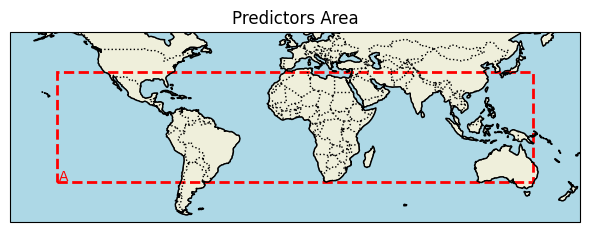

In [100]:
plot_map([extent[1],extent[3],extent[2],extent[0]], sst_indices = defined_zone, title="Predictors Area",fig_size=(6,4))

##### Modes of CCA for each model

In [101]:
was_cca = WAS_CCA(n_modes=n_modes, n_pca_modes=8, dist_method=dist_method)
was_cv = WAS_Cross_Validator(n_splits=len(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))).get_index("T")), nb_omit=2)

CCA Modes for model BOM_2.SST


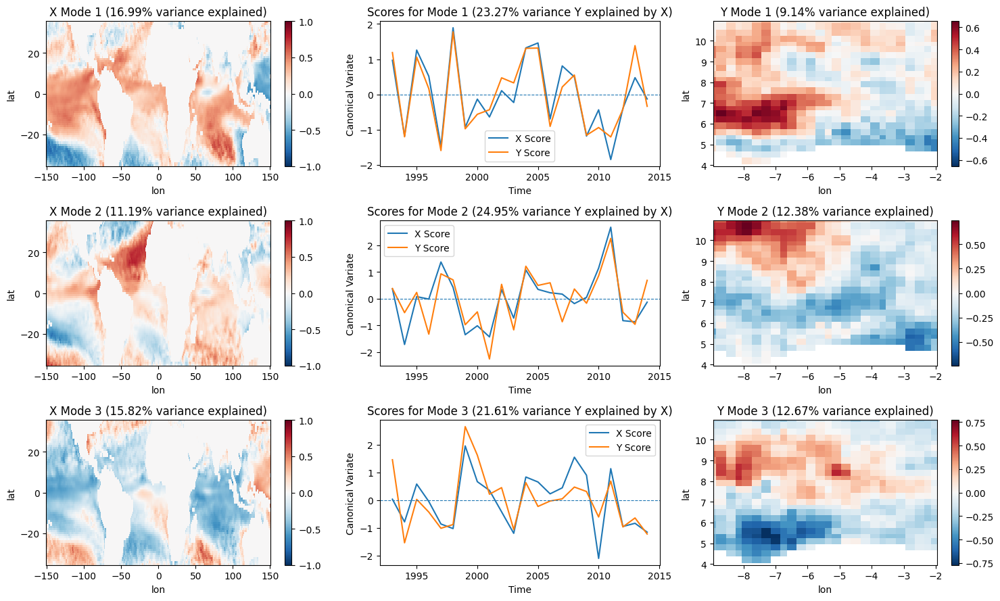

CCA Modes for model ECMWF_51.SST


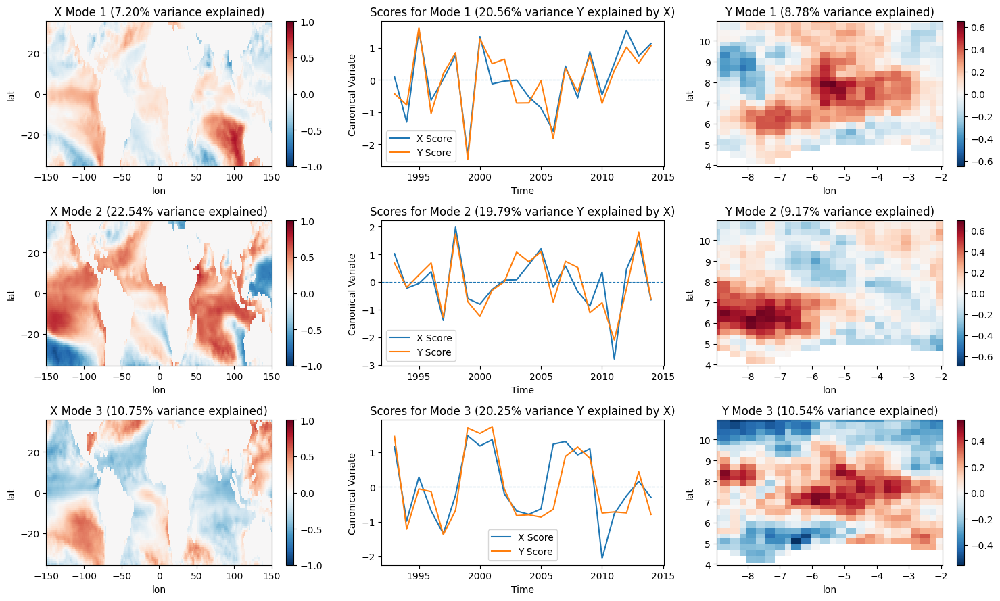

CCA Modes for model DWD_22.SST


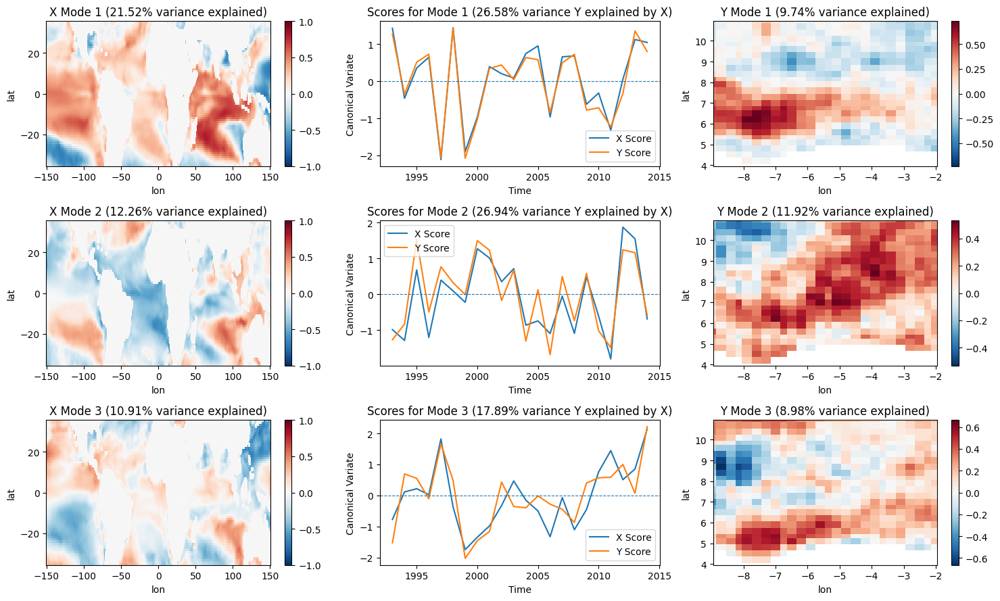

CCA Modes for model NCEP_2.SST


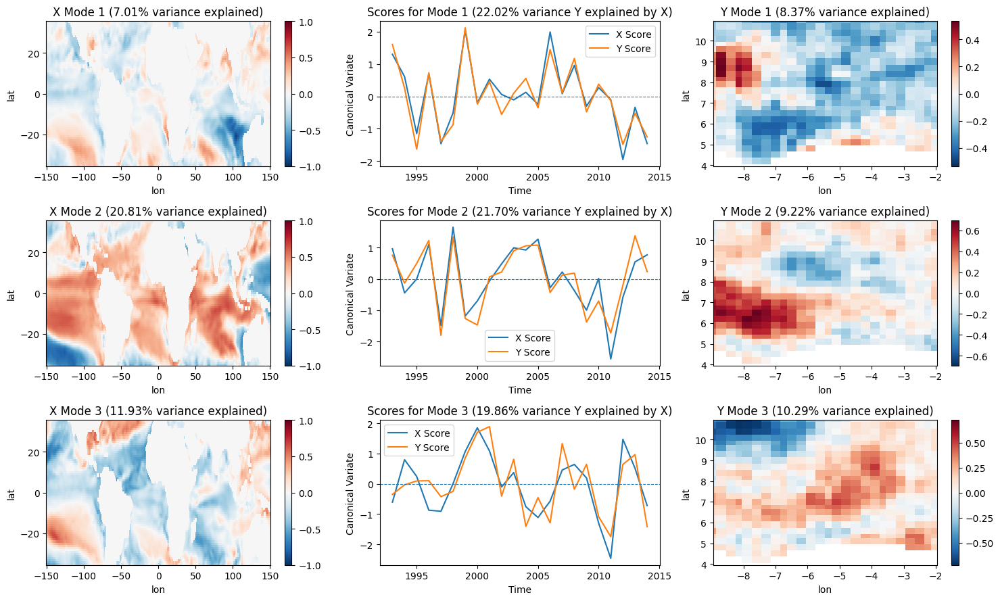

CCA Modes for model ECCC_4.SST


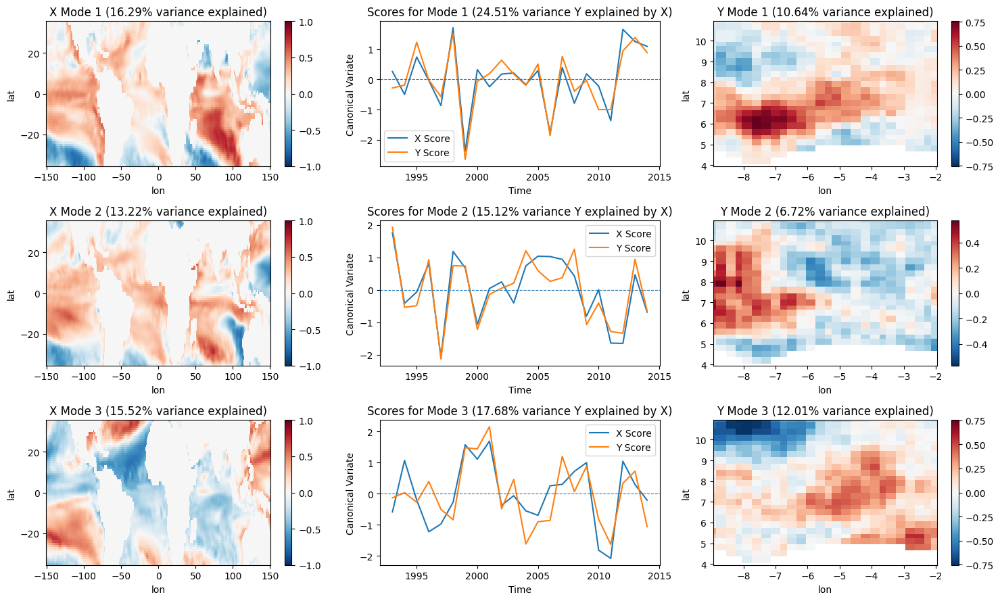

CCA Modes for model ECCC_5.SST


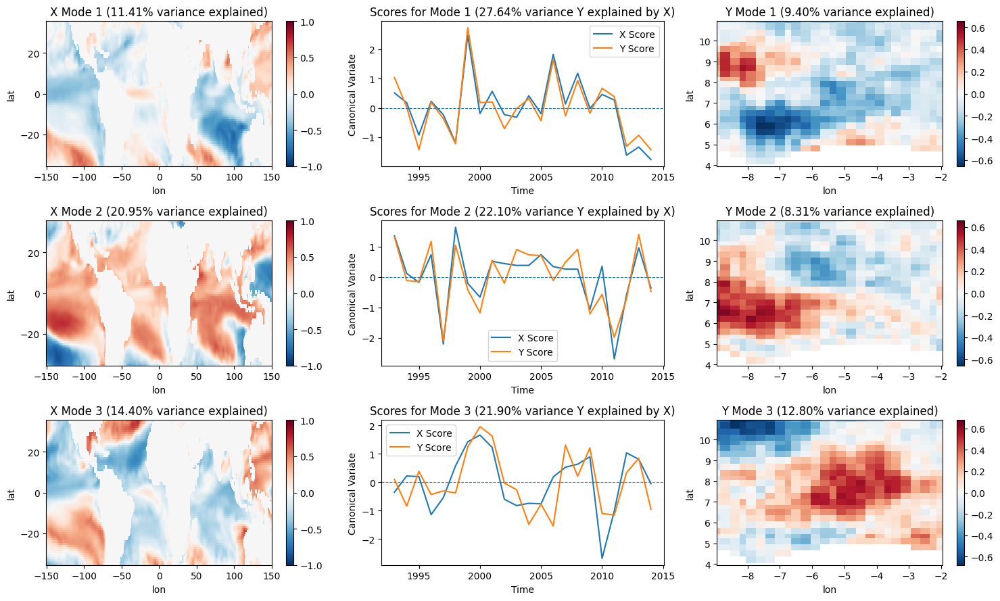

CCA Modes for model CFSV2_1.SST


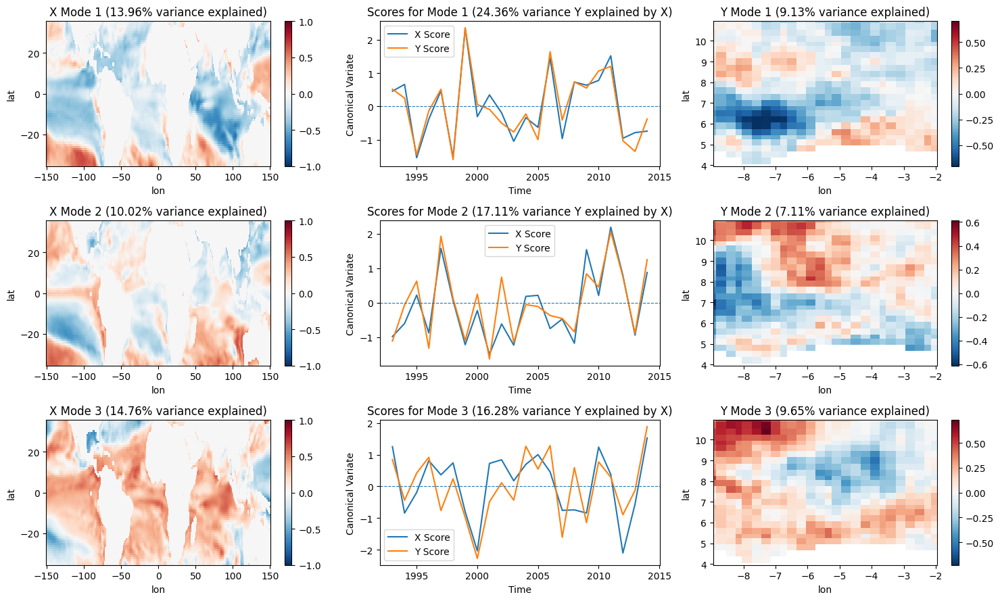

CCA Modes for model CMC1_1.SST


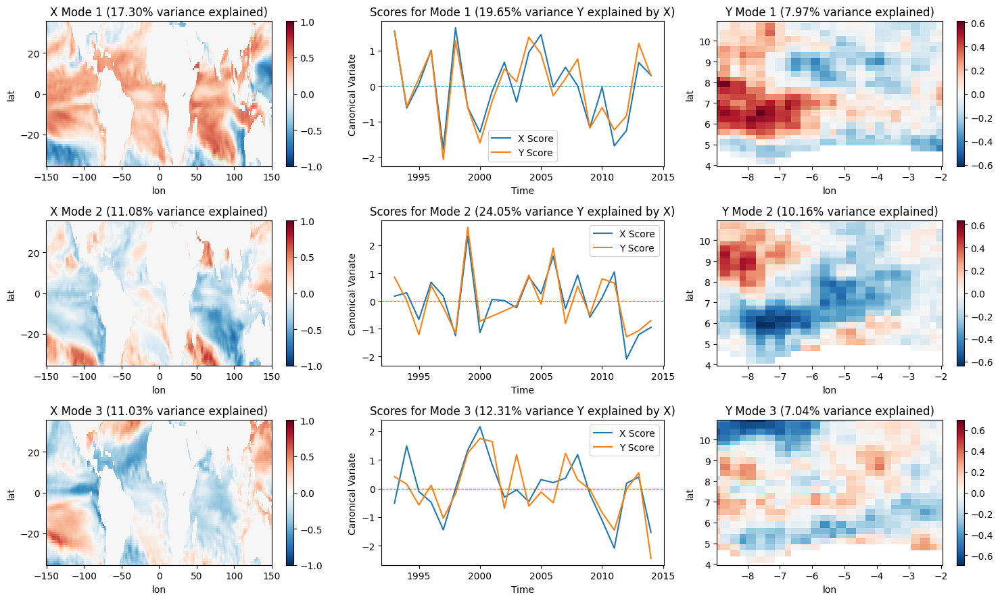

CCA Modes for model CMC2_1.SST


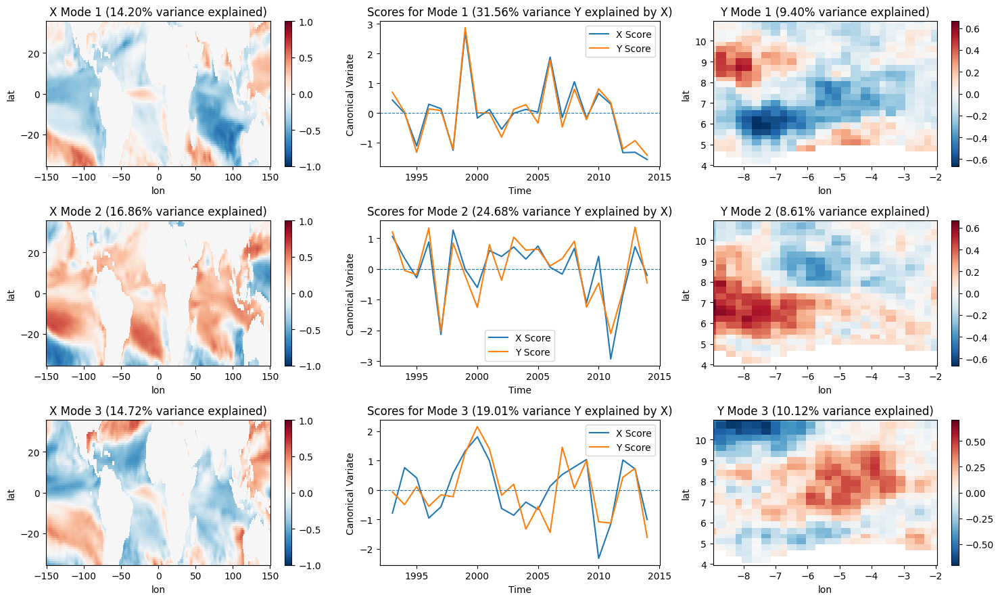

CCA Modes for model NASA_1.SST


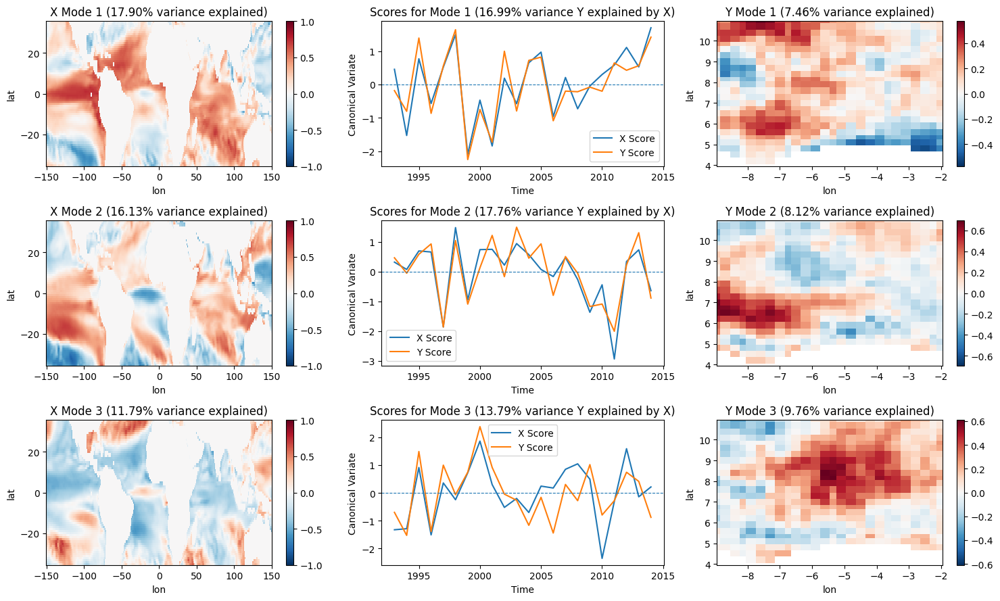

CCA Modes for model NCAR_CCSM4_1.SST


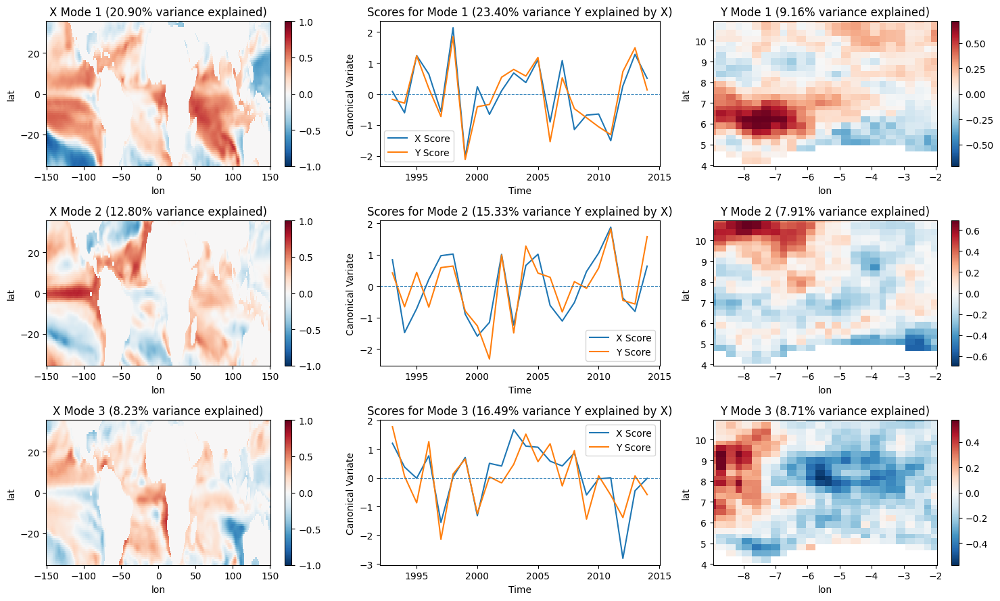

CCA Modes for model NCAR_CESM1_1.SST


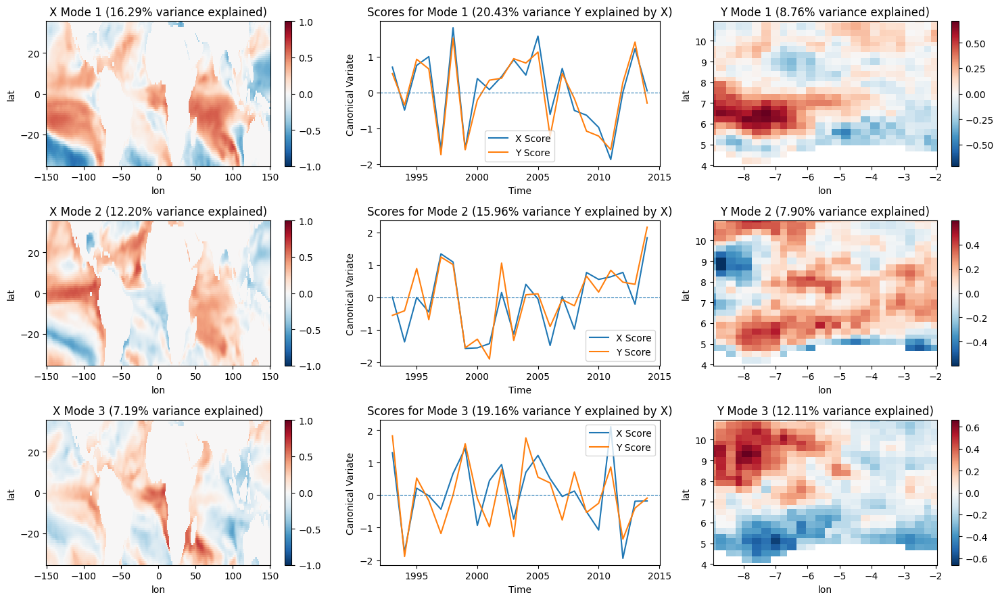

CCA Modes for model NMME_1.SST


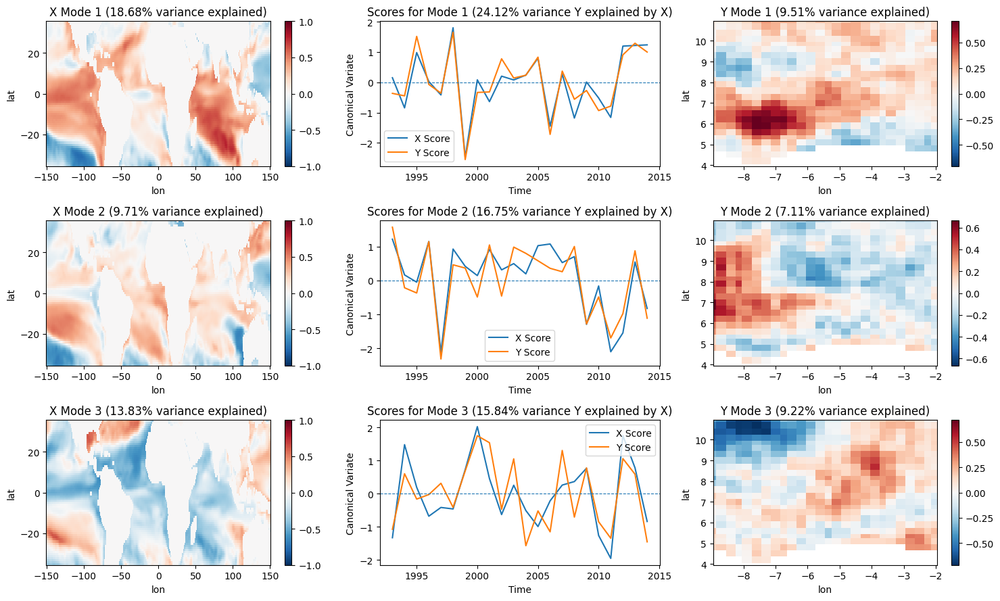

In [102]:
predictors = {}
for i in center_variable:
    predictors[i] = retrieve_single_zone_for_PCR(dir_to_save_model, defined_zone, i, year_start_model, year_end_model, clim_year_start=clim_year_start, clim_year_end=clim_year_end, model=True, month_of_initialization=month_of_initialization, lead_time=lead_time, standardize=True)
    predictor = predictors[i].isel(T = slice(None,-1))
    predictor['T'] = rainfall.sel(T=slice(str(year_start_model),str(year_end_model)))['T']
    print(f"CCA Modes for model {i}")
    was_cca.plot_cca_results(X=predictor, Y=rainfall.sel(T=slice(str(year_start_model),str(year_end_model))) , clim_year_start=clim_year_start, clim_year_end=clim_year_end)

#### Cross validation

In [103]:
hindcast_det_dynam_all = {}
hindcast_prob_dynam_all = {}
for key, predictor in predictors.items():
    predictor = predictor.isel(T = slice(None,-1))
    predictor['T'] = rainfall.sel(T=slice(str(year_start_model),str(year_end_model)))['T']
    print(key.split('.')[0])
    if dist_method=="bestfit":
        hindcast_det_dynam_all[key], hindcast_prob_dynam_all[key] = was_cv.cross_validate(was_cca, rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), 
                                                                                          predictor, clim_year_start, clim_year_end, best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
    else:
        hindcast_det_dynam_all[key], hindcast_prob_dynam_all[key] = was_cv.cross_validate(was_cca, rainfall.sel(T=slice(str(year_start_model),str(year_end_model))).sel(T=slice(str(year_start_model),str(year_end_model))), predictor, clim_year_start, clim_year_end) 

BOM_2
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:07<00:00,  3.31it/s]


ECMWF_51
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:07<00:00,  3.11it/s]


DWD_22
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:08<00:00,  2.96it/s]


NCEP_2
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:08<00:00,  2.95it/s]


ECCC_4
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:07<00:00,  3.09it/s]


ECCC_5
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:08<00:00,  2.88it/s]


CFSV2_1
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:08<00:00,  2.91it/s]


CMC1_1
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:08<00:00,  2.93it/s]


CMC2_1
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:08<00:00,  2.81it/s]


NASA_1
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:08<00:00,  2.85it/s]


NCAR_CCSM4_1
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:08<00:00,  2.96it/s]


NCAR_CESM1_1
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:08<00:00,  2.85it/s]


NMME_1
Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:08<00:00,  2.96it/s]


#### Verification (individual)

###### Deterministic

In [104]:
score = ['Pearson','MAE']
model_name = "CCA-based"

Pearson Correlation


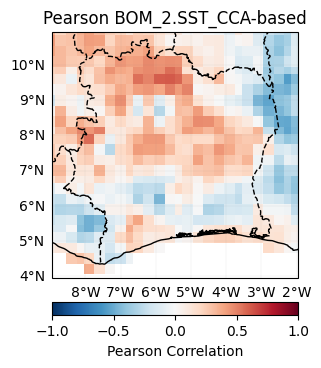

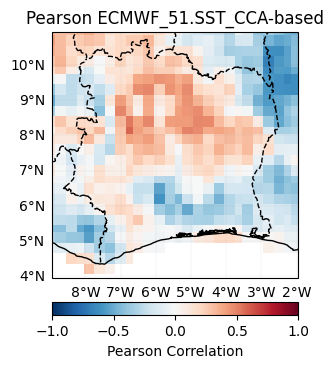

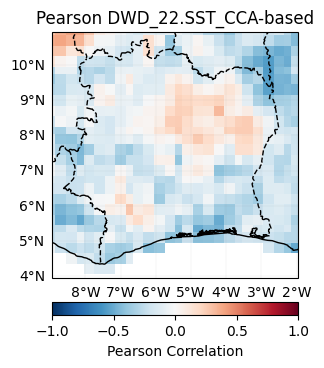

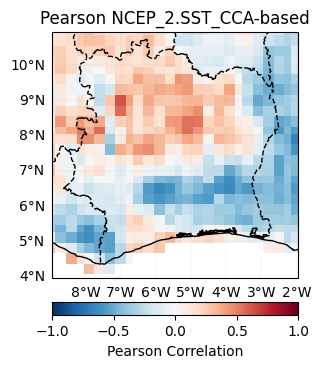

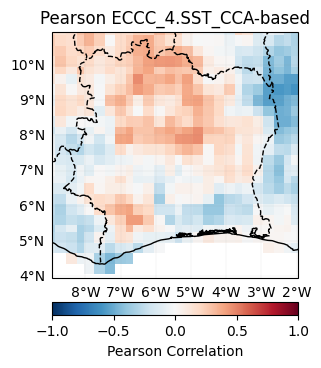

...

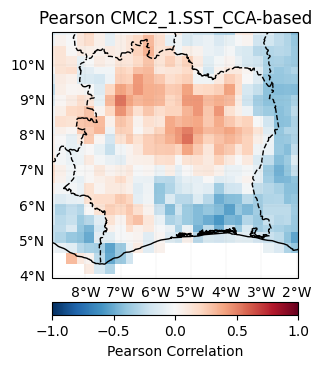

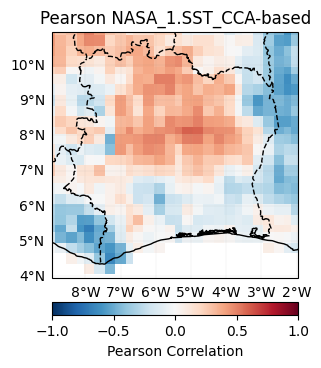

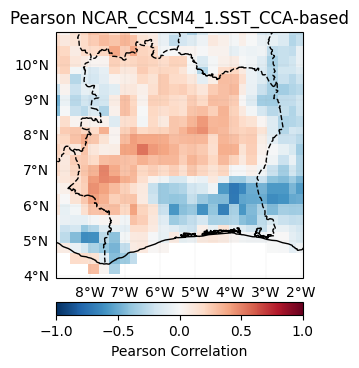

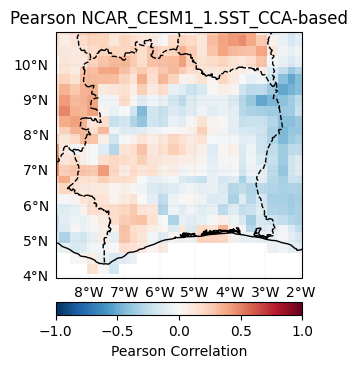

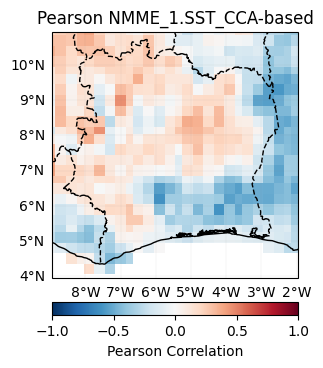

Mean Absolute Error


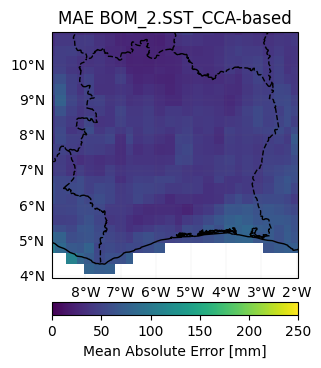

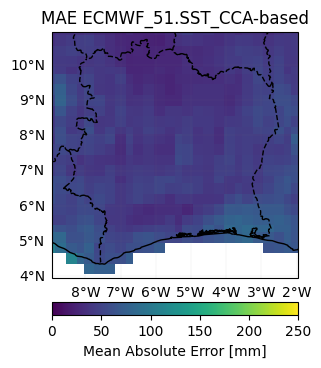

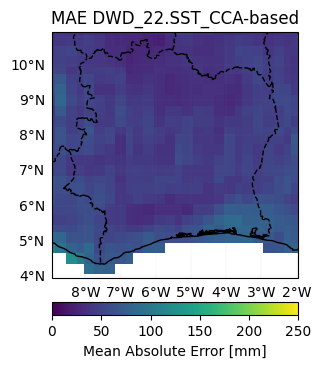

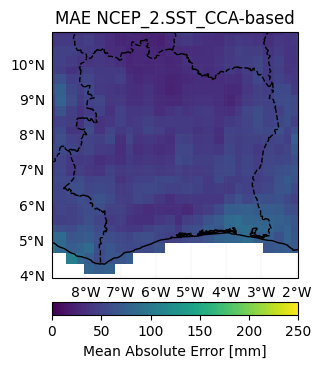

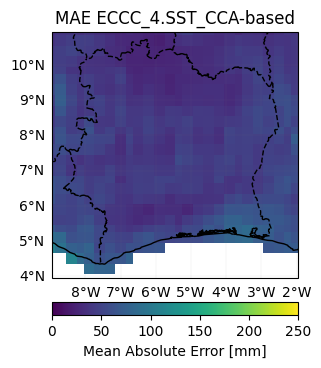

...

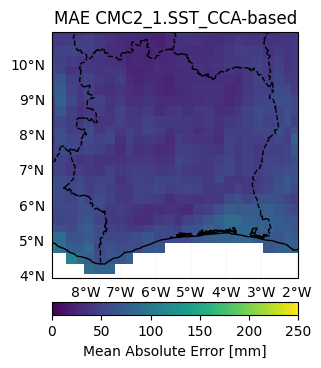

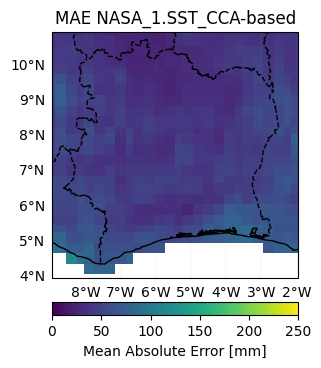

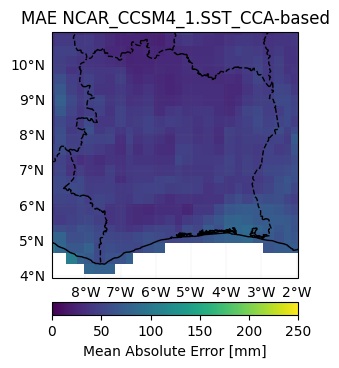

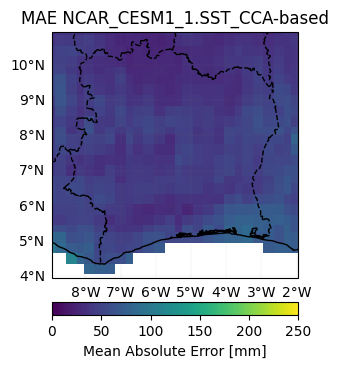

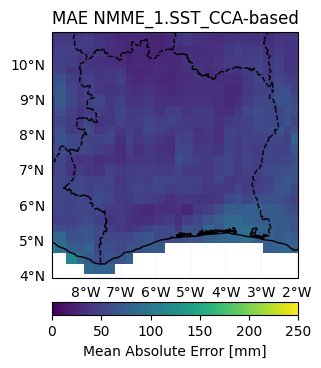

In [105]:
cca_scores = {}
for i in score:
    tmp = {}
    print(was_verify.scores[i][0])
    for key, hdcst in hindcast_det_dynam_all.items():
        tmp[f'{key}_snd.approach'] = was_verify.compute_deterministic_score(
            was_verify.get_scores_metadata()[i][5],
            rainfall.sel(T=slice(str(year_start_model),str(year_end_model))),
            hindcast_det_dynam_all[key]
        )
        was_verify.plot_model_score(tmp[f'{key}_snd.approach'], i, dir_save_score, f"{key}_{model_name}")
    cca_scores[i] = tmp

###### Probabilistic

In [106]:
score = ['GROC', 'RPSS']

Generalized Discrimination Score


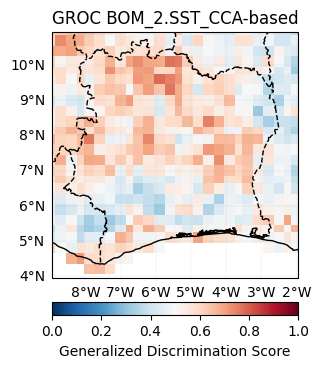

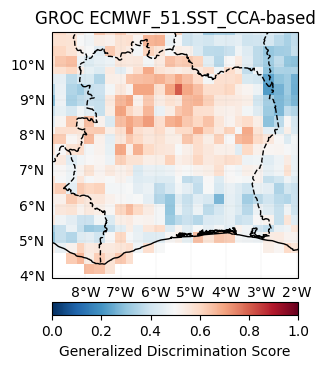

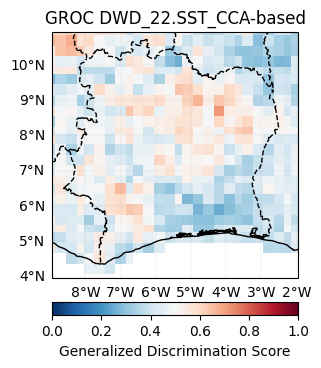

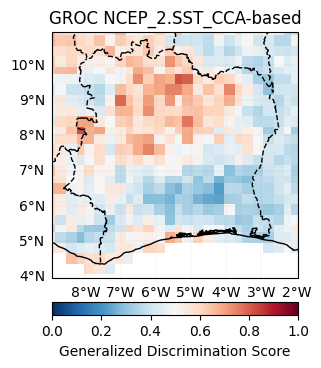

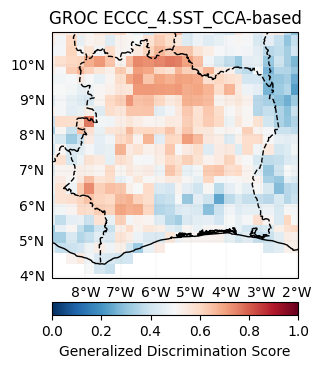

...

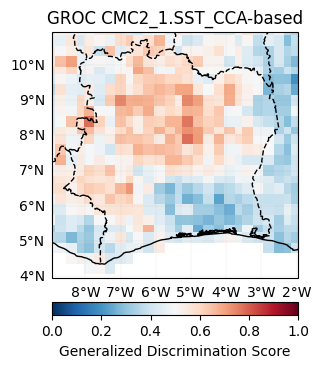

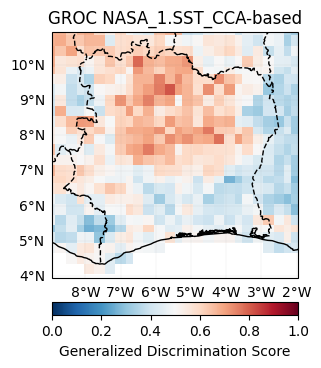

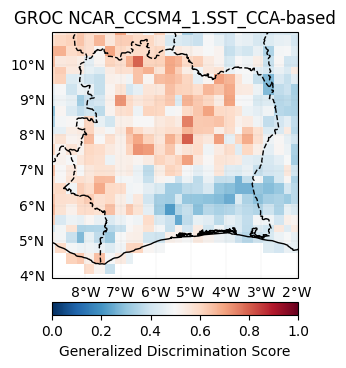

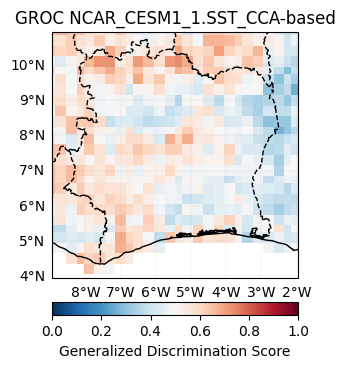

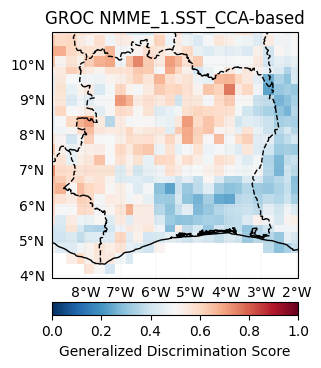

Ranked Probability Skill Score


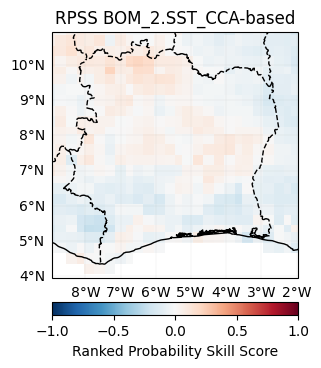

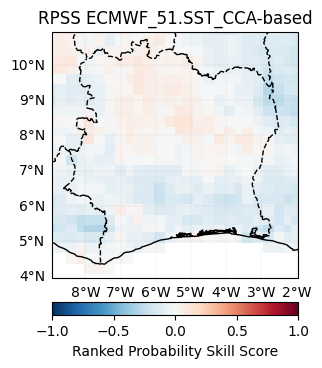

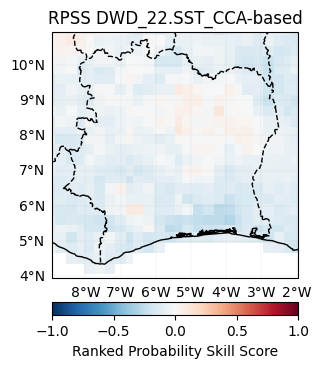

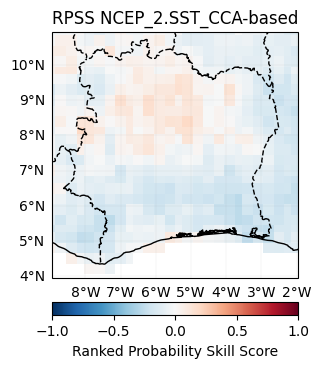

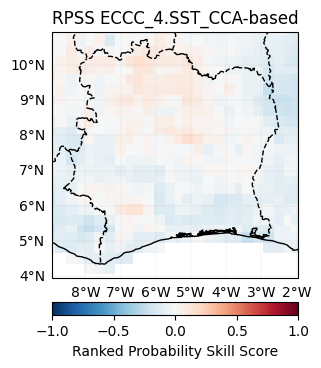

...

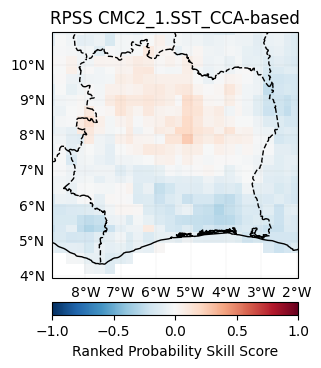

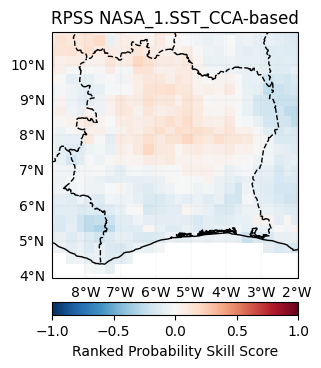

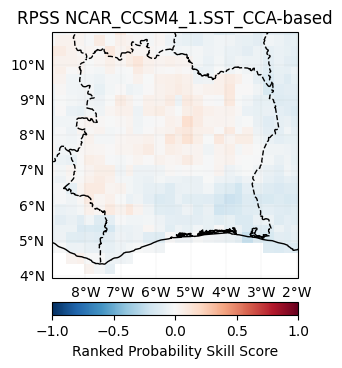

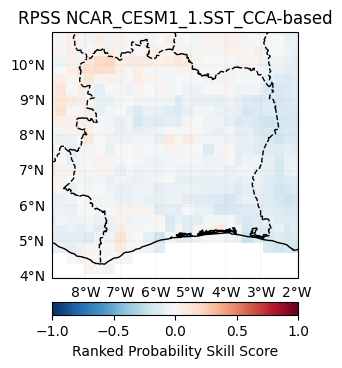

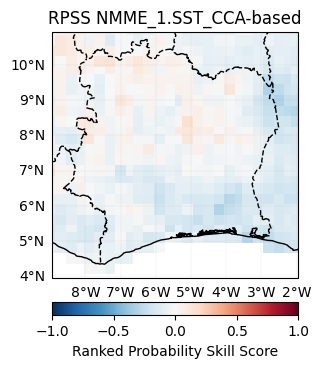

In [107]:
score = score.append('GROC') if 'GROC' not in score else score
for i in score:
    tmp = {}
    print(was_verify.scores[i][0])
    for key, hdcst in hindcast_det_dynam_all.items():
        tmp[f'{key}_snd.approach'] = was_verify.compute_probabilistic_score(
            was_verify.get_scores_metadata()[i][5],
            rainfall.sel(T=slice(str(year_start_model),str(year_end_model))),
            hindcast_prob_dynam_all[key],
            clim_year_start,
            clim_year_end)
        was_verify.plot_model_score(tmp[f'{key}_snd.approach'], i, dir_save_score, f"{key}_{model_name}")
    cca_scores[i] = tmp

#### Forecast (individual)

In [108]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


BOM_2


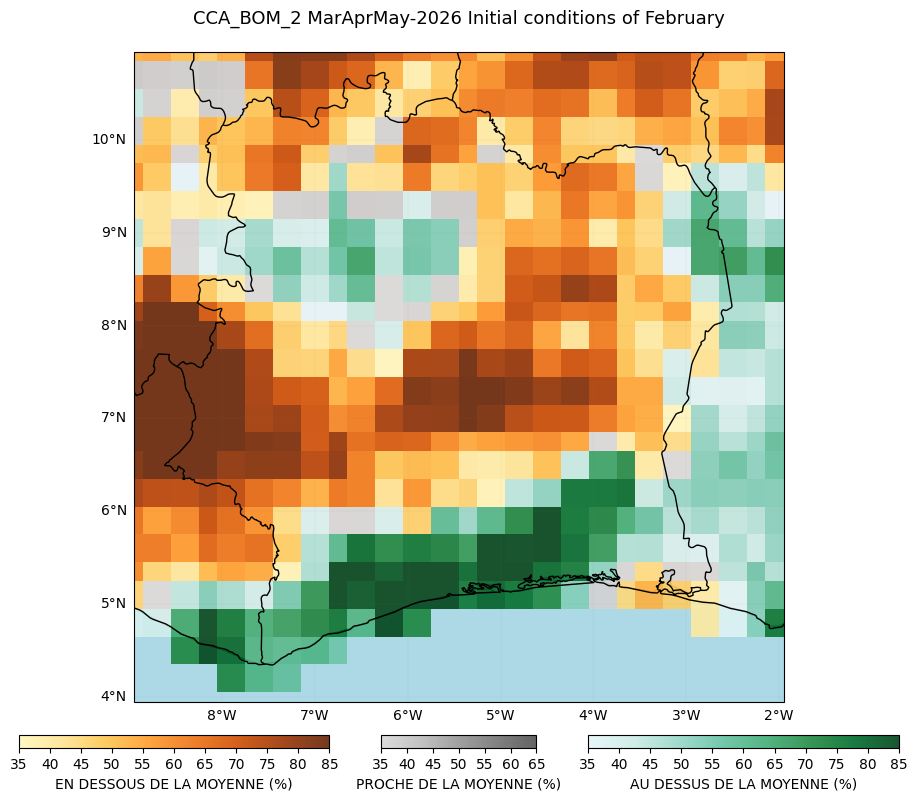

ECMWF_51


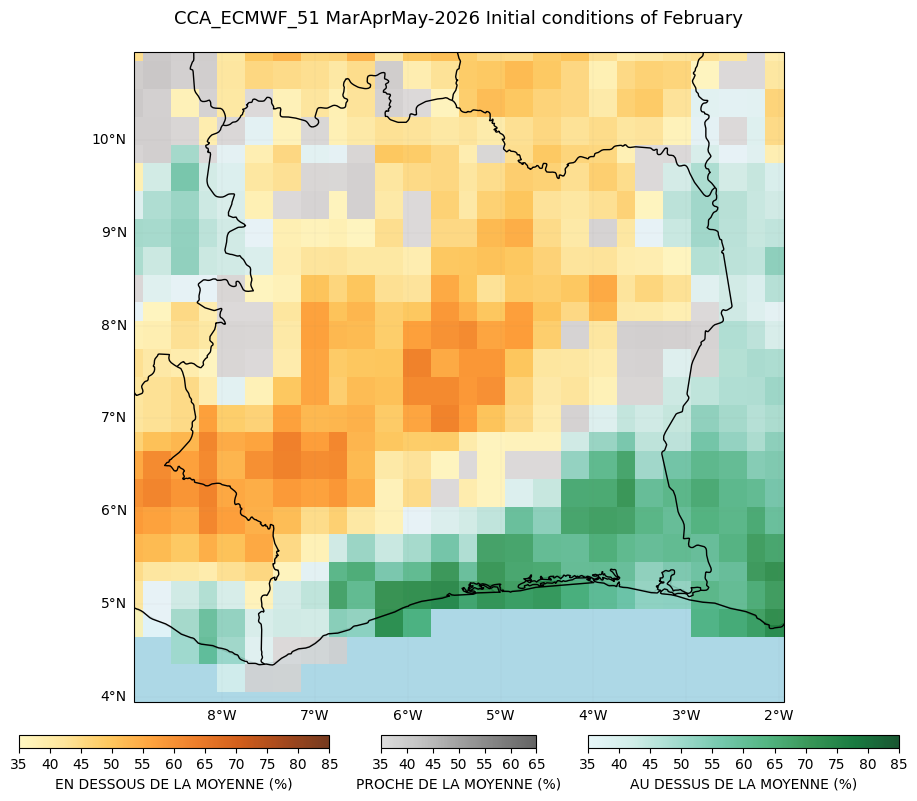

DWD_22


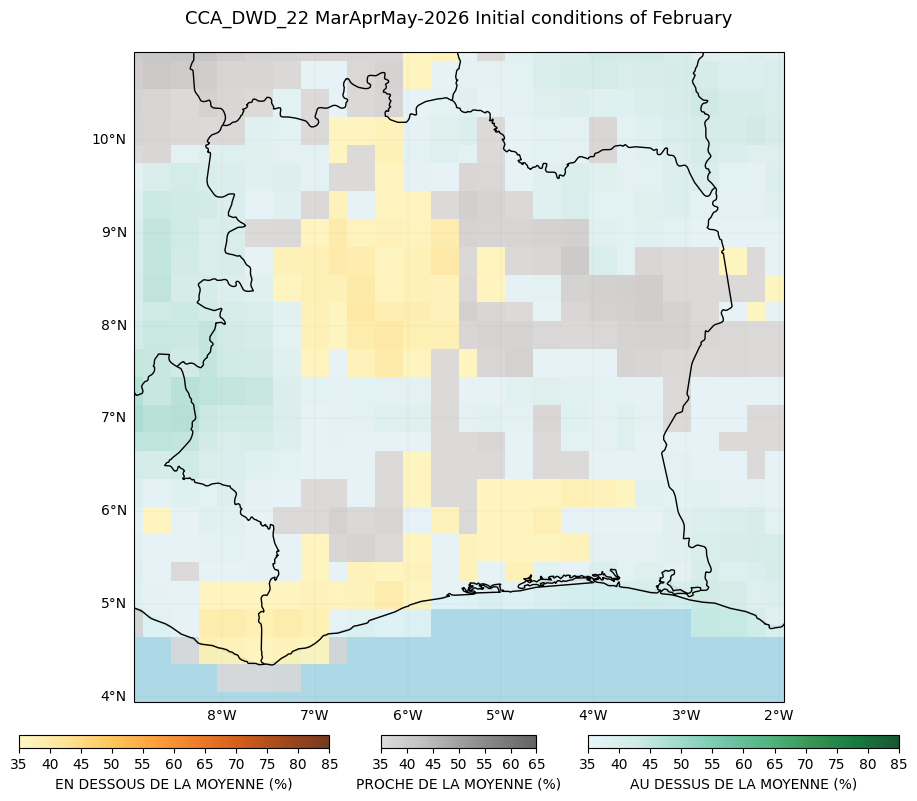

NCEP_2


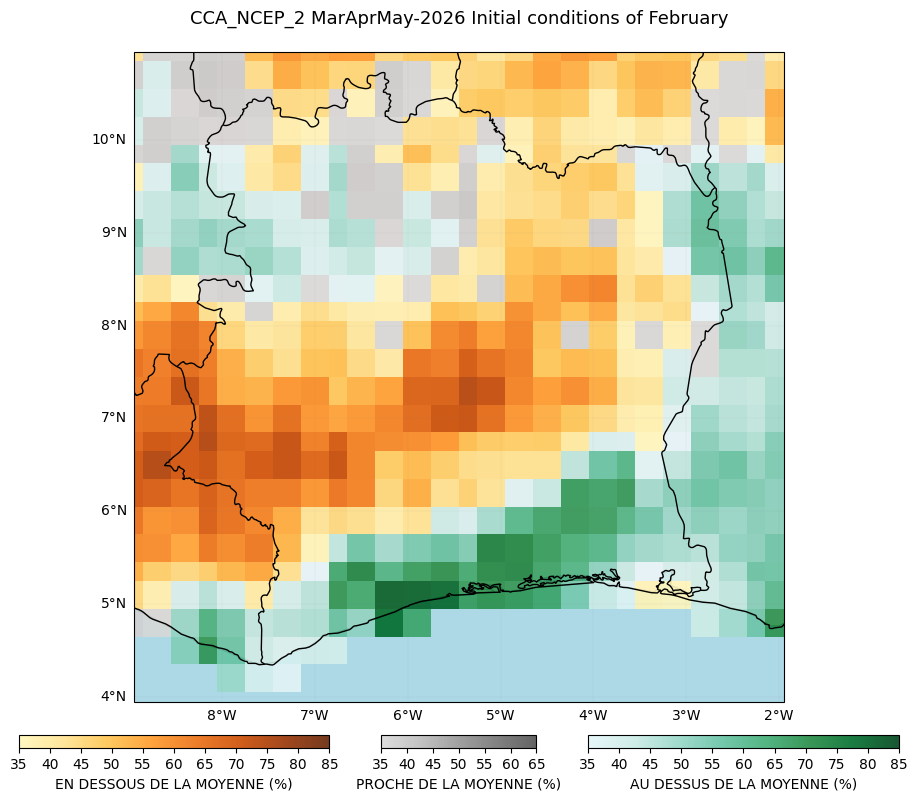

ECCC_4


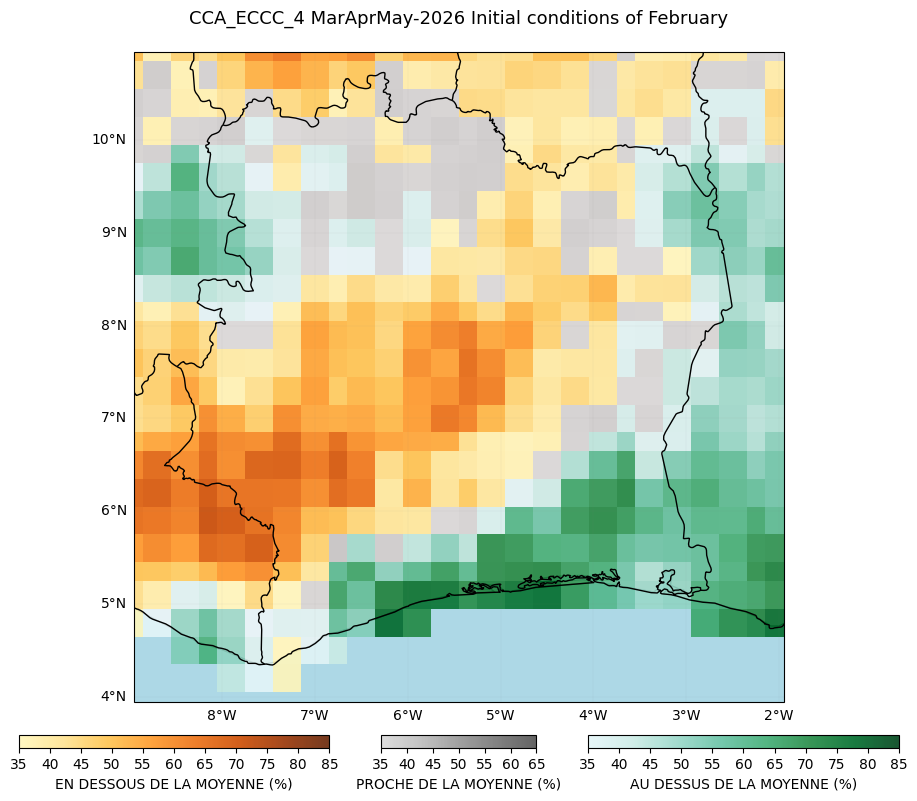

ECCC_5


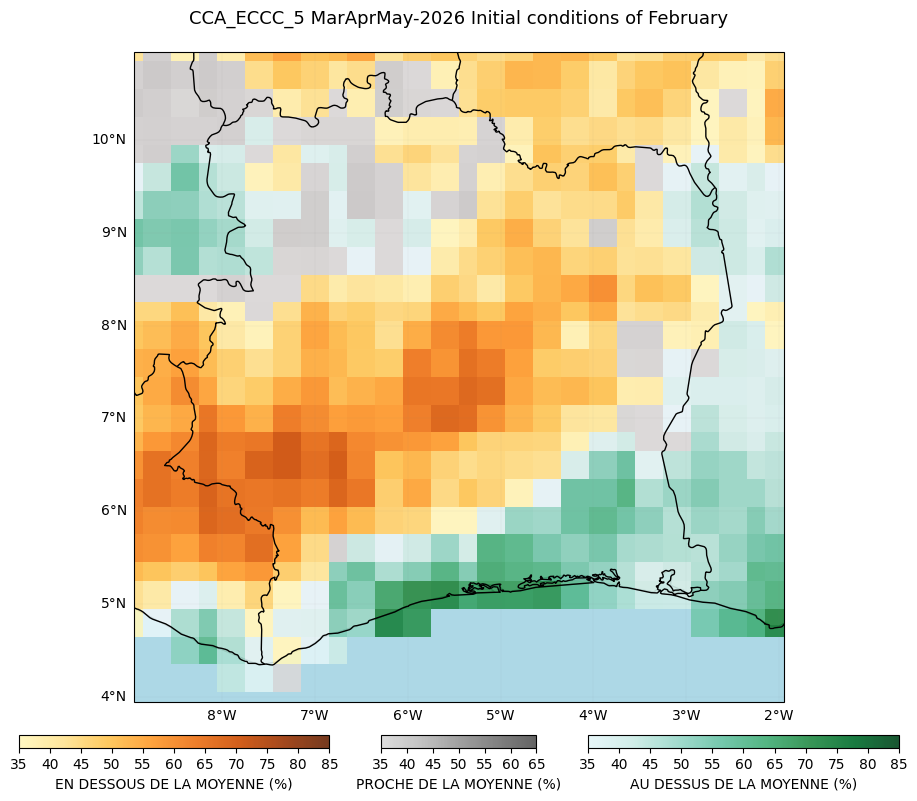

CFSV2_1


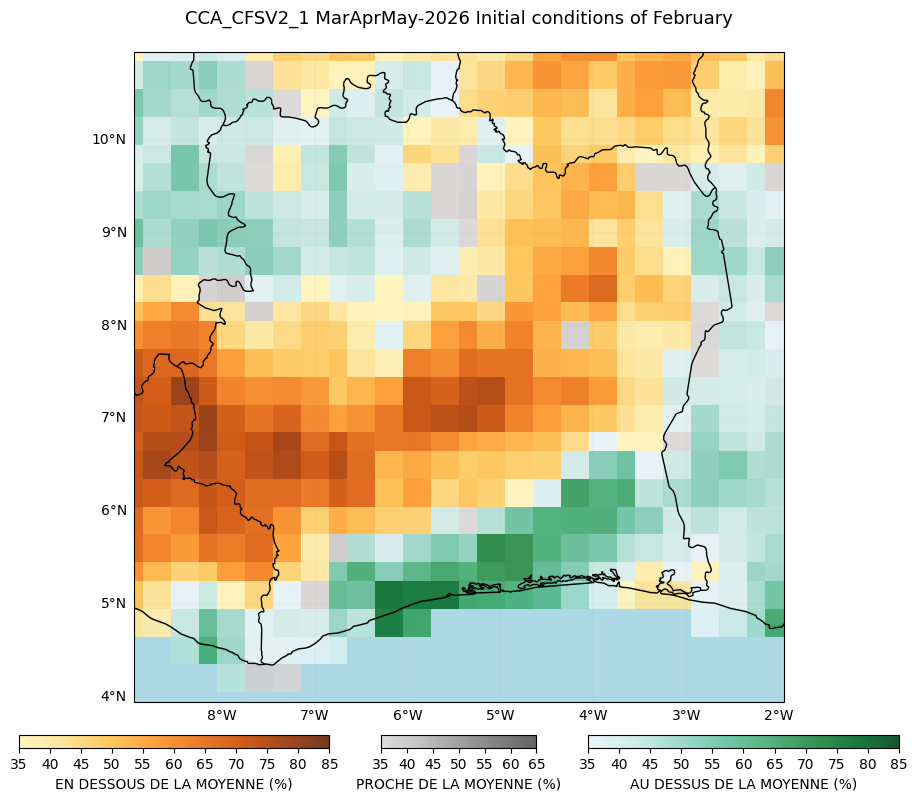

CMC1_1


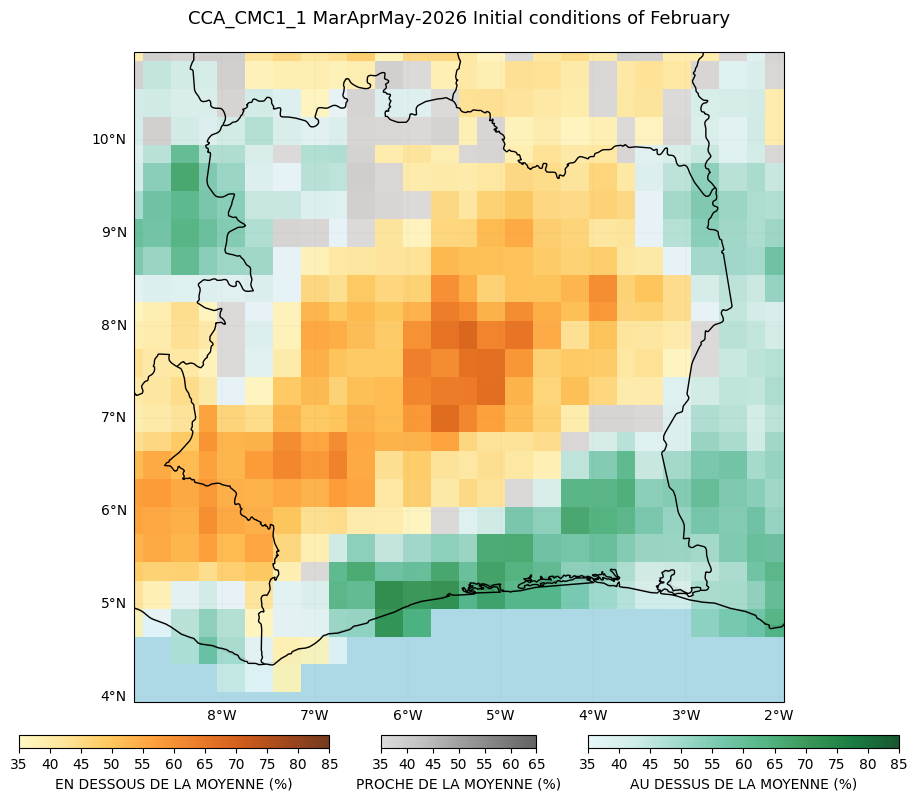

CMC2_1


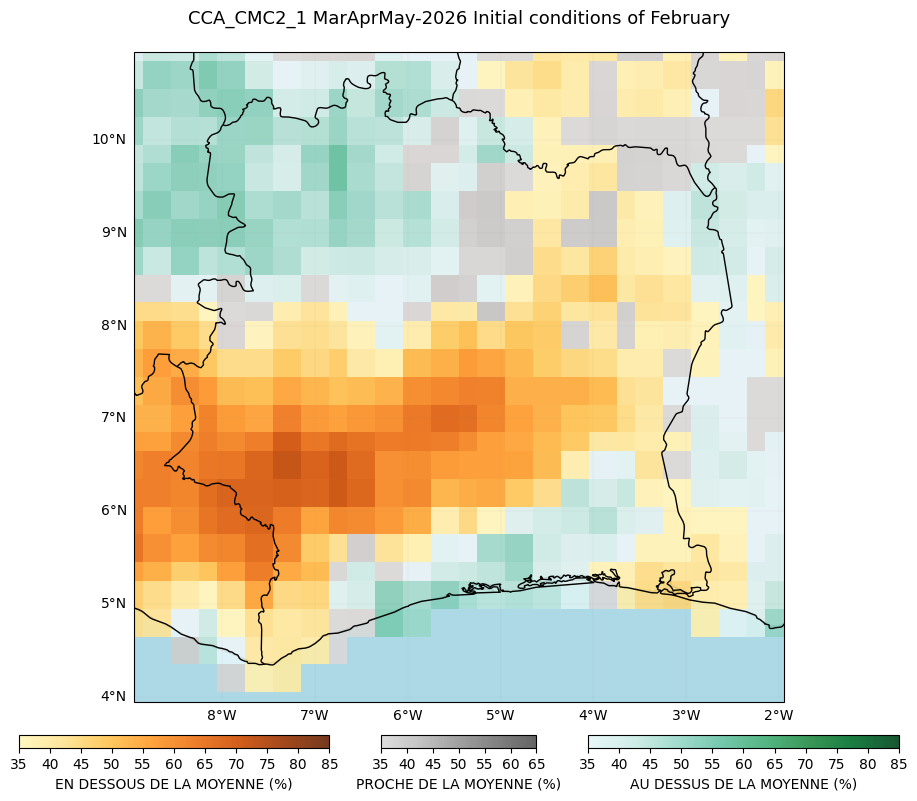

NASA_1


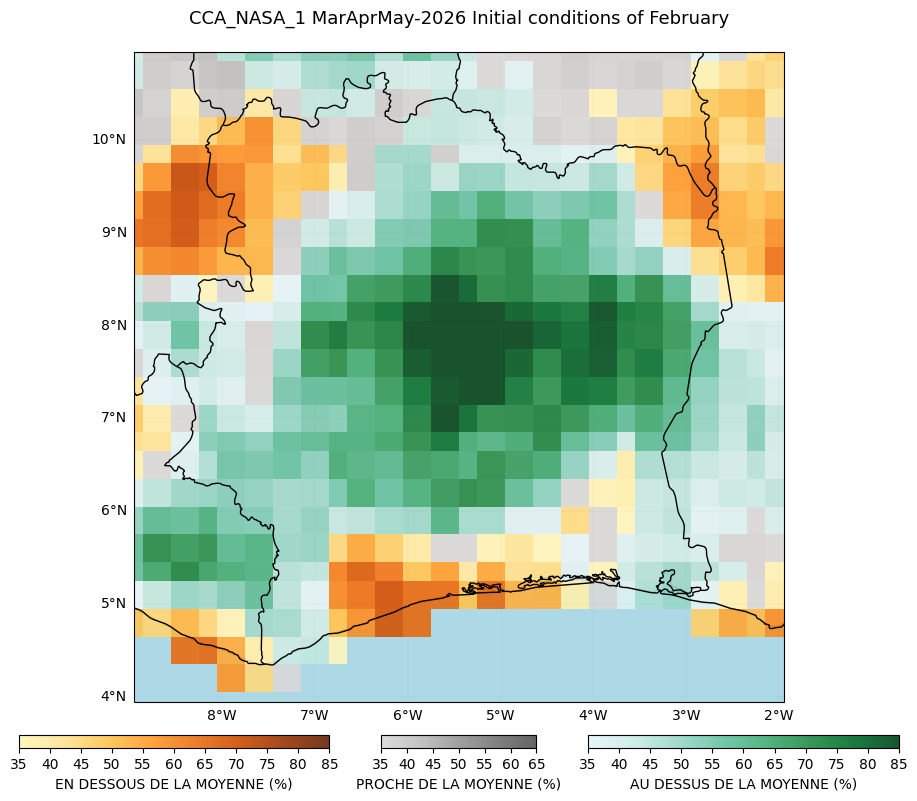

NCAR_CCSM4_1


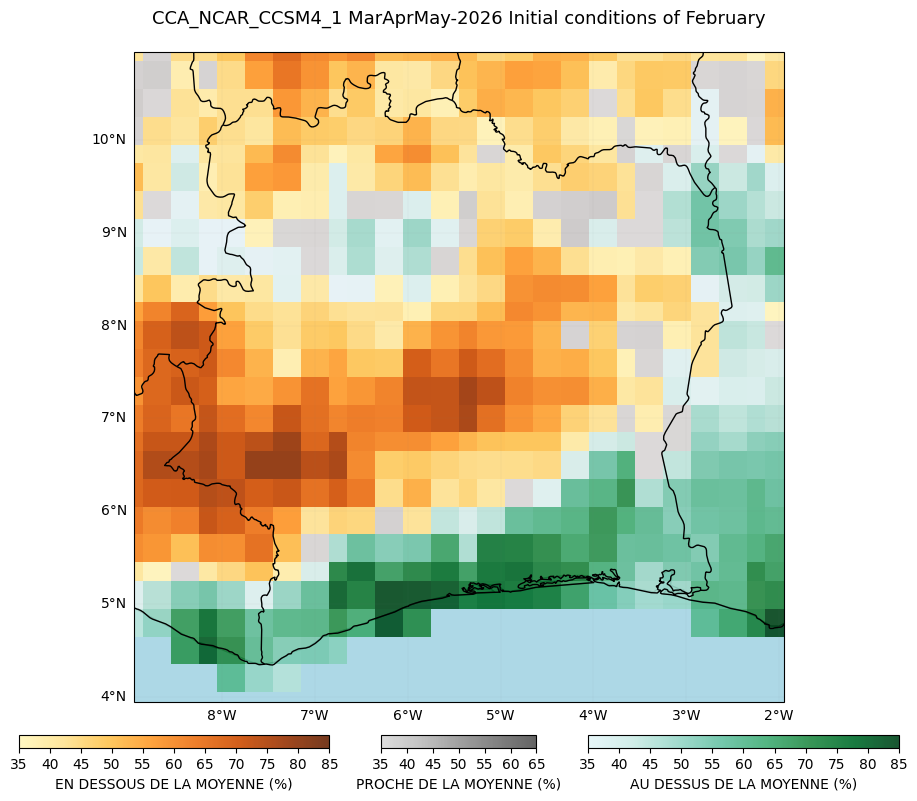

NCAR_CESM1_1


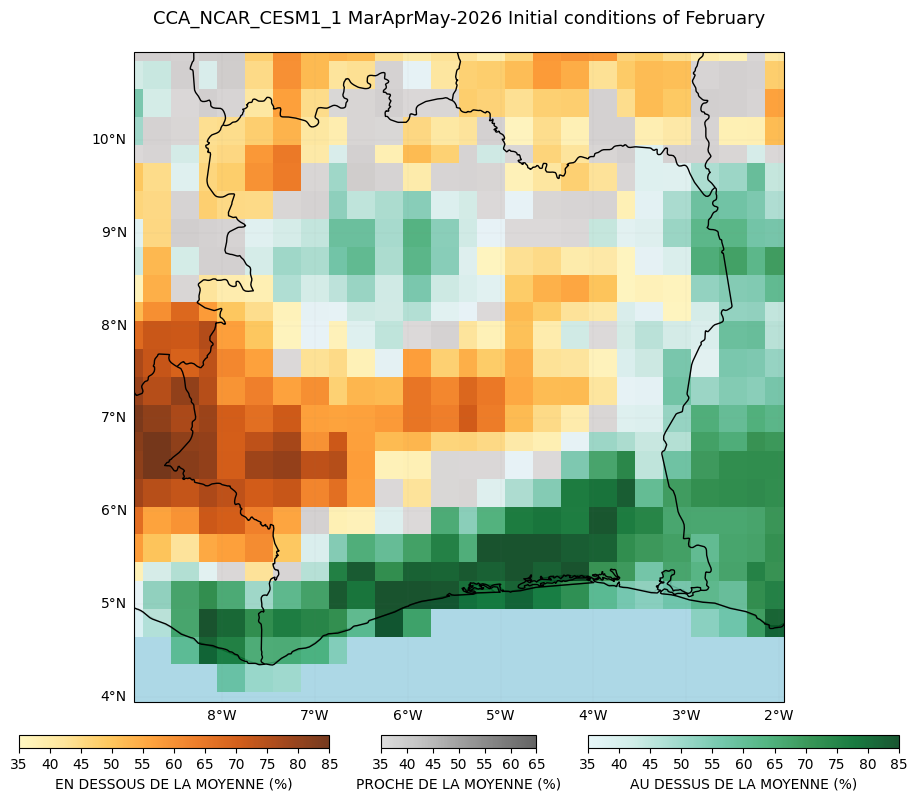

NMME_1


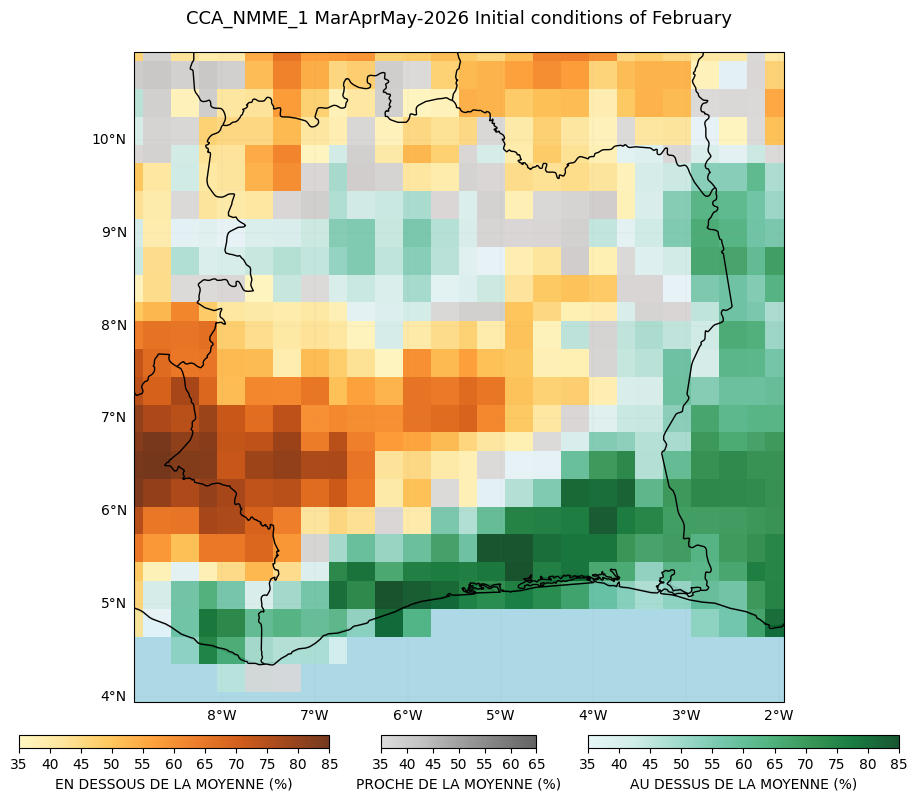

In [109]:
forecast_det_dynam_all = {}
forecast_prob_dynam_all = {}
for key, predictor in predictors.items():
    predictor_f = predictor.isel(T=[-1])
    predictor = predictor.isel(T = slice(None,-1))
    predictor['T'] = rainfall.sel(T=slice(str(year_start_model),str(year_end_model)))['T']
    print(key.split('.')[0])
    if dist_method=="bestfit":
        forecast_det_dynam_all[key], forecast_prob_dynam_all[key] = was_cca.forecast(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), clim_year_start, clim_year_end, predictor, hindcast_det_dynam_all[key], predictor_f, best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
    else:
        forecast_det_dynam_all[key], forecast_prob_dynam_all[key] = was_cca.forecast(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), clim_year_start, clim_year_end, predictor, hindcast_det_dynam_all[key], predictor_f)
    model_name = f"CCA_{key.split('.')[0]}"    
    plot_prob_forecasts_(f"{dir_to_forecast}",
                        forecast_prob_dynam_all[key].drop_vars('T').squeeze(), f"{model_name} {season_str}-{forecast} Initial conditions of {calendar.month_name[int(month_of_initialization)]}", 
                        hspace=0.1, labels=fcst_labels, reverse_cmap=False)

### Select best Statistico-Dynamical models

In [110]:
#### Select some models
best_models = get_best_models(center_variable, cca_scores, metric='GROC', threshold=0.55, top_n=8, gcm=False)
best_models

['BOM_2.SST',
 'NASA_1.SST',
 'NCAR_CESM1_1.SST',
 'NCAR_CCSM4_1.SST',
 'ECCC_5.SST',
 'ECCC_4.SST',
 'ECMWF_51.SST',
 'NCEP_2.SST']

In [111]:
for key in best_models:
    hdcst_consolidated[f'{key}_snd.approach'] = hindcast_det_dynam_all[key]
    fcst_consolidated[f'{key}_snd.approach'] = forecast_det_dynam_all[key]
    hdcst_consolidated_prob[f'{key}_snd.approach'] = hindcast_prob_dynam_all[key]
    fcst_consolidated_prob[f'{key}_snd.approach'] = forecast_prob_dynam_all[key]
    
for metric, models in cca_scores.items():
    for model in list(models):                    # list() pour éviter RuntimeError
        if not any(model.startswith(p) for p in best_models):
            del models[model]

for key in cca_scores:
    scores_consolidated.setdefault(key, {}).update(cca_scores[key])

# 3rd - Approach: Observation-Based with Lag (Obs-Lag) 

In [112]:
# Filter model names to identify precipitation-related models
variables_reanalysis = ["NOAA.SST"] #[key for key in downloader.ReanalysisName().keys() if "SST" in key]# or "VGRD_850" in key]

# Specify the directory to save downloaded model data
dir_to_save_Reanalysis = f"{dir_s2s}/reanalysis_data/"

# choose sequence corresponding to seasonal forecast targets (JAS season in this case)
season = ["10","11","12"]  # Jan-Feb-Mar forecast period

# Define the observation period (years 1993 to 2016)
year_start = 1990
year_end = 2025

# Set the bounding box for the area of interest (latitude and longitude bounds)
extent = [60, -180, -60, 180]  # [Northern, Western, Southern and Eastern] 

# Specify whether to overwrite existing files when downloading data
force_download = False

In [113]:
downloader.WAS_Download_Reanalysis(
    dir_to_save_Reanalysis,
    variables_reanalysis,
    year_start,
    year_end,
    extent,
    season, 
    force_download
)

Starting download for NOAA ERSST (v6) for 1990-2025
All files downloaded. merging and processing...
Saved NOAA ERSST data to PRCP_MAM_2026_ic_1\reanalysis_data\NOAA_SST_1990_2025_OctNovDec.nc


## MLR with SST Indices

##### Process SST index 

In [114]:
# Print available SST index
print(list(sst_indices_name.keys()))

['NINO34', 'NINO12', 'NINO3', 'NINO4', 'NINO_Global', 'TNA', 'TSA', 'NAT', 'SAT', 'TASI', 'WTIO', 'SETIO', 'DMI', 'MB']


In [115]:
## Choose yours
sst_index_name = ['TNA', 'TSA', 'NINO34'] # 

# Set your own indices zones ( zones not available in built-in)
my_own_indices_zone = {
                         #'A': ('A', -55, 10, -20, 25),
                         # 'B': ('B', -170, -80, -10, 10),
                         # 'C': ('C', -10, 10, 1, 5),
                        }
others_zone = my_own_indices_zone

In [116]:
# Combine all zones
sst_indices_all = {i: sst_indices_name[i] for i in sst_index_name} 
sst_indices_all.update(my_own_indices_zone) if my_own_indices_zone is not None else {i: sst_indices_name[i] for i in sst_index_name} 

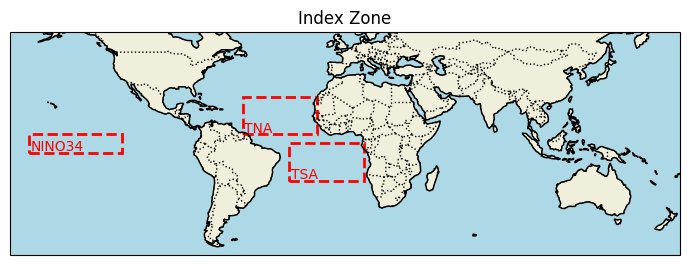

In [117]:
plot_map([extent[1],extent[3],extent[2],extent[0]], sst_indices = sst_indices_all, title="Index Zone",fig_size=(7,4))

In [118]:
predictors = compute_sst_indices(dir_to_save_Reanalysis, sst_index_name, variables_reanalysis[0], year_start, year_end, season, clim_year_start, clim_year_end, my_own_indices_zone)

NOAA SST


##### Calculate variance inflation factor to see multicolinearity predictor

In [119]:
# Calculate VIF for each predictor
vif_data = pd.DataFrame()
vif_data["feature"] = predictors.to_dataframe().columns
vif_data["VIF"] = [VIF(predictors.to_dataframe(), i) for i in range(predictors.to_dataframe().shape[1])]
# Print VIF values
print(vif_data)

  feature       VIF
0     TNA  1.335657
1     TSA  1.447631
2  NINO34  1.098766


In [120]:
# Set a threshold for VIF (e.g., 10)
vif_threshold = 5

In [121]:
low_vif_predictors = vif_data[vif_data["VIF"] < vif_threshold]["feature"].tolist()
# Filter the predictors to exclude those with high VIF
filtered_predictors = predictors[low_vif_predictors].to_array()
filtered_predictors = filtered_predictors.rename({"variable": "features"}).transpose('T', 'features')
print(low_vif_predictors)

['TNA', 'TSA', 'NINO34']


In [122]:
# Available core over machine
cpu_count()

8

In [123]:
#### Set core number for computation
nb_cores = 4

In [124]:
# Load class for model, cross-validation and verification
model = WAS_LinearRegression_Model(nb_cores = nb_cores, dist_method=dist_method)

#### Cross validation

In [125]:
# Instantiate cross-validation
was_cv = WAS_Cross_Validator(n_splits=len(rainfall.get_index("T")), nb_omit=2)

In [126]:
filtered_predictors_ = filtered_predictors.isel(T = slice(None,-1))
filtered_predictors_['T'] = rainfall['T']
if dist_method=="bestfit":
    hindcast_det_obs_seas_mlr, hindcast_prob_obs_seas_mlr = was_cv.cross_validate(model, rainfall, filtered_predictors_, clim_year_start, clim_year_end, best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
else:
    hindcast_det_obs_seas_mlr, hindcast_prob_obs_seas_mlr = was_cv.cross_validate(model, rainfall, filtered_predictors_, clim_year_start, clim_year_end)
hdcst_consolidated['MLR_VIF.ERSST'] = hindcast_det_obs_seas_mlr.sel(T=slice(str(year_start_model),str(year_end_model)))
hdcst_consolidated_prob['MLR_VIF.ERSST'] = hindcast_prob_obs_seas_mlr.sel(T=slice(str(year_start_model),str(year_end_model)))

Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 35/35 [18:12<00:00, 31.22s/it]


#### Verification

In [127]:
score = ['Pearson','MAE']
model_name = "Observation-Based with Lag"

###### Deterministic

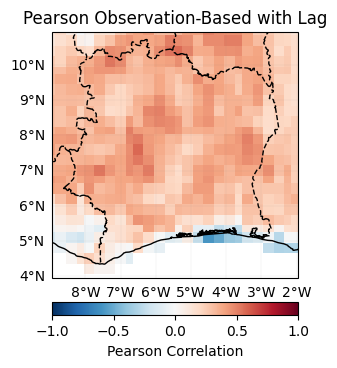

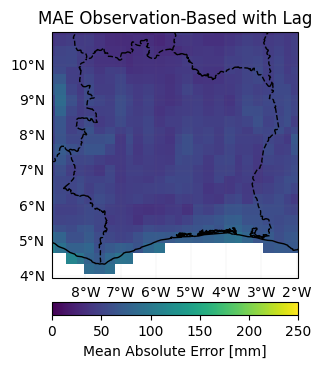

In [128]:
third_scores = {}
hindcast_det_obsBased_all = {}
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall,
        hindcast_det_obs_seas_mlr
    )
    was_verify.plot_model_score(r, i, dir_save_score, model_name)
    scores_consolidated[i] = {'MLR_VIF.ERSST': r}
    third_scores[i] = {'MLR_VIF.SST': r}
hindcast_det_obsBased_all['MLR_VIF.ERSST'] = hindcast_det_obs_seas_mlr

###### Probabilistic

In [129]:
score = ['GROC', 'RPSS']

Generalized Discrimination Score


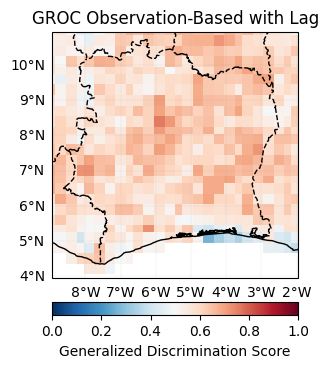

Ranked Probability Skill Score


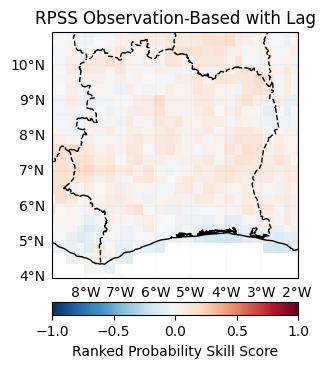

In [130]:
score = score.append('GROC') if 'GROC' not in score else score
hindcast_prob_obsBased_all = {}
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall,
        hindcast_prob_obs_seas_mlr,
        clim_year_start,
        clim_year_end)
    was_verify.plot_model_score(r, i, dir_save_score, model_name)
    third_scores[i] = {'MLR_VIF.SST': r}
    scores_consolidated[i] = {'MLR_VIF.ERSST': r}
    # scores_consolidated[i]['MLR_VIF.ERSST'] = r
hindcast_prob_obsBased_all['MLR_VIF.ERSST'] = hindcast_prob_obs_seas_mlr

#### Forecast

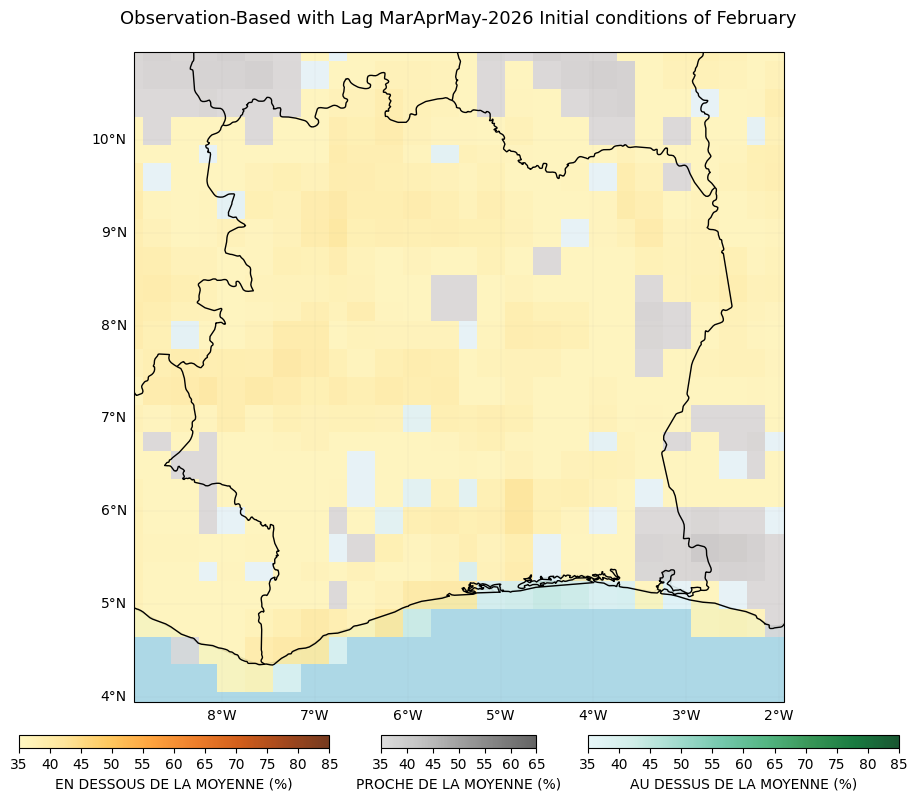

In [131]:
forecast_det_obsBased_all = {}
forecast_prob_obsBased_all = {}
f_predictors = filtered_predictors.isel(T=[-1])
f_predictors['T'] = forecast_det_gcm['T']
if dist_method=="bestfit":
    forecast_det_mlr, forecast_prob_mlr = model.forecast(rainfall, clim_year_start, clim_year_end, filtered_predictors_, hindcast_det_obs_seas_mlr, f_predictors, best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
else:
    forecast_det_mlr, forecast_prob_mlr = model.forecast(rainfall, clim_year_start, clim_year_end, filtered_predictors_, hindcast_det_obs_seas_mlr, f_predictors)
    
forecast_det_obsBased_all['MLR_VIF.ERSST'] = forecast_det_mlr
forecast_prob_obsBased_all['MLR_VIF.ERSST'] = forecast_prob_mlr
fcst_consolidated['MLR_VIF.ERSST'] = forecast_det_mlr
fcst_consolidated_prob['MLR_VIF.ERSST'] = forecast_prob_mlr
plot_prob_forecasts_(f"{dir_to_forecast}", 
                    forecast_prob_mlr.drop_vars('T').squeeze(), f"{model_name} {season_str}-{forecast} Initial conditions of {calendar.month_name[int(month_of_initialization)]}", 
                    hspace=0.1, labels=fcst_labels, reverse_cmap=False)

## CCA

In [132]:
n_modes = 3
# Set your own zones ( zones not available in built-in)
# define zone as dict : {'zone_name_key': ('Explicit_Zone_name', lon_min, lon_max, lat_min, lat_max)} 
zones_for_PCR = {'A': ('A', -60, 25, -40, 35)}

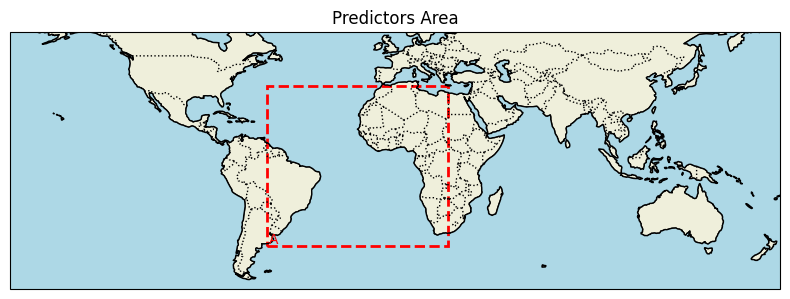

In [133]:
plot_map([extent[1],extent[3],extent[2],extent[0]], sst_indices = zones_for_PCR, title="Predictors Area",fig_size=(8,6))

In [134]:
predictor = retrieve_single_zone_for_PCR(dir_to_save_Reanalysis, zones_for_PCR, variables_reanalysis[0], year_start, year_end, season, 1991, 2020, standardize=True)

In [135]:
predictor = retrieve_single_zone_for_PCR(dir_to_save_Reanalysis, zones_for_PCR, variables_reanalysis[0], year_start, year_end, season, clim_year_start, clim_year_end)
predictor_f = predictor.isel(T=slice(None,-1))

In [136]:
was_cca_ = WAS_CCA(n_modes=n_modes, n_pca_modes=8, dist_method=dist_method)
was_cv = was_cv = WAS_Cross_Validator(n_splits=len(rainfall.get_index("T")), nb_omit=2)

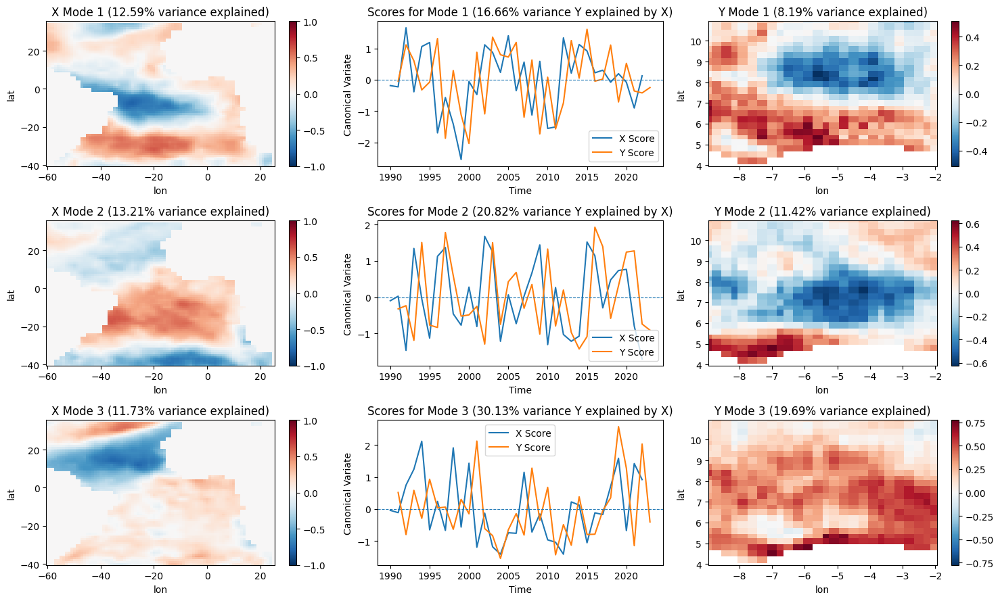

In [137]:
was_cca_.plot_cca_results(X=predictor_f, Y=rainfall , clim_year_start=clim_year_start, clim_year_end=clim_year_end)

In [138]:
predictor_f['T'] = rainfall['T']
if dist_method=="bestfit":
    hindcast_det_cca, hindcast_prob_cca = was_cv.cross_validate(was_cca_, rainfall, predictor_f, clim_year_start, clim_year_end, best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
else:
    hindcast_det_cca, hindcast_prob_cca = was_cv.cross_validate(was_cca_, rainfall, predictor_f, clim_year_start, clim_year_end)
hdcst_consolidated['CCA_ERSST'] = hindcast_det_cca.sel(T=slice(str(year_start_model),str(year_end_model)))
hdcst_consolidated_prob['CCA_ERSST'] = hindcast_prob_cca.sel(T=slice(str(year_start_model),str(year_end_model)))

Cross-validation ongoing


100%|██████████████████████████████████████████████████████████████████████████████████| 35/35 [00:08<00:00,  4.27it/s]


### Verification

In [139]:
score = ['Pearson','MAE']
# model_name = "Obs-Lag"

###### Deterministic

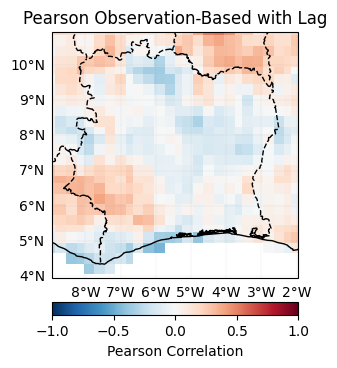

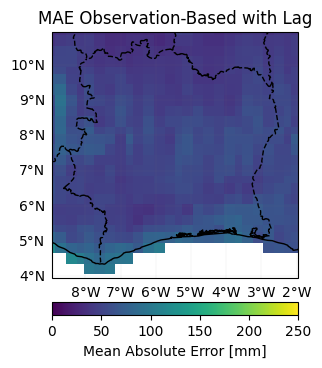

In [140]:
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall,
        hindcast_det_cca
    )
    scores_consolidated[i] = {'CCA_ERSST': r}
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

###### Probabilistic

In [141]:
score = ['GROC','RPSS']

Generalized Discrimination Score


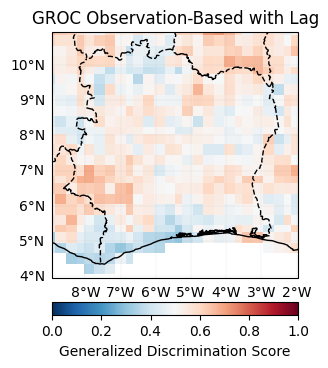

Ranked Probability Skill Score


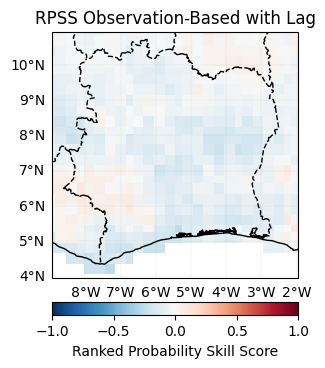

In [142]:
score = score.append('GROC') if 'GROC' not in score else score
hindcast_prob_obsBased_all = {}
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall,
        hindcast_prob_cca,
        clim_year_start,
        clim_year_end)
    scores_consolidated[i] = {'CCA_ERSST': r}      
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

### Forecast

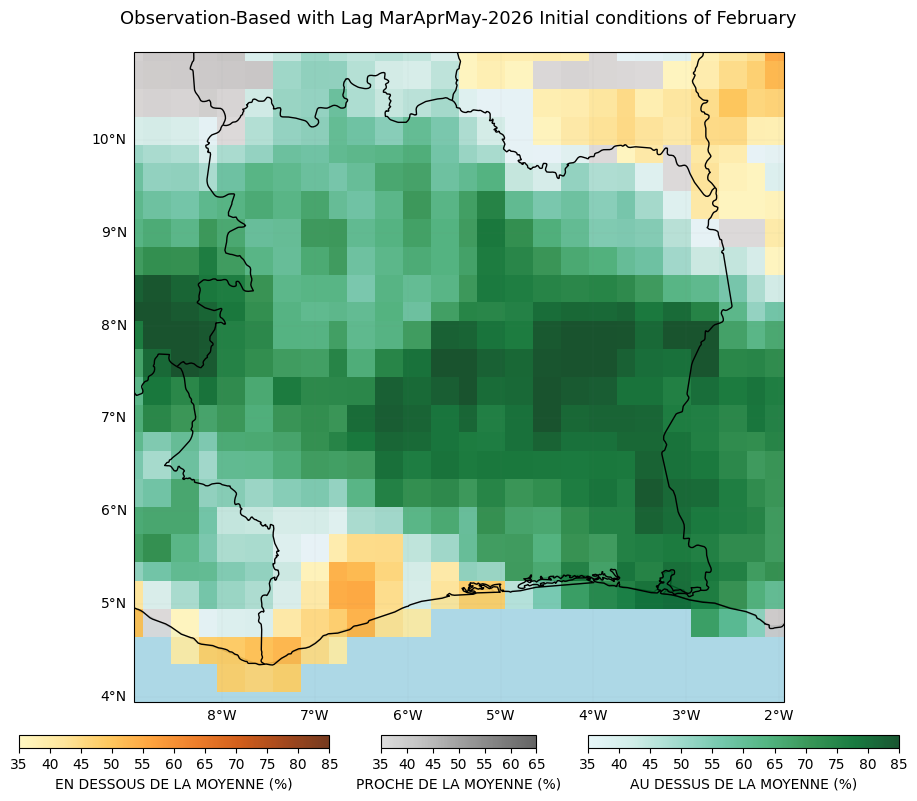

In [143]:
f_predictors = predictor.isel(T=[-1])
f_predictors['T'] = forecast_det_gcm['T']
if dist_method=="bestfit":
    forecast_det_cca, forecast_prob_cca = was_cca_.forecast(rainfall, clim_year_start, clim_year_end, predictor_f, hindcast_det_cca, f_predictors, best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
else:
    forecast_det_cca, forecast_prob_cca = was_cca_.forecast(rainfall, clim_year_start, clim_year_end, predictor_f, hindcast_det_cca, f_predictors)    
fcst_consolidated['CCA_ERSST'] = forecast_det_cca
fcst_consolidated_prob['CCA_ERSST'] = forecast_prob_cca
plot_prob_forecasts_(f"{dir_to_forecast}", 
                    forecast_prob_cca.drop_vars('T').squeeze(), f"{model_name} {season_str}-{forecast} Initial conditions of {calendar.month_name[int(month_of_initialization)]}",
                    hspace=0.1, labels=fcst_labels,
                    reverse_cmap=False)

# 4th - Analog-based seasonal forecast

## Analog bias_based

In [144]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [145]:
model = WAS_Analog(
    dir_to_save=f"{dir_s2s}/analog",
    year_start=1990,
    year_forecast=2025,          # target forecast year
    month_of_initialization=12,   # May initialisation
    predictor_vars=[{'reanalysis_name': 'NOAA', 'model_name': 'ECMWF_51', 'variable': 'SST', 'area': [40, -180, -35, 100]},
                    # {'reanalysis_name': 'ERA5', 'model_name': 'NCEP_2', 'variable': 'SLP', 'area': [80, -60, -80, 60]},
                    # {'reanalysis_name': 'ERA5', 'model_name': 'NCEP_2', 'variable': 'VGRD_850', 'area': [30, -45, -20, 15]}
                   ],
    method_analog="bias_based",
    standardize=True,
    rolling=3,
    lead_time=[1,2,3],
    clim_year_start=clim_year_start, 
    clim_year_end=clim_year_end,
    dist_method=dist_method
)

#### Cross-validation

In [146]:
was_analog_cv = WAS_Cross_Validator(n_splits=len(rainfall.get_index("T")), nb_omit=2)

In [147]:
if dist_method=="bestfit":
    hindcast_analog_det, hindcast_analog_prob = was_analog_cv.cross_validate(model, rainfall, clim_year_start=clim_year_start, clim_year_end=clim_year_end, best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
else:
    hindcast_analog_det, hindcast_analog_prob = was_analog_cv.cross_validate(model, rainfall, clim_year_start=clim_year_start, clim_year_end=clim_year_end)    
hdcst_consolidated['fourth.approach'] = hindcast_analog_det.sel(T=slice(str(year_start_model),str(year_end_model)))
hdcst_consolidated_prob['fourth.approach'] = hindcast_analog_prob.sel(T=slice(str(year_start_model),str(year_end_model)))

Cross-validation ongoing


  0%|                                                                                           | 0/35 [00:00<?, ?it/s]

Starting download for NOAA ERSST (v6) for 1990-2025
All files downloaded. merging and processing...
<xarray.Dataset> Size: 28MB
Dimensions:  (T: 432, Y: 89, X: 180)
Coordinates:
  * Y        (Y) float64 712B -88.0 -86.0 -84.0 -82.0 ... 82.0 84.0 86.0 88.0
  * T        (T) datetime64[ns] 3kB 1990-01-15 1990-02-15 ... 2025-12-15
  * X        (X) float64 1kB -180.0 -178.0 -176.0 -174.0 ... 174.0 176.0 178.0
Data variables:
    sst      (T, Y, X) float32 28MB dask.array<chunksize=(1, 89, 180), meta=np.ndarray>
Attributes: (12/66)
    Conventions:                     CF-1.6, ACDD-1.3
    metadata_link:                   gov.noaa.ncei:C01737
    id:                              ersst.v6.199001.nc
    naming_authority:                gov.noaa.ncei
    title:                           NOAA monthly ERSSTv6 (in situ only)
    summary:                         Monthly ERSSTv6 is developed based on v5...
    ...                              ...
    comment:                         SSTs were observe

2026-02-21 15:03:14,809 INFO Request ID is addb85a9-1c89-47ee-9da5-0531c4f31e9f
2026-02-21 15:03:14,961 INFO status has been updated to accepted
2026-02-21 15:03:23,692 INFO status has been updated to running
2026-02-21 15:03:28,915 INFO status has been updated to successful


d1ebe1d54016faed20fe0f80fc3aa901.nc:   0%|          | 0.00/6.68M [00:00<?, ?B/s]

Downloaded forecast: PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc
Saved processed hindcast to PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc


2026-02-21 15:03:36,720 INFO Request ID is 872c4bbe-5028-4903-b46f-f7fd2cf1c9b3
2026-02-21 15:03:36,872 INFO status has been updated to accepted
2026-02-21 15:03:45,586 INFO status has been updated to successful


e0ab585ddbc713102f58e88ddc775408.nc:   0%|          | 0.00/55.0M [00:00<?, ?B/s]

Downloaded hindcast: PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc
Saved processed hindcast to PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


  3%|██▎                                                                             | 1/35 [10:30<5:57:09, 630.29s/it]

Similar years for 1991: [2002 1994]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


  6%|████▌                                                                           | 2/35 [10:46<2:28:01, 269.12s/it]

Similar years for 1992: [1995 1994]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


  9%|██████▊                                                                         | 3/35 [11:03<1:22:11, 154.12s/it]

Similar years for 1993: [1991 2012]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 11%|█████████▎                                                                        | 4/35 [11:22<52:03, 100.75s/it]

Similar years for 1994: [2004 2003]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 14%|███████████▊                                                                       | 5/35 [11:39<35:14, 70.48s/it]

Similar years for 1995: [2005 2007]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 17%|██████████████▏                                                                    | 6/35 [11:55<25:07, 51.97s/it]

Similar years for 1996: [2000 2013]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 20%|████████████████▌                                                                  | 7/35 [12:12<18:49, 40.34s/it]

Similar years for 1997: [2009 2002]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 23%|██████████████████▉                                                                | 8/35 [12:28<14:41, 32.64s/it]

Similar years for 1998: [2011 2010]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 26%|█████████████████████▎                                                             | 9/35 [12:44<11:55, 27.52s/it]

Similar years for 1999: [2008 2011]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 29%|███████████████████████▍                                                          | 10/35 [13:09<11:09, 26.79s/it]

Similar years for 2000: [2008 1996]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 31%|█████████████████████████▊                                                        | 11/35 [13:34<10:31, 26.30s/it]

Similar years for 2001: [2013 2006]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 34%|████████████████████████████                                                      | 12/35 [13:55<09:28, 24.71s/it]

Similar years for 2002: [2004 2006]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 37%|██████████████████████████████▍                                                   | 13/35 [14:12<08:09, 22.26s/it]

Similar years for 2003: [2006 1994]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 40%|████████████████████████████████▊                                                 | 14/35 [14:28<07:09, 20.46s/it]

Similar years for 2004: [2006 2002]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 43%|███████████████████████████████████▏                                              | 15/35 [14:46<06:30, 19.52s/it]

Similar years for 2005: [1995 2003]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 46%|█████████████████████████████████████▍                                            | 16/35 [15:04<06:02, 19.07s/it]

Similar years for 2006: [2003 2004]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 49%|███████████████████████████████████████▊                                          | 17/35 [15:22<05:37, 18.76s/it]

Similar years for 2007: [1995 2005]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 51%|██████████████████████████████████████████▏                                       | 18/35 [15:39<05:13, 18.45s/it]

Similar years for 2008: [2000 1999]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 54%|████████████████████████████████████████████▌                                     | 19/35 [16:00<05:06, 19.19s/it]

Similar years for 2009: [2002 2006]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 57%|██████████████████████████████████████████████▊                                   | 20/35 [16:26<05:14, 21.00s/it]

Similar years for 2010: [1998 2007]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 60%|█████████████████████████████████████████████████▏                                | 21/35 [16:51<05:13, 22.41s/it]

Similar years for 2011: [2022 2008]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 63%|███████████████████████████████████████████████████▌                              | 22/35 [17:14<04:52, 22.46s/it]

Similar years for 2012: [2006 2001]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 66%|█████████████████████████████████████████████████████▉                            | 23/35 [17:39<04:40, 23.36s/it]

Similar years for 2013: [2021 2004]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 69%|████████████████████████████████████████████████████████▏                         | 24/35 [18:05<04:25, 24.11s/it]

Similar years for 2014: [2018 2002]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 71%|██████████████████████████████████████████████████████████▌                       | 25/35 [18:31<04:06, 24.68s/it]

Similar years for 2015: [2023 2019]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 74%|████████████████████████████████████████████████████████████▉                     | 26/35 [18:57<03:44, 24.98s/it]

Similar years for 2016: [2019 2024]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 77%|███████████████████████████████████████████████████████████████▎                  | 27/35 [19:23<03:21, 25.23s/it]

Similar years for 2017: [2025 2020]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 80%|█████████████████████████████████████████████████████████████████▌                | 28/35 [19:47<02:54, 24.95s/it]

Similar years for 2018: [2006 2014]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 83%|███████████████████████████████████████████████████████████████████▉              | 29/35 [20:11<02:28, 24.72s/it]

Similar years for 2019: [2024 2016]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 86%|██████████████████████████████████████████████████████████████████████▎           | 30/35 [20:39<02:07, 25.56s/it]

Similar years for 2020: [2025 2024]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 89%|████████████████████████████████████████████████████████████████████████▋         | 31/35 [21:03<01:40, 25.21s/it]

Similar years for 2021: [2025 2013]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 91%|██████████████████████████████████████████████████████████████████████████▉       | 32/35 [21:31<01:18, 26.02s/it]

Similar years for 2022: [2011 2025]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 94%|█████████████████████████████████████████████████████████████████████████████▎    | 33/35 [21:59<00:53, 26.65s/it]

Similar years for 2023: [2015 2009]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


 97%|███████████████████████████████████████████████████████████████████████████████▋  | 34/35 [22:24<00:26, 26.17s/it]

Similar years for 2024: [2020 2019]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.


100%|██████████████████████████████████████████████████████████████████████████████████| 35/35 [22:41<00:00, 38.90s/it]

Similar years for 2025: [2021 2020]


#### Verification

###### Deterministic

In [148]:
score = ['Pearson','MAE']
model_name = "Analogue-Based Forecasting"

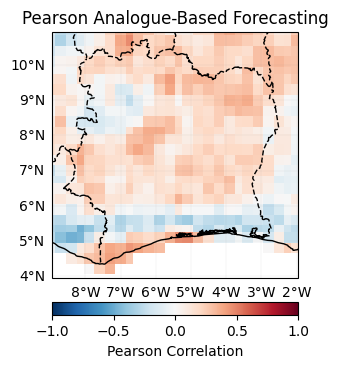

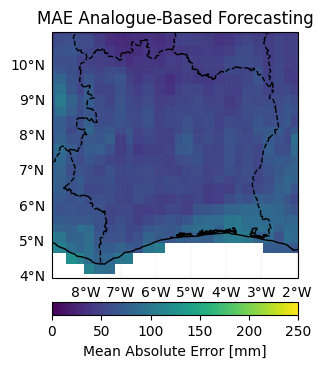

In [149]:
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall,
        hindcast_analog_det
    )
    scores_consolidated[i] = {'fourth.approach': r}
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

###### Probabilistic

In [150]:
score = ['GROC', 'RPSS']

Generalized Discrimination Score


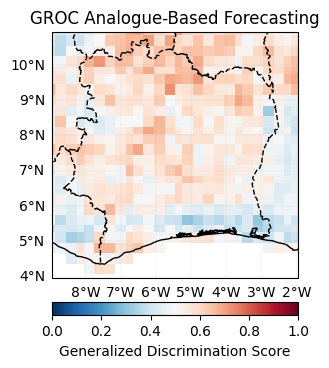

Ranked Probability Skill Score


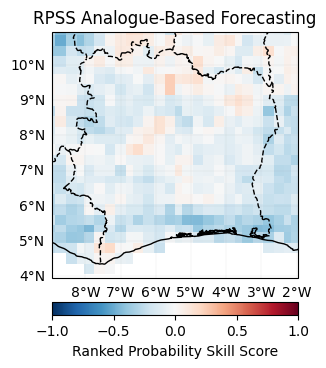

In [151]:
score = score.append('GROC') if 'GROC' not in score else score
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall,
        hindcast_analog_prob,
        clim_year_start,
        clim_year_end)
    scores_consolidated[i] = {'fourth.approach': r}
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

#### Forecast

PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.
Similar years for 2025: [2021 2020]
Similar years for 2025: [2021 2020]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mea

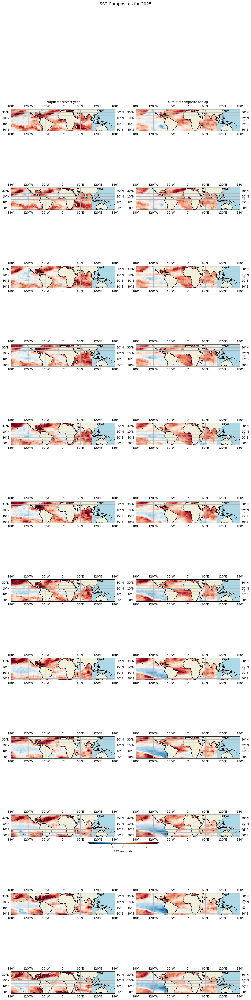

array([2021, 2020], dtype=int64)

In [152]:
## Analysis SST evolution
model.composite_plot(rainfall, clim_year_start, clim_year_end, 
                     hindcast_analog_det, plot_predictor=True,
                    variable="SST", best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)

PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.
Similar years for 2025: [2021 2020]
Similar years for 2025: [2021 2020]
PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mea

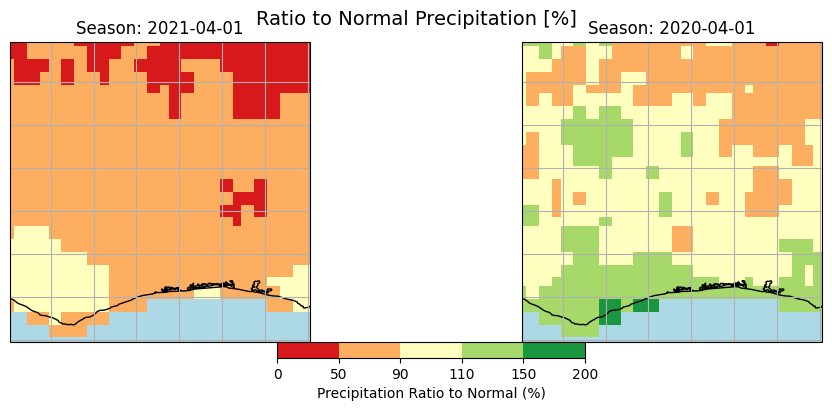

array([2021, 2020], dtype=int64)

In [153]:
## Plot silimar years behavior
model.composite_plot(rainfall, clim_year_start, clim_year_end, hindcast_analog_det, plot_predictor=False, best_code_da=best_code_da,
                     best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)

PRCP_MAM_2026_ic_1\analog\NOAA_SST_1990_2025_JanFebMarAprMayJunJulAugSepOctNovDec_40-180-35100.nc exists. Skipping download.
Forecast file PRCP_MAM_2026_ic_1\analog\forecast_ecmwf51_SST_2025_DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Hindcast file PRCP_MAM_2026_ic_1\analog\hindcast_ecmwf51_SST_1994_2016DecIc_JanFebMar_1_40-180-35100.nc exists. Skipping download.
Processing variables: ['SST']
Applied rolling mean with window size 3 for SST.
Standardizing timeseries for SST.
Similar years for 2025: [2021 2020]
Similar years for 2025: [2021 2020]


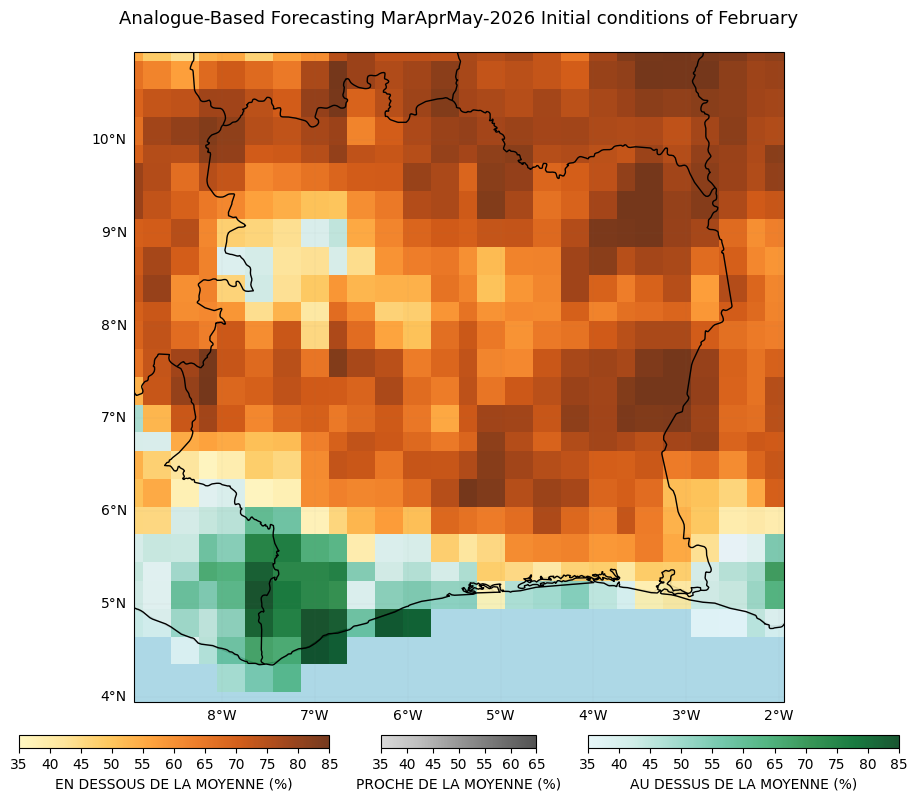

In [154]:
if dist_method=="bestfit":
    similar_years, forecast_det_analog, forecast_prob_analog = model.forecast(rainfall, clim_year_start, clim_year_end, hindcast_analog_det, best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
else:
    similar_years, forecast_det_analog, forecast_prob_analog = model.forecast(rainfall, clim_year_start, clim_year_end, hindcast_analog_det)    
fcst_consolidated['fourth.approach'] = forecast_det_analog
fcst_consolidated_prob['fourth.approach'] = forecast_prob_analog
plot_prob_forecasts_(f"{dir_to_forecast}", forecast_prob_analog.drop_vars('T').squeeze(), f"{model_name} {season_str}-{forecast} Initial conditions of {calendar.month_name[int(month_of_initialization)]}",
                    hspace=0.1, labels=fcst_labels,
                    reverse_cmap=False)

# Consolidated Forecasts

In [155]:
best_models = list(hdcst_consolidated.keys())
best_models 

['SV-ML-CMME_MLP',
 'SV-ML-CMME_ELM',
 'SV-ML-CMME_XGBOOST',
 'ECMWF_51.VGRD_850_snd.approach',
 'ECCC_5.VGRD_850_snd.approach',
 'BOM_2.VGRD_850_snd.approach',
 'BOM_2.SST_snd.approach',
 'NASA_1.SST_snd.approach',
 'NCAR_CESM1_1.SST_snd.approach',
 'NCAR_CCSM4_1.SST_snd.approach',
 'ECCC_5.SST_snd.approach',
 'ECCC_4.SST_snd.approach',
 'ECMWF_51.SST_snd.approach',
 'NCEP_2.SST_snd.approach',
 'MLR_VIF.ERSST',
 'CCA_ERSST',
 'fourth.approach']

#### Cross-validation

In [156]:
all_model_hdcst, all_model_fcst, obs, best_score = process_datasets_for_mme(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))),hdcsted=hdcst_consolidated, fcsted=fcst_consolidated, gcm=False, ELM_ELR=False,  Prob=False, best_models=best_models, scores=scores_consolidated, model=False, score_metric="GROC")

In [157]:
was_mme = WAS_mme_Weighted(equal_weighted=False, dist_method=dist_method, metric="GROC", threshold=0.6)

In [158]:
hindcast_det, forecast_det  = was_mme.compute(obs, all_model_hdcst, all_model_fcst.isel(T=[1]), best_score, complete=True)
hindcast_prob = was_mme.compute_prob(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), clim_year_start, clim_year_end, hindcast_det, best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)

#### Verification

###### Deterministic

In [159]:
score = ['Pearson','MAE']
model_name = "Consolidated Forecast"

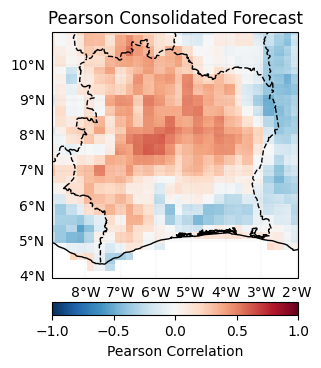

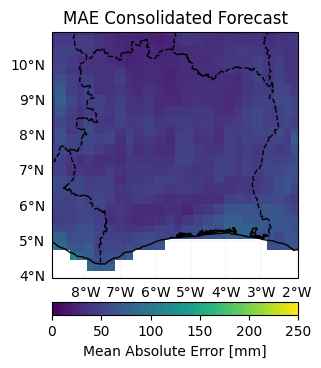

In [160]:
for i in score:
    r = was_verify.compute_deterministic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall.sel(T=slice(str(year_start_model),str(year_end_model))),
        hindcast_det
    )
    if i=='Pearson':
        r_cor = r    
    r.to_dataset(name="Equaly weigthed")
    r.to_netcdf(f"{dir_s2s}/equaly_{i}.nc")
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

###### Probabilistic

In [161]:
score = ['GROC', 'RPSS']

Generalized Discrimination Score


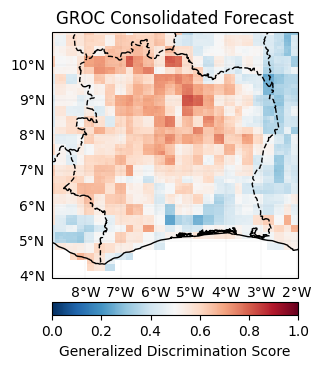

Ranked Probability Skill Score


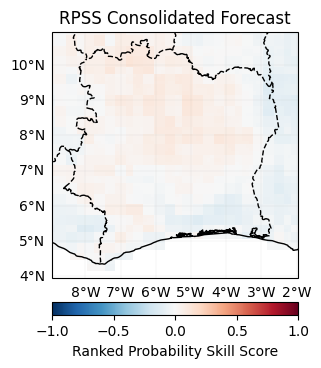

In [162]:
score = score.append('GROC') if 'GROC' not in score else score
for i in score:
    print(was_verify.scores[i][0])
    r = was_verify.compute_probabilistic_score(
        was_verify.get_scores_metadata()[i][5],
        rainfall.sel(T=slice(str(year_start_model),str(year_end_model))),
        hindcast_prob,
        clim_year_start,
        clim_year_end)
    r.to_dataset(name="Equaly weigthed")
    r.to_netcdf(f"{dir_s2s}/equaly_{i}.nc")
    was_verify.plot_model_score(r, i, dir_save_score, model_name)

### Forecast

Level 2 requested. Switching source to 'gadm'...


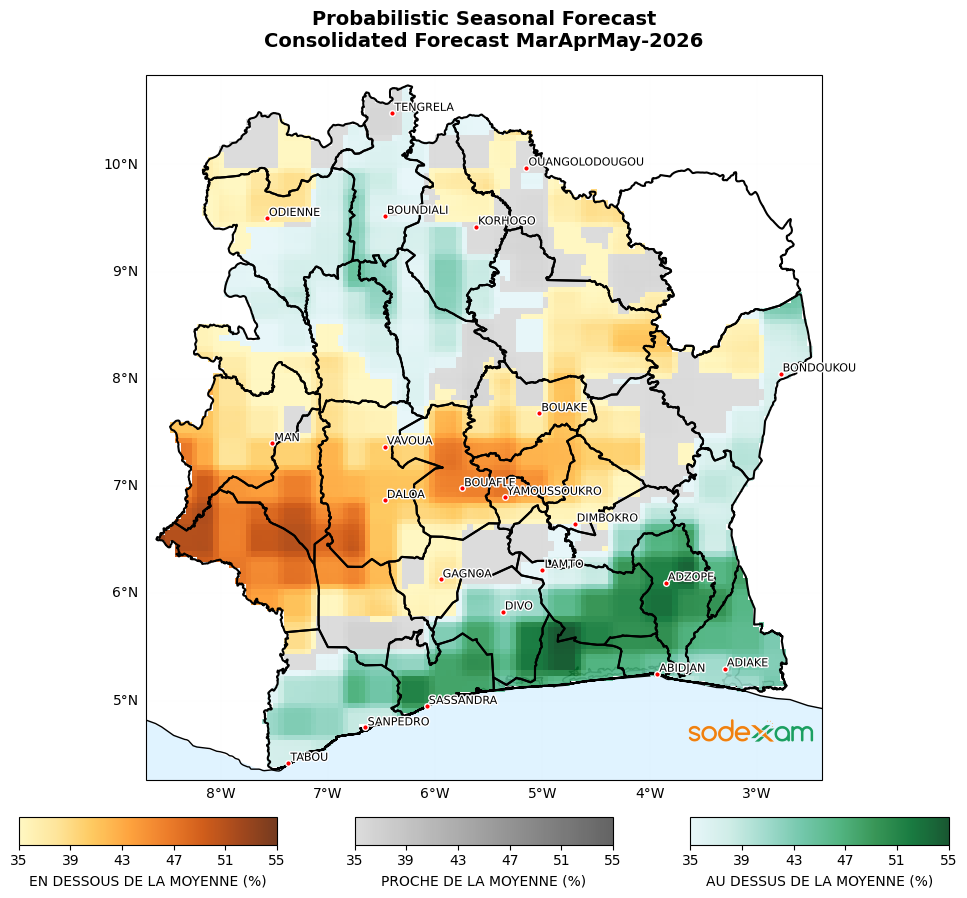

13806

In [164]:
_,forecast_prob = was_mme.forecast(rainfall.sel(T=slice(str(year_start_model),str(year_end_model))), clim_year_start, clim_year_end, hindcast_det, forecast_det,best_code_da=best_code_da, best_shape_da=best_shape_da, best_loc_da=best_loc_da, best_scale_da=best_scale_da)
r_cor = xr.where(r_cor <= 0, np.nan, 1)
plot_prob_forecasts(dir_to_forecast, r_cor*forecast_prob.drop_vars('T').squeeze(),
                    f"{model_name} {season_str}-{forecast}" ,
                    country_code=country_iso3,
                    source="gadm",
                    admin_level=2,             
                    stations_df=df_filtered,
                    reverse_cmap=False,  
                    hspace=0.1, 
                    labels=fcst_labels, 
                    logo=logopath, 
                    logo_size=('21%', '14%'),
                    logo_position='lower right',
                    res = 0.05)
gc.collect()

Saved figure: PRCP_MAM_2026_ic_1/forecasts/Consolidated Forecast MarAprMay-2026.png


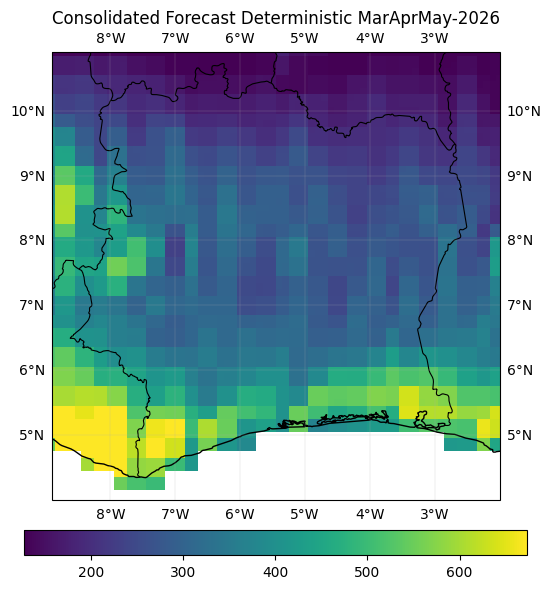

4961

In [165]:
plot_det_forecasts(forecast_det.drop_vars('T').squeeze(),
                    f"{model_name} Deterministic {season_str}-{forecast}", f"{dir_to_forecast}/{model_name} {season_str}-{forecast}.png")
gc.collect()

In [166]:
forecast_det.to_netcdf(f'{dir_to_forecast}/Forecast_Det_PRCP{season_str}_{forecast}.nc')

In [167]:
forecast_prob.to_netcdf(f'{dir_to_forecast}/Forecast_Prob_PRCP{season_str}_{forecast}.nc')

In [170]:
!jupyter nbconvert --to html --no-input ./Template_seasonal_CIV_PRCP_MAM_2026.ipynb

[NbConvertApp] Converting notebook ./Template_seasonal_CIV_PRCP_MAM_2026.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 165 image(s).
[NbConvertApp] Writing 20818778 bytes to Template_seasonal_CIV_PRCP_MAM_2026.html
